# Setup

In [ ]:
# Install necessary packages
!pip install bayesian-optimization
!python -m spacy download pt_core_news_sm

# Standard Libraries
import os
import re
import string
import time
from enum import Enum

# Data Manipulation and Analysis
import numpy as np
import pandas as pd

# Natural Language Processing
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
nltk.download('stopwords')
nltk.download('wordnet')

# Load spaCy Portuguese model
nlp = spacy.load("pt_core_news_sm")

# Visualization Libraries
import matplotlib.pyplot as plt
import networkx as nx
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.models import Circle, Legend, LegendItem, MultiLine
from bokeh.models.graphs import NodesAndLinkedEdges
from bokeh.palettes import Blues256, Blues8, Greens256, Oranges256, Turbo256
from bokeh.plotting import figure, from_networkx
from IPython.display import Audio, clear_output, display

# Machine Learning Libraries
from bayes_opt import BayesianOptimization
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import (accuracy_score, auc, classification_report,
                             confusion_matrix, f1_score, mean_absolute_error,
                             mean_squared_error, r2_score, roc_auc_score,
                             roc_curve)
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV,
                                     StratifiedKFold, cross_val_score,
                                     train_test_split)
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
from xgboost import XGBClassifier
from sklearn.base import clone
from sklearn.metrics import f1_score, precision_score

# Utility
import joblib

2023-10-05 11:06:26.993829: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
  Using cached https://github.com/explosion/spacy-models/releases/download/pt_core_news_sm-3.6.0/pt_core_news_sm-3.6.0-py3-none-any.whl (13.0 MB)
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
!pip install infomap
import infomap

In [ ]:
!pip install leidenalg
import leidenalg

# Utilities

In [ ]:
TESTING_POSTS = [
    "Mais um dia Esse bar dos infernos  , atrapalhando nosso descanso com esse bando de drogados e cachaceiros dos infernos  ,,, prefeitura nada faz nos trabalhadores e pais de família  temos  que se segurar para não explodir💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣 essa merda de bar , fora tem uma vadia 🐄🐄🐄🐄🐄🐄🐄que grita igual uma filha puta acordando nossos filhos que recém nascido  ,,, estou tão estressada  que minha vontade  de arrancar língua dela na faca 😤😤😤😤🤬🤬🤬🗣🗣🗣🗣🗣🐄🐄🐄🐄🐄🐍🐍🐍🐍🐍🐍,,,, prefeitura pelo amor Deus verifica se esse lixo💩💩💩💩💩💩 tem alvará  de funcionamento  pois qualquer hora essa vai dar merda ☠☠☠☠☠☠☠☠,,,, lugar música alta, gritos , brigas, jogos uma verdadeira merda estou odiando morar aquiii digo logo vai dar merda ,,,, bar ñ deveria existir bairro como este meus filhos ñ descansa  barulho infernos  ,,,, 💣💣💣🕳🕳🕳🕳👹👹👹☠☠☠☠",
    "A Ótica Diniz permanece em funcionamento na Avenida Sete de Setembro 201, Icaraí, expondo de forma irresponsável e desnecessária os seus funcionários.  Este tipo de estabelecimento não era para estar com as suas lojas fechadas? Há três outras óticas nas proximidades, todas fechadas desde sexta-feira.",
    "Esta cratera foi aberta depois da ultima chuva na rua pau Brasil no engenho do mato q sofre com alagamentos devido as chuvas e nenhuma providência é tomada pela prefeitura de Niteroi..Os carros tem mta dificuldades em passar fazendo c q os moradores da Rua Pau Brasil não consigam chegar em suas próprias casas...",
    "Eu venho pela centésima vez pedir pra que tomem alguma providência sobre o pub jardim. Estamos há exatos 8 meses sem solução. Eu comento no protocolo já existente mas não obtenho resposta. A fiscalização prometida nunca bateu lá com o bar funcionando com música. O bar vara a madrugada com música, fim de semana é música o dia todo, a gente não tem um descanso. Tá bem difícil. Sei que vocês do colab encaminham a solicitação sempre. Mas eu gostaria de alguma direção já que reclamar aqui não está adiantando. (são 8 meses desse inferno). então por favor, me direcionem pra algum canal onde eu possa ter mais resultado. Polícia não adianta, Cisp não adianta. por favor me dêem um caminho pq daqui a pouco vou ficar maluca aqui sem sanidade nenhuma.",
    "Estabelecimento próximo deste número.  Essa igreja/ centro de culto é recorrente o barulho alto além do horário das 22h, as quartas, sextas e domingos no seu horário de culto. Algo que se houve há 50m de distância. Berram aos montes no microfone ou sei lá o que usam lá dentro. Infelizmente não acho que não consigo colocar vídeo do barulho que fazem. Estou colocando isso numa quarta (11/03/2020) as 22:26 e ainda estão em culto gritando. Senão bastasse o barulho as pessoas que ali frequentam estacionam nas vias ao redor em cima da calçada, e ao término do culto saem berrando ainda na rua como se não houvessem moradores ao redor. Precisam notificar essa igreja sobre a lei do silêncio e fazerem mesmo em horário normal não gritarem tanto lá dentro.",
    "agradeço pela poda das árvores, mas peso urgência por favor, as árvores destruíram a calçada em frente ao prédio, as raízes estão muito altas e não temos como concertar desse jeito que está, o que fazer, as pessoas estão tropeçando e caindo.\naguardo resposta.",
    "Bom dia! postes com lâmpadas apagadas, em frente a casa 84, e em frente a casa 100.",
    "São duas lampadas quimadas um poste proximo ao outro, ficando muito escuro durante a noite, e tem varias famílias que precisam \ndessas lampadas iluminando a frente de suas casas, incluindo eu. Já fizemos 5 pedidos e já fazem 4 meses com essas lampadas queimadas. Já nós informaram a troca, só que não é verdadeiro essa informação , eu moro de frente a um desses postes com lampada queimada.\n Peço que por favor nos atendam. Obrigado",
    "precisamos desobstruir bueiro de água fluvial pós o mesmo está intupido já foram feitos vários pedidos este bueiro e super importante para o bairro pedimos os órgãos competente pós ele evita enchetes"
]

In [ ]:
def print_dataframe(df, line_width=200):
    """
    Print the DataFrame with the specified line width.

    :param df: pandas.DataFrame
        The DataFrame to be printed.
    :param line_width: int, optional
        The width of the printed lines. Default is 200.
    """
    formatted_df = df.to_string(line_width=line_width)
    print(formatted_df)
##

In [ ]:
def print_persona_statistics(df, num_nodes):
    """
    Imprime o número total de usuários, o número total de nós,
    e a contagem e porcentagem de cada categoria na coluna 'persona'.

    :param df: pandas.DataFrame
        O DataFrame contendo a coluna 'persona'.
    :param num_nodes: int
        O número total de nós.
    """
    # Calcule o número total de usuários classificados
    total_users = len(df)

    # Calcule a contagem de valores para cada categoria
    counts = df['persona'].value_counts(dropna=False)

    # Calcule a porcentagem de cada categoria
    percentages = counts / total_users * 100

    # Calcule a porcentagem de nós classificados
    classified_percentage = total_users / num_nodes * 100

    # Imprima o número total de nós, o número total de usuários e a porcentagem de nós classificados
    print(f"Numero de nós: {num_nodes}")
    print(f"Numero de usuários classificados: {total_users} ({classified_percentage:.2f}%)")

    # Imprima a contagem e porcentagem de cada categoria
    for category, count in counts.items():
        category_name = 'Nao classificado' if pd.isna(category) else category.capitalize()
        print(f"{category_name}: {count} ({percentages[category]:.2f}%)")
##

In [ ]:
def filter_dataframe_by_nodes(df, nodes):
    """
    Filtra o DataFrame para incluir apenas as linhas cujo 'colab_user_id' está presente em 'nodes'.

    :param df: pandas.DataFrame
        O DataFrame a ser filtrado.
    :param nodes: list of str
        A lista de IDs de nós pelos quais o DataFrame será filtrado.
    :return: pandas.DataFrame
        O DataFrame filtrado.
    """
    # Certifique-se de que 'colab_user_id' e os nós são do mesmo tipo
    df['colab_user_id'] = df['colab_user_id'].astype(str)
    nodes = [str(node) for node in nodes]

    # Filtra o DataFrame
    filtered_df = df[df['colab_user_id'].isin(nodes)]
    return filtered_df

In [ ]:
def calculate_time_taken(func):
    def wrapper(*args, **kwargs):
        start_time = time.time()
        try:
            result = func(*args, **kwargs)
        except Exception as e:
            playErrorSound()
            print(f"An error occurred: {e}")
            raise  # Re-lança a exceção para que o código chamador possa lidar com ela se necessário
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken: {elapsed_time:.2f} seconds")
        playSound()
        return result
    return wrapper
##
def find_and_print_user_by_id(df, user_id):
    user_row = df[df['colab_user_id'] == user_id]
    if not user_row.empty:
        print(user_row)
    else:
        print(f"No row found with colab_user_id {user_id}")
###
# Play a sound
def playSound():
    sound_file = 'https://freesound.org/data/previews/80/80921_1022651-lq.mp3'
    try:
      display(Audio(sound_file, autoplay=True))
    except Exception as e:
      print("error playing sound lmao")
####
# Play a sound
def playErrorSound():
    sound_file = 'https://cdn.freesound.org/previews/450/450616_9159316-lq.mp3'
    display(Audio(sound_file, autoplay=True))
####

In [ ]:
#
class ModelType(Enum):
    MULTINOMIAL_NB = "MultinomialNB"
    RANDOM_FOREST = "RandomForest"
    LOGISTIC_REGRESSION = "LogisticRegression"
    DECISION_TREE = "DecisionTree"
    KNN = "KNN"
    SVC = "SVC"
    XGBOOST = "XGBoost"
    LIGHTGBM = "LightGBM"
    CATBOOST = "CatBoost"

In [ ]:
import textwrap
def log_post_and_predict(classifier, text):
  #wrapped_text = textwrap.fill(text, width=50)
  #print("----------------------------POST------------------------------")
  #print(wrapped_text)
  #print("----------------------------POST------------------------------")
  print(f"Result: {classifier.predict(text, True)}")

In [ ]:
class MessageSanitizer:
    def __init__(self, custom_stopwords=None, nlp_model=None, lemmatizer=None):
        self.stopwords_pt = stopwords.words('portuguese')
        self.custom_stopwords = custom_stopwords or []
        self.all_stopwords = self.stopwords_pt + self.custom_stopwords
        self.nlp = nlp_model or nlp
        self.lemmatizer = lemmatizer or WordNetLemmatizer()

    def anonimizar(self, texto):
        try:
            doc = self.nlp(texto)
            for ent in doc.ents:
                if ent.label_ == "PER":
                    texto = texto.replace(ent.text, "|_NOME_|")
                elif ent.label_ == "ORG":
                    texto = texto.replace(ent.text, "|_ORG_|")

            # Anonimizar e-mails
            email_pattern = r"[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,3}"
            texto = re.sub(email_pattern, "|_EMAIL_|", texto)

            # Anonimizar números de telefone (formatos comuns)
            phone_pattern = r"(\+\d{1,3}[-.\s]?)?\(?\d{1,4}\)?[-.\s]?\d{1,4}[-.\s]?\d{4,6}"
            texto = re.sub(phone_pattern, "|_TELEFONE_|", texto)
        except Exception as e:
            print(f"Erro ao anonimizar: {e}")
            return ""
        return texto

    def sanitize(self, texto):
        try:
            texto = self.anonimizar(texto)
            texto_lower = str(texto).lower()
            documento = self.nlp(texto_lower)
            lista = [token.text for token in documento]

            # Lemmatization
            lista = [self.lemmatizer.lemmatize(token) for token in lista]

            lista = [palavra for palavra in lista if palavra not in self.all_stopwords and palavra not in string.punctuation and not palavra.isdigit()]
            return " ".join(lista)
        except Exception as e:
            print(f"Erro no preprocessamento: {e}")
            return ""

In [ ]:
# Inicializar o lemmatizer
lemmatizer = WordNetLemmatizer()
custom_stopwords = ["rua", "pois"]
# Criar uma instância de MessageSanitizer com as stopwords customizadas
message_sanitizer = MessageSanitizer(custom_stopwords=custom_stopwords)

In [ ]:
message_sanitizer.sanitize(TESTING_POSTS[0])

'dia bar inferno   atrapalhando descanso bando drogados cachaceiros inferno   prefeitura nada faz trabalhadores pais família     segurar explodir 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 💣 merda bar forum vadia 🐄 🐄 🐄 🐄 🐄 🐄 🐄 grita igual filha puta acordando filhos recém nascido   tão estressada   vontade   arrancar língua faca |_nome_| 🗣 🗣 🗣 🗣 🗣 🐄 🐄 🐄 🐄 🐄 |_org_||_org_||_org_| prefeitura amor |_nome_| verifica lixo 💩 💩 💩 💩 💩 💩 alvará   funcionamento   poi qualquer hora vai dar merda ☠ ☠ ☠ ☠ ☠ ☠ ☠ ☠ lugar música alta gritos brigas jogos verdadeira merda odiando morar aquiii digo logo vai dar merda bar ñ deveria existir bairro filhos ñ descansa   barulho inferno   💣 💣 💣 🕳 🕳 🕳 🕳 👹 👹 👹 ☠ ☠ ☠ ☠'

In [ ]:
def plot_pie_chart(df, column_name, title):
    # Count unique values
    counts = df[column_name].value_counts()

    # Plot pie chart
    plt.figure(figsize=(8, 6))

    # Explode slices for better visibility
    explode = [0.1] * len(counts)

    # Set labeldistance to position the percentages where the labels used to be
    plt.pie(counts, autopct='%1.1f%%', startangle=90, explode=explode, labeldistance=1.2)

    # Set the title from the parameter
    plt.title(title)

    # Create a legend box
    plt.legend(counts.index, title=column_name, bbox_to_anchor=(1, 0.5), loc='center left')

    plt.show()

# SentimentClassifierModel

In [ ]:
class SentimentClassifierModel:
    def __init__(self, train_file_url, message_sanitizer):
        self.train_file_url = train_file_url
        self.data = None
        self.cv = CountVectorizer()
        self.trained_models = {}
        self.current_model = None
        self.message_sanitizer = message_sanitizer
    #
    def load_data(self):
      self.data = pd.read_csv(self.train_file_url, low_memory=False)
      self.y = self.data['score']
    #
    def sanitize_phrase(self, phrase):
      return self.message_sanitizer.sanitize(phrase)
    #
    def vectorize_data(self):
        self.cv = CountVectorizer(stop_words=stopwords.words('portuguese'))
        words = self.cv.fit_transform(self.data.description)
        print("CountVectorizer is fitted.")
        self.x = words.toarray()
    #
    def train_model(self, model_type=ModelType.RANDOM_FOREST):
        x_train, x_valid, y_train, y_valid = train_test_split(self.x, self.y, test_size=0.25, random_state=42)
        sc = MinMaxScaler()
        x_train = sc.fit_transform(x_train)
        x_valid = sc.transform(x_valid)
        #
        if model_type == ModelType.RANDOM_FOREST:
            model = RandomForestRegressor()
        elif model_type == ModelType.LINEAR_REGRESSION:
            model = LinearRegression()
        elif model_type == ModelType.DECISION_TREE:
            model = DecisionTreeRegressor()
        elif model_type == ModelType.KNN:
            model = KNeighborsRegressor()
        else:
            raise ValueError("Invalid model_type. Supported values: 'RandomForest', 'LinearRegression', "
                            "'DecisionTree', 'KNN'")
        model.fit(x_train, y_train)
        y_pred = model.predict(x_valid)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_valid)

        mse = mean_squared_error(y_valid, y_pred)
        mae = mean_absolute_error(y_valid, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_valid, y_pred)

        print("Training R^2:", model.score(x_train, y_train))  # Renomeado para clareza
        print("Validation R^2:", model.score(x_valid, y_valid))  # Renomeado para clareza
        print("Mean Squared Error:", mse)
        print("MAE:", mae)
        print("RMSE:", rmse)
        print("R^2:", r2)
        #
        self.trained_models[model_type] = model
        self.current_model = model_type
    #
    def save_model(self, filename):
        joblib.dump((self.trained_models, self.cv), filename)
    #
    def predict(self, phrase, model_type=None):
        if model_type is None:
            model_type = self.current_model
        else:
            if model_type not in ModelType:
                raise ValueError("Invalid model_type. Supported values: 'RandomForest', 'LogisticRegression', "
                                "'DecisionTree', 'KNN'")
            if model_type not in self.trained_models:
                raise ValueError(f"Model '{model_type.value}' has not been trained yet.")
        #
        model = self.trained_models[model_type]
        phrase = self.sanitize_phrase(phrase)
        if not phrase.strip():  # Verifica se a frase está vazia ou contém apenas espaços em branco
            return {'status': 'error', 'message': 'Input phrase is empty after sanitization', 'score': 0, 'model': model_type.value}
        #
        vectorized_phrase = self.cv.transform([phrase]).toarray()
        sentiment_score = model.predict(vectorized_phrase)[0]
        #
        return {'status': 'ok', 'score': sentiment_score, 'model': model_type.value}
#

# ColabSentimentClassifier

In [ ]:
class ColabSentimentClassifier:
    def __init__(self, events_file_url, model_train_file_url, message_sanitizer):
        self.events_file_url = events_file_url
        self.model = SentimentClassifierModel(
            train_file_url=model_train_file_url, message_sanitizer=message_sanitizer)
        self.user_scores = {}
        self.identity_column = 'user_id'
    #

    def process(self, model_type):
        if (self.events_file_url != None):
            self.load_events_data()
        self.initialize_model(model_type)
        self.update_user_scores()
    #

    def load_events_data(self):
        colab_events = pd.read_csv(self.events_file_url, low_memory=False)
        self.events_data = colab_events[[self.identity_column, 'description']]
    #

    def initialize_model(self, model_type):
        self.model.load_data()
        self.model.vectorize_data()
        self.model.train_model(model_type=model_type)
    #

    def calculate_user_scores(self):
        total_users = len(self.user_scores)
        for index, (colab_user_id, scores) in enumerate(self.user_scores.items(), start=1):
            # Log the progress
            clear_output(wait=True)
            print(
                f"Aggregating user metrics {index} out of {total_users} ({(index/total_users)*100:.2f}%)")

            # Calculate the aggregate score for the current user
            total_events = len(scores)
            aggregate_score = sum(scores) / \
                total_events if total_events > 0 else 0
            self.user_scores[colab_user_id] = aggregate_score
    #

    def get_user_scores(self):
        user_scores_copy = self.user_scores.copy()
        scores = list(user_scores_copy.values())
        user_scores_df = pd.DataFrame(
            scores, index=user_scores_copy.keys(), columns=['score'])
        user_scores_df.index.name = self.identity_column
        return user_scores_df
    #

    def process_row(self, row, classifier):
        colab_user_id = row[0]
        description = row[1]
        prediction = classifier.model.predict(description)
        score = prediction['score']

        if colab_user_id not in classifier.user_scores:
            classifier.user_scores[colab_user_id] = []

        classifier.user_scores[colab_user_id].append(score)
    #

    def update_user_scores(self):
        total_rows = len(self.events_data)
        for index, row in enumerate(self.events_data.itertuples(index=False), start=1):
            # Log the progress
            clear_output(wait=True)
            print(
                f"Processing {index} out of {total_rows} ({(index/total_rows)*100:.2f}%)")
            # Process the current row
            self.process_row(row, self)
        # Calculate user scores after processing all rows
        self.calculate_user_scores()
    #

    def predict(self, phrase, model_type=None):
        return self.model.predict(phrase, model_type)
    ##

    def save_model(self, filename):
        self.model.save_model(filename)
    ##

    def plot_user_scores(self):
        user_ids = list(self.user_scores.keys())
        scores = list(self.user_scores.values())

        # Calculate the number of posts per user by grouping self.events_data by colab_user_id
        post_counts_df = self.events_data.groupby(
            self.identity_column).size().reset_index(name='post_count')
        post_counts_dict = dict(
            zip(post_counts_df[self.identity_column], post_counts_df['post_count']))
        post_counts = [post_counts_dict.get(
            user_id, 0) for user_id in user_ids]

        # Define colors based on the scores
        colors = []
        for score in scores:
            if score < -0.5:
                colors.append('red')  # Red for negative
            elif score > 0.5:
                colors.append('blue')  # Blue for positive
            else:
                colors.append('orange')  # Yellow for neutral

        plt.figure(figsize=(10, 6))
        plt.scatter(scores, post_counts, c=colors, alpha=0.5)
        # Line to demarcate negative
        plt.axvline(x=-0.5, color='grey', linestyle='--')
        # Line to demarcate positive
        plt.axvline(x=0.5, color='grey', linestyle='--')
        plt.xlabel('Normalized Score')
        plt.ylabel('Number of Posts')
        plt.title('Sentiment Scores per User vs. Number of Posts')
        plt.show()

# PersonaClassifier

In [ ]:
class PersonaClassifier:
    def __init__(self, model_type, sentiment_classifier, message_sanitizer):
        self.stop_words = message_sanitizer.all_stopwords
        self.model_type = model_type
        self.sentiment_classifier = sentiment_classifier
        self.message_sanitizer = message_sanitizer
        self.cv = CountVectorizer(stop_words=self.stop_words)
        # Define a dictionary mapping ModelType to the corresponding classifier constructor
        self.model_constructors = {
            ModelType.RANDOM_FOREST: RandomForestClassifier,
            ModelType.LOGISTIC_REGRESSION: LogisticRegression,
            ModelType.DECISION_TREE: DecisionTreeClassifier,
            ModelType.KNN: KNeighborsClassifier,
            ModelType.SVC: lambda: SVC(probability=True),
            ModelType.XGBOOST: lambda: XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
            ModelType.LIGHTGBM: LGBMClassifier,
            ModelType.MULTINOMIAL_NB: MultinomialNB
        }
        self.X_train = None
        self.y_train = None

    def sanitize_phrase(self, phrase):
        return self.message_sanitizer.sanitize(phrase)

    def preprocess_text(self, text):
        sanitized = self.sanitize_phrase(text.lower())
        # print(f"original: {text}")
        # print(f"clean: {sanitized}")
        return sanitized

    def train(self, train_data):
        print(f"Training with: {self.model_type}")
        # Get the constructor from the dictionary using the model_type, or the default constructor if model_type is not found
        constructor = self.model_constructors.get(self.model_type, None)
        #
        if (constructor == None):
            raise ValueError(
                f"Could not deterrmine model constructor {self.model_type}")
        #
        print("Preprocessing posts...")
        df = pd.DataFrame(train_data)
        if 'processed_post' not in df.columns:
            df['processed_post'] = df['description'].apply(
                self.preprocess_text)
        #
        print("Determining X and y")
        X = self.cv.fit_transform(df['processed_post'])
        y = df['label'].map({'helper': 0, 'complainer': 1})

        # Split the data into training and validation sets
        X_train, X_val, y_train, y_val = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y)

        self.X_train = X_train
        self.y_train = y_train
        self.X_val = X_val
        self.y_val = y_val

        # Instantiate the model
        self.model = constructor()
        # Print the starting message
        print(f"Starting {self.model}()")

        # Fit the model to the training data
        self.model.fit(X_train, y_train)

    def save_model(self, filename):
        joblib.dump((self.model, self.cv), filename)

    def predict_batch(self, posts):
        processed_posts = [self.preprocess_text(post) for post in posts]
        posts_vector = self.cv.transform(processed_posts)
        predicted_labels = self.model.predict(posts_vector)
        return ['helper' if label == 0 else 'complainer' for label in predicted_labels]

    def predict(self, post, should_preprocess=True, predict_sentiment=True):
        try:
            if (should_preprocess):
                processed_new_post = self.preprocess_text(post)
                if not processed_new_post:
                    raise ValueError("The processed post is empty.")
            else:
                processed_new_post = post
            #
            new_post_vector = self.cv.transform([processed_new_post])
            predicted_label = self.model.predict(new_post_vector)[0]
            persona = 'helper' if predicted_label == 0 else 'complainer'

            # Assuming you have a way to get the sentiment_score and model_type
            if (predict_sentiment):
                sentiment_score = self.predict_sentiment(post)['score']
            else:
                sentiment_score = None
            #
            model_type = self.model_type
            return {'status': 'ok', 'model': model_type.value, 'persona': persona, 'score': sentiment_score}
        except Exception as e:
            return {'status': 'error', 'message': str(e)}

    def stratified_kfold(self, n_splits=5, shuffle=True, random_state=42):
        skf = StratifiedKFold(
            n_splits=n_splits, shuffle=shuffle, random_state=random_state)
        return skf.split(self.X_train, self.y_train)

    def confusion_matrix(self):
        y_pred = self.model.predict(self.X_train)
        confusion_mat = confusion_matrix(self.y_train, y_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(confusion_mat, annot=True,
                    fmt="d", cmap="Blues", cbar=False)
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.title('Confusion Matrix')
        plt.show()
        return confusion_mat

    def plot_roc_curve(self, X_test, y_test):
        y_pred_proba = self.model.predict_proba(X_test)[:, 1]

        # Print unique predicted probabilities and thresholds
        # print("Unique predicted probabilities:", np.unique(y_pred_proba))
        print("Number of unique thresholds:", len(np.unique(y_pred_proba)))

        auc_score = roc_auc_score(y_test, y_pred_proba)
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('Taxa de Falso Positivo')
        plt.ylabel('Taxa de Verdadeiro Positivo')
        plt.title('Curva ROC')
        plt.legend(loc='lower right')
        plt.show()
        return auc_score, fpr, tpr, thresholds

    def predict_sentiment(self, post):
        sentiment_score = self.sentiment_classifier.predict(post)
        return sentiment_score

    def test(self, df_test):
        df_test['processed_post'] = df_test['description'].apply(
            self.preprocess_text)
        X_test = self.cv.transform(df_test['processed_post'])

        # Predict labels for the test data
        predicted_labels = self.predict_batch(df_test['description'])
        df_test['label'] = predicted_labels
        y_test = [0 if label == 'helper' else 1 for label in predicted_labels]
        df_test['sentiment_score'] = df_test['processed_post'].apply(
            self.predict_sentiment)

        return X_test, y_test, df_test

    def print_debug(self, df_test):
        for index, row in df_test.iterrows():
            print(f"Post: {row['description']}")
            print(f"Predicted Label: {row['label']}")
            print(f"Sentiment Score: {row['sentiment_score']}")
            print("-" * 50)

    def evaluate_model(self, df_test):
        print("Initializing model diagnostics...")
        print(self.model_type)

        model_clone = clone(self.model)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(
            self.X_train, self.y_train, test_size=0.2, stratify=self.y_train)

        # Fit the model on the whole training data
        model_clone.fit(X_train, y_train)

        # Predictions for the whole dataset
        y_pred = model_clone.predict(X_test)

        # Calculate and print the metrics for the whole model
        whole_f1_score = f1_score(y_test, y_pred)
        whole_precision_score = precision_score(y_test, y_pred)
        whole_accuracy_score = accuracy_score(y_test, y_pred)
        misclassification_rate = 1 - whole_accuracy_score

        print(f"F1 Score for the whole model: {whole_f1_score}")
        print(f"Precision Score for the whole model: {whole_precision_score}")
        print(
            f"Misclassification Rate for the whole model: {misclassification_rate}")

        # Initialize lists to store metrics for each fold
        accuracies = []
        auc_scores = []
        confusion_matrices = []
        f_scores = []
        misclassification_rates = []
        precision_rates = []

        print("")
        print("Confusion Matrix:")

        # Confusion Matrix
        cm = self.confusion_matrix()
        print(cm)

        print("")
        print("ROC Curve:")

        # ROC curve
        X_train, X_test, y_train, y_test = train_test_split(
            self.X_train, self.y_train, test_size=0.1, stratify=self.y_train)
        self.plot_roc_curve(X_test, y_test)

        print("")
        print("Splitting the model in 5 using Stratified K-Fold")

        # Stratified K-Fold Cross-Validation
        skf_splits = self.stratified_kfold(n_splits=5)
        split = 0
        for train_index, test_index in skf_splits:
            split += 1
            X_train_fold, X_test_fold = self.X_train[train_index], self.X_train[test_index]
            y_train_fold, y_test_fold = self.y_train.iloc[train_index], self.y_train.iloc[test_index]

            # Clone the original model for evaluation
            model_clone = clone(self.model)

            # Train the cloned model on the current fold
            model_clone.fit(X_train_fold, y_train_fold)

            # Predictions for the current fold
            y_pred = model_clone.predict(X_test_fold)
            #
            #
            print("")
            print(f"Calculating metrics for fold: {split}")
            # Calculate accuracy and append to the list
            accuracy = accuracy_score(y_test_fold, y_pred)
            accuracies.append(accuracy)
            print(f"Accuracy for this fold: {accuracy}")

            # Calculate AUC score and append to the list
            y_pred_proba = model_clone.predict_proba(X_test_fold)[:, 1]
            auc_score = roc_auc_score(y_test_fold, y_pred_proba)
            auc_scores.append(auc_score)

            # Calculate confusion matrix and append to the list
            cm = confusion_matrix(y_test_fold, y_pred)
            confusion_matrices.append(cm)

            # Calculate F Score and append to the list
            f_score = f1_score(y_test_fold, y_pred)
            f_scores.append(f_score)
            print(f"F Score for this fold: {f_score}")

            # Calculate Misclassification rate and append to the list
            misclassification_rate = 1 - accuracy
            misclassification_rates.append(misclassification_rate)
            print(
                f"Misclassification Rate for this fold: {misclassification_rate}")

            # Calculate Precision rate and append to the list
            precision_rate = precision_score(y_test_fold, y_pred)
            precision_rates.append(precision_rate)
            print(f"Precision Rate for this fold: {precision_rate}")

        plt.bar(range(1, len(accuracies)+1), accuracies,
                color='blue', alpha=0.7, label='Acurácia por Fold')
        plt.axhline(y=sum(accuracies)/len(accuracies), color='red',
                    linestyle='--', label='Acurácia Média')
        plt.title('Acurácia por Fold na Validação Cruzada')
        plt.xlabel('Fold')
        plt.ylabel('Acurácia')
        plt.xticks(range(1, len(accuracies)+1))
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Calculate average metrics
        avg_accuracy = sum(accuracies) / len(accuracies)
        avg_auc_score = sum(auc_scores) / len(auc_scores)
        avg_confusion_matrix = sum(
            confusion_matrices) / len(confusion_matrices)
        avg_f_score = sum(f_scores) / len(f_scores)
        avg_misclassification_rate = sum(
            misclassification_rates) / len(misclassification_rates)
        avg_precision_rate = sum(precision_rates) / len(precision_rates)

        # Print average metrics
        print(f"Average Accuracy: {avg_accuracy}")
        print(f"Average AUC Score: {avg_auc_score}")
        print(f"Average Confusion Matrix: \n{avg_confusion_matrix}")
        print(f"Average F Score: {avg_f_score}")
        print(f"Average Misclassification Rate: {avg_misclassification_rate}")
        print(f"Average Precision Rate: {avg_precision_rate}")

        print("")
        print("Classifying Unseen posts:")
        X_test, y_test, df_test = self.test(df_test)
        self.print_debug(df_test)

        # Heuristic for model evaluation
        if avg_accuracy > 0.8 and avg_auc_score > 0.8:
            print("The model is performing well.")
        elif avg_accuracy > 0.7 and avg_auc_score > 0.7:
            print("The model is performing moderately well.")
        else:
            print("The model may need improvement.")

        # Additional considerations
        print("Consider the specific requirements of your application, the trade-offs between False Positives and False Negatives, and the practical impact of model errors.")
        return {'accuracy': avg_accuracy, 'auc': avg_auc_score}

# Trained Classifiers

In [ ]:
class TrainedSentimentClassifierModel(SentimentClassifierModel):
    def __init__(self, model_filename, train_file_url, message_sanitizer):
        super().__init__(train_file_url, message_sanitizer)
        self.trained_models, self.cv = joblib.load(model_filename)
        self.load_data()
##
class TrainedColabSentimentClassifier(ColabSentimentClassifier):
    def __init__(self, model_type, model_filename, events_file_url, train_file_url, message_sanitizer):
        self.events_file_url = events_file_url
        self.model = TrainedSentimentClassifierModel(model_filename, train_file_url, message_sanitizer)
        self.model.current_model = model_type
        self.user_scores = {}
        self.identity_column = 'user_id'
    #
    def process(self, model_type):
        if(self.events_file_url != None):
          self.load_events_data()
        self.update_user_scores()

In [ ]:
class TrainedPersonaClassifier(PersonaClassifier):
    def __init__(self, model_type, model_filename, sentiment_classifier, message_sanitizer):
        super().__init__(model_type, sentiment_classifier, message_sanitizer)
        self.model, self.cv = joblib.load(model_filename)
##

In [ ]:
class WeightedVotingEnsemble:
    def __init__(self, classifiers, weights):
        """
        :param classifiers: List of base classifiers
        :param weights: List of weights corresponding to each classifier
        """
        self.classifiers = classifiers
        self.weights = weights
        if len(classifiers) != len(weights):
            raise ValueError("Number of classifiers must be equal to number of weights")

    def predict(self, X, verbose=True):
        """
        Predict the class label based on weighted voting.
        :param X: Input data
        :return: Predicted class label or None if input is invalid or no valid predictions are made
        """
        from collections import defaultdict

        # Check if X is empty or not a string
        if not X or not isinstance(X, str):
            return None

        # Initialize a dictionary to store the sum of weights for each class label
        class_weights = defaultdict(float)
        if(verbose):
          print(f"Message: {textwrap.fill(X, width=100)}")
        # Iterate through each classifier and its corresponding weight
        for classifier, weight in zip(self.classifiers, self.weights):
            # Call the predict method of the classifier
            result = classifier.predict(X, False, False)
            # Check the status of the prediction
            if result['status'] == 'ok':
                # Update the sum of weights for the predicted class label
                if(verbose):
                  print(f"Classifier: {classifier.model_type}. Result: {result['persona']}")
                class_weights[result['persona']] += weight
            else:
                if(verbose):
                  print(f"Classification Error: {result}")
        #
        # Check if class_weights is empty
        if not class_weights:
            if(verbose):
              print(f"Class Weights Empty: {result}")
            return None

        # Find the class label with the maximum sum of weights
        predicted_label = max(class_weights, key=class_weights.get)
        if(verbose):
          print(f"Label: {predicted_label}")
        return predicted_label

# Load Data Files

In [ ]:
#new file
persona_and_sentiment_training_file = "https://drive.google.com/uc?id=1p62kTaoDShYW_AYPo1G8ICuyXziiR0wO&export=download"
new_sentiment_training_df = pd.read_csv(persona_and_sentiment_training_file)
new_sentiment_training_df['processed_post'] = new_sentiment_training_df['description'].apply(message_sanitizer.sanitize)
new_sentiment_training_df


,Unnamed: 0,event_id,colab_user_id,description,score,label,text_length,processed_post
0,0,293875,43341,"Av. Anita Nilo Peçanha, 235 Fiação pendura...",-0.200,helper,215,|_nome_| fiação pendurada poste própria f...
1,1,67467,131127,"Linha 61,Onibus n 1.3.009 esta com forro do ba...",-0.801,helper,115,"linha 61,onibus n 1.3.009 forro banco danifica..."
2,2,310161,219870,BOA NOITE! APEDIDO DOS MORADORES QUE MORAM NA...,-0.794,helper,650,boa noite |_org_| moradores moram |_org_| ma...
3,3,295061,334155,os moradores da Travessa capitão jesus entre o...,0.242,helper,125,moradores travessa |_nome_| números número sol...
4,4,234513,221969,Solicitamos poda de árvore com urgência. Galho...,-0.185,helper,121,solicitamos poda árvore urgência galhos atingi...
...,...,...,...,...,...,...,...,...
2393,2393,216627,188814,Essa bomba foi instalada na Rua Silveira da Mo...,-0.918,complainer,291,bomba instalada silveira motta lourenço bomba ...
2394,2394,341714,356356,"Infelizmente estamos largados , toda a Martins...",-0.871,complainer,351,infelizmente largados toda |_nome_| torres 21d...
2395,2395,252955,258263,Praça localizada ao Lado da Unidade de Saúde M...,-0.850,complainer,161,praça localizada lado unidade saúde moyses fuc...
2396,2396,326018,380555,Terreno totalmente abandonado! O muro já caiu ...,-0.902,complainer,333,|_nome_| totalmente abandonado muro caiu pedaç...


In [ ]:
persona_training_file_path = "https://drive.google.com/uc?id=1AXsY1tv7wGTf7w9-QT7LjJuP6qwcWjMy&export=download" #sample file
persona_df_train = pd.read_csv(persona_training_file_path)
persona_df_train = persona_df_train.rename(columns={'post': 'description'})
persona_df_train

,description,label
0,Bom dia! Solicito a limpeza da rua João Pessoa...,helper
1,Peço a instalação de lixeiras na praça central...,helper
2,Preciso de informações sobre a coleta seletiva...,helper
3,Bom dia! Gostaria de saber o horário de funcio...,helper
4,Solicito a poda das árvores na avenida princip...,helper
...,...,...
195,A empresa de telefonia cobra caro e o sinal é ...,complainer
196,Reclamei do barulho excessivo do vizinho e nin...,complainer
197,Mais um mês de espera pelo retorno da empresa ...,complainer
198,O transporte público é caro e a qualidade do s...,complainer


In [ ]:
sentiment_train_file_path = "https://drive.google.com/uc?id=14zBoA-e78pDf-nbtFQTuSw6_nK4kPR8G&export=download"
sentiment_df_train = pd.read_csv(sentiment_train_file_path)
sentiment_df_train

,Unnamed: 0,event_id,colab_user_id,description,score
0,0,267889,327212,"Mais um dia Esse bar dos infernos , atrapalha...",-0.884
1,1,222245,289966,COMEÇOU O INFERNO NAS CASINHAS...MOTOS TIRANDO...,-0.873
2,2,180732,190979,cara é RIDÍCULO que esse barulho seja feito PO...,-0.932
3,3,222116,289966,COMEÇOU O INFERNO DO FUNCK MALDITO AQUI NAS CA...,-0.913
4,4,213206,190979,e gente acha que pelo menos no meio de uma pan...,-0.944
...,...,...,...,...,...
3995,3995,354434,208872,Bom dia Prefeitura Municipal de Santo André pe...,0.527
3996,3996,100876,173839,"Boa noite, sou morador de Pendotiba a 38 anos ...",0.671
3997,3997,321209,208872,BOM DIA P.M.S.A !!! LIXO AUMENTANDO PRA F...,0.646
3998,3998,166285,179587,Não está sendo tealizada a limpeza regular da ...,0.635


In [ ]:
events_file_path = "https://drive.google.com/uc?id=1NFN0XGFLixnkIgL5TU7joEIi9WbOsGZE&export=download" #sample file
colab_events = pd.read_csv(events_file_path)
colab_events = colab_events[['user_id', 'description']]
colab_events

,user_id,description
0,219046.0,Conforme relatado anteriormente no protocolo d...
1,43341.0,"R. Tocantins, 77 (esquina com a Av. Pres. Roos..."
2,122640.0,A limpeza q foi solicitada aki na Estrada Domi...
3,160035.0,cerca de proteção de pedestres e poste de ilum...
4,325627.0,A árvore em questão está crescendo e sua raiz ...
...,...,...
995,214770.0,A PREFEITURA DE SANTO ANDRÉ\n\nAssunto: Solici...
996,172012.0,Moro em frente a Escola Infantil Municipal Dr ...
997,155379.0,Ponto crítico de descarte irregular diário de ...
998,301900.0,Sou morador que fica atrás desse bar... hoje é...


In [ ]:
test_file_path = "https://drive.google.com/uc?id=1h9hCfKtDCzBYfQOog5U2joMIWyo1932v&export=download" #sample file
df_test = pd.read_csv(test_file_path)
df_test = df_test.rename(columns={'post': 'description'})
df_test.head()

,description,label
0,cabos na altura do pescoço em frente ao 159. S...,?
1,Boa tarde! Foi aberta uma solicitação de cons...,?
2,precisa fazer a prevenção senão calçamento vai...,?
3,Barreiras físicas impedem o trânsito de pedest...,?
4,Boa tarde ! lâmpada apagada trazendo transtorn...,?


# Load Trained Sentiment Classifier

In [ ]:
sentiment_classifier = TrainedColabSentimentClassifier(ModelType.RANDOM_FOREST,
                                                       'sentiment_model.joblib',
                                                       events_file_path,
                                                       sentiment_train_file_path,
                                                       message_sanitizer)
#sentiment_classifier.process(ModelType.RANDOM_FOREST)

# Load Trained Persona Classifier

In [ ]:
persona_classifier_mb = TrainedPersonaClassifier(ModelType.MULTINOMIAL_NB, 'persona_classifier_mb.joblib', sentiment_classifier, message_sanitizer)
persona_classifier_xb = TrainedPersonaClassifier(ModelType.XGBOOST, 'persona_classifier_xb.joblib', sentiment_classifier, message_sanitizer)

# Training Sentiment Classifier

In [ ]:
@calculate_time_taken
def train_sentiment_classifier(model_type):
  sentiment_classifier = ColabSentimentClassifier(events_file_url=events_file_path, model_train_file_url=sentiment_train_file_path, message_sanitizer=message_sanitizer)
  sentiment_classifier.process(model_type)
  return sentiment_classifier
#
sentiment_classifier = train_sentiment_classifier(ModelType.RANDOM_FOREST)

CountVectorizer is fitted.


KeyboardInterrupt: ignored

# Sentiment Model Comparison

In [ ]:
print(ModelType.RANDOM_FOREST)
random_forest_sentiment_classifier = train_sentiment_classifier(ModelType.RANDOM_FOREST)

ModelType.RANDOM_FOREST
Training R^2: 0.9625722484392387
Validation R^2: 0.719548999459614
Mean Squared Error: 0.08572400681455988
MAE: 0.1703488670228208
RMSE: 0.2927866233531851
R^2: 0.719548999459614
Time taken: 610.70 seconds


In [ ]:
print(ModelType.LINEAR_REGRESSION)
logistic_sentiment_classifier = train_sentiment_classifier(ModelType.LINEAR_REGRESSION)

ModelType.LINEAR_REGRESSION
Training R^2: 0.9994710549921964
Validation R^2: -8.093688527096817e+23
Mean Squared Error: 2.4739559107112526e+23
MAE: 280820768048.2305
RMSE: 497388772562.39435
R^2: -8.093688527096817e+23
Time taken: 86.60 seconds


In [ ]:
print(ModelType.DECISION_TREE)
decision_sentiment_classifier = train_sentiment_classifier(ModelType.DECISION_TREE)

ModelType.DECISION_TREE
Training R^2: 0.9998804506482686
Validation R^2: 0.510669352882895
Mean Squared Error: 0.14957116803724552
MAE: 0.18942677472527475
RMSE: 0.38674431868774173
R^2: 0.510669352882895
Time taken: 33.65 seconds


In [ ]:
print(ModelType.KNN)
decision_sentiment_classifier = train_sentiment_classifier(ModelType.KNN)

ModelType.KNN
Training R^2: 0.493240184143902
Validation R^2: 0.17270499541174067
Mean Squared Error: 0.25287498519999996
MAE: 0.38706
RMSE: 0.50286676684784
R^2: 0.17270499541174067
Time taken: 133.97 seconds


# Testing Sentiment Classifier

In [ ]:
#sentiment_classifier = random_forest_sentiment_classifier

In [ ]:
user_scores = sentiment_classifier.get_user_scores()
user_scores

,score
user_id,
219046.0,-0.149525
43341.0,-0.265249
122640.0,0.561130
160035.0,-0.583935
325627.0,-0.165530
...,...
345078.0,-0.172573
214770.0,-0.558980
172012.0,-0.765970


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[0])

----------------------------POST------------------------------
Mais um dia Esse bar dos infernos  , atrapalhando
nosso descanso com esse bando de drogados e
cachaceiros dos infernos  ,,, prefeitura nada faz
nos trabalhadores e pais de família  temos  que se
segurar para não explodir💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣
essa merda de bar , fora tem uma vadia 🐄🐄🐄🐄🐄🐄🐄que
grita igual uma filha puta acordando nossos filhos
que recém nascido  ,,, estou tão estressada  que
minha vontade  de arrancar língua dela na faca
😤😤😤😤🤬🤬🤬🗣🗣🗣🗣🗣🐄🐄🐄🐄🐄🐍🐍🐍🐍🐍🐍,,,, prefeitura pelo amor
Deus verifica se esse lixo💩💩💩💩💩💩 tem alvará  de
funcionamento  pois qualquer hora essa vai dar
merda ☠☠☠☠☠☠☠☠,,,, lugar música alta, gritos ,
brigas, jogos uma verdadeira merda estou odiando
morar aquiii digo logo vai dar merda ,,,, bar ñ
deveria existir bairro como este meus filhos ñ
descansa  barulho infernos  ,,,, 💣💣💣🕳🕳🕳🕳👹👹👹☠☠☠☠
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': -0.858410000000000

In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[1])

----------------------------POST------------------------------
A Ótica Diniz permanece em funcionamento na
Avenida Sete de Setembro 201, Icaraí, expondo de
forma irresponsável e desnecessária os seus
funcionários.  Este tipo de estabelecimento não
era para estar com as suas lojas fechadas? Há três
outras óticas nas proximidades, todas fechadas
desde sexta-feira.
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': 0.08037000000000004, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[2])

----------------------------POST------------------------------
Esta cratera foi aberta depois da ultima chuva na
rua pau Brasil no engenho do mato q sofre com
alagamentos devido as chuvas e nenhuma providência
é tomada pela prefeitura de Niteroi..Os carros tem
mta dificuldades em passar fazendo c q os
moradores da Rua Pau Brasil não consigam chegar em
suas próprias casas...
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': -0.41220999999999997, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[3])

----------------------------POST------------------------------
Eu venho pela centésima vez pedir pra que tomem
alguma providência sobre o pub jardim. Estamos há
exatos 8 meses sem solução. Eu comento no
protocolo já existente mas não obtenho resposta. A
fiscalização prometida nunca bateu lá com o bar
funcionando com música. O bar vara a madrugada com
música, fim de semana é música o dia todo, a gente
não tem um descanso. Tá bem difícil. Sei que vocês
do colab encaminham a solicitação sempre. Mas eu
gostaria de alguma direção já que reclamar aqui
não está adiantando. (são 8 meses desse inferno).
então por favor, me direcionem pra algum canal
onde eu possa ter mais resultado. Polícia não
adianta, Cisp não adianta. por favor me dêem um
caminho pq daqui a pouco vou ficar maluca aqui sem
sanidade nenhuma.
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': -0.5776399999999993, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[4])

----------------------------POST------------------------------
Estabelecimento próximo deste número.  Essa
igreja/ centro de culto é recorrente o barulho
alto além do horário das 22h, as quartas, sextas e
domingos no seu horário de culto. Algo que se
houve há 50m de distância. Berram aos montes no
microfone ou sei lá o que usam lá dentro.
Infelizmente não acho que não consigo colocar
vídeo do barulho que fazem. Estou colocando isso
numa quarta (11/03/2020) as 22:26 e ainda estão em
culto gritando. Senão bastasse o barulho as
pessoas que ali frequentam estacionam nas vias ao
redor em cima da calçada, e ao término do culto
saem berrando ainda na rua como se não houvessem
moradores ao redor. Precisam notificar essa igreja
sobre a lei do silêncio e fazerem mesmo em horário
normal não gritarem tanto lá dentro.
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': -0.7151900000000001, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[5])

----------------------------POST------------------------------
agradeço pela poda das árvores, mas peso urgência
por favor, as árvores destruíram a calçada em
frente ao prédio, as raízes estão muito altas e
não temos como concertar desse jeito que está, o
que fazer, as pessoas estão tropeçando e caindo.
aguardo resposta.
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': 0.4110099999999999, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[6])

----------------------------POST------------------------------
Bom dia! postes com lâmpadas apagadas, em frente a
casa 84, e em frente a casa 100.
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': 0.5371699999999998, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[7])

----------------------------POST------------------------------
São duas lampadas quimadas um poste proximo ao
outro, ficando muito escuro durante a noite, e tem
varias famílias que precisam  dessas lampadas
iluminando a frente de suas casas, incluindo eu.
Já fizemos 5 pedidos e já fazem 4 meses com essas
lampadas queimadas. Já nós informaram a troca, só
que não é verdadeiro essa informação , eu moro de
frente a um desses postes com lampada queimada.
Peço que por favor nos atendam. Obrigado
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': 0.48145999999999994, 'model': 'RandomForest'}


In [ ]:
log_post_and_predict(sentiment_classifier, TESTING_POSTS[8])

----------------------------POST------------------------------
precisamos desobstruir bueiro de água fluvial pós
o mesmo está intupido já foram feitos vários
pedidos este bueiro e super importante para o
bairro pedimos os órgãos competente pós ele evita
enchetes
----------------------------POST------------------------------
Result: {'status': 'ok', 'score': -0.17303999999999997, 'model': 'RandomForest'}


# Hyperparameter Tunning
The cells below run an hyperparameter tunning heuristic to determine the best parameters to use on each learning model.

In [ ]:
class HyperparameterTuner:
    def __init__(self, X_train, y_train):
        self.X_train = X_train
        self.y_train = y_train
        self.best_params = {}

    def grid_search(self, model, param_grid, model_type):
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
        grid_search.fit(self.X_train, self.y_train)
        self.best_params[model_type] = grid_search.best_params_
        return grid_search.best_params_

    def randomized_search(self, model, param_dist, model_type):
        random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=3, n_jobs=-1, verbose=2)
        random_search.fit(self.X_train, self.y_train)
        self.best_params[model_type] = random_search.best_params_
        return random_search.best_params_

    def bayesian_optimization(self, evaluate_function, bounds, model_type):
        optimizer = BayesianOptimization(f=evaluate_function, pbounds=bounds, random_state=1)
        optimizer.maximize(init_points=5, n_iter=15)
        self.best_params[model_type] = optimizer.max['params']
        return optimizer.max['params']

    def parse_logistic_regression_penalty(self, params):
        penalty_type = params['penalty_type']
        if penalty_type < 0.33:
            params['penalty'] = 'l1'
        elif penalty_type < 0.66:
            params['penalty'] = 'l2'
        else:
            params['penalty'] = 'elasticnet'
        del params['penalty_type']
        ##
        if params['penalty'] == 'elasticnet':
            solver = 'saga'
        else:
            solver = 'liblinear'
            l1_ratio = None  # l1_ratio is not used for 'l1' or 'l2' penalty
        params['solver'] = solver
        params['l1_ratio'] = l1_ratio
        self.best_params[ModelType.LOGISTIC_REGRESSION] = params
        return params
        #

    def parse_svc_params(self, params):
        kernel_type = params.pop("kernel_type")
        if kernel_type < 0.2:
            params["kernel"] = 'linear'
        elif kernel_type < 0.4:
            params["kernel"] = 'poly'
        elif kernel_type < 0.6:
            params["kernel"] = 'rbf'
        else:
            params["kernel"] = 'sigmoid'

        # Store the modified parameters
        self.best_params[ModelType.SVC] = params
        return params

    def evaluate_logistic_regression(self, C, penalty_type, l1_ratio=0.5):
        # Map penalty_type to actual penalty
        if penalty_type < 0.33:
            penalty = 'l1'
        elif penalty_type < 0.66:
            penalty = 'l2'
        else:
            penalty = 'elasticnet'

        # Set the solver and l1_ratio based on the penalty
        if penalty == 'elasticnet':
            solver = 'saga'
        else:
            solver = 'liblinear'
            l1_ratio = None  # l1_ratio is not used for 'l1' or 'l2' penalty

        model = LogisticRegression(C=C, penalty=penalty, solver=solver, l1_ratio=l1_ratio)
        cv_scores = cross_val_score(model, self.X_train, self.y_train, cv=5, scoring='accuracy')
        return cv_scores.mean()

    def evaluate_svc(self, C, kernel_type, gamma):
        if kernel_type < 0.2:
            kernel = 'linear'
        elif kernel_type < 0.4:
            kernel = 'poly'
        elif kernel_type < 0.6:
            kernel = 'rbf'
        else:
            kernel = 'sigmoid'
        #
        model = SVC(C=C, kernel=kernel, gamma=gamma)
        cv_scores = cross_val_score(model, self.X_train, self.y_train, cv=5, scoring='accuracy')
        return cv_scores.mean()

    def evaluate_nb(self, alpha):
        model = MultinomialNB(alpha=alpha)
        cv_scores = cross_val_score(model, self.X_train, self.y_train, cv=5, scoring='accuracy')
        return cv_scores.mean()

    def get_model_constructors(self):
        model_constructors = {
            ModelType.RANDOM_FOREST: lambda: RandomForestClassifier(**self.best_params.get(ModelType.RANDOM_FOREST, {})),
            ModelType.LOGISTIC_REGRESSION: lambda: LogisticRegression(**self.best_params.get(ModelType.LOGISTIC_REGRESSION, {})),
            ModelType.DECISION_TREE: DecisionTreeClassifier,
            ModelType.KNN: KNeighborsClassifier,
            ModelType.SVC: lambda: SVC(**self.best_params.get(ModelType.SVC, {}), probability=True),
            ModelType.XGBOOST: lambda: XGBClassifier(**self.best_params.get(ModelType.XGBOOST, {}), use_label_encoder=False, eval_metric='logloss'),
            ModelType.LIGHTGBM: LGBMClassifier,
            ModelType.MULTINOMIAL_NB: lambda: MultinomialNB(**self.best_params.get(ModelType.MULTINOMIAL_NB, {})),
        }
        return model_constructors

In [ ]:
# Create a tuning DF with CountVectorizer
cv = CountVectorizer(stop_words=message_sanitizer.all_stopwords)
df_tuning = pd.DataFrame(new_sentiment_training_df)
if 'processed_post' not in df_tuning.columns:
  df_tuning['processed_post'] = df_tuning['description'].apply(message_sanitizer.sanitize)
X = cv.fit_transform(df_tuning['processed_post'])
y = df_tuning['label'].map({'helper': 0, 'complainer': 1})
# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
# Initialize the tuner
# X_train are the descriptions
# y_train are the labels (helper-complainer)
tuner = HyperparameterTuner(X_train, y_train)

In [ ]:
#Logistic Regression
lr_bounds = {'C': (0.001, 10), 'penalty_type': (0, 1), 'l1_ratio': (0.1, 0.9)}
lr_best_params = tuner.parse_logistic_regression_penalty(tuner.bayesian_optimization(tuner.evaluate_logistic_regression, lr_bounds, ModelType.LOGISTIC_REGRESSION))
print("Logistic Regression Best Parameters:", lr_best_params)
print(tuner.best_params[ModelType.LOGISTIC_REGRESSION])

|   iter    |  target   |     C     | l1_ratio  | penalt... |
-------------------------------------------------------------
| 1         | 0.7868    | 4.171     | 0.6763    | 0.0001144 |
| 2         | 0.7904    | 3.024     | 0.2174    | 0.09234   |
| 3         | 0.804     | 1.863     | 0.3764    | 0.3968    |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 4         | 0.8008    | 5.389     | 0.4354    | 0.6852    |
| 5         | 0.7868    | 2.045     | 0.8025    | 0.02739   |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 6         | 0.7998    | 3.759     | 0.7319    | 0.7744    |
| 7         | 0.7878    | 5.323     | 0.7299    | 0.1749    |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 8         | 0.7987    | 5.959     | 0.3088    | 0.7467    |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 9         | 0.8003    | 2.276     | 0.2245    | 0.9473    |
| 10        | 0.7831    | 7.263     | 0.6829    | 0.1947    |
| 11        | 0.8003    | 4.703     | 0.4388    | 0.4719    |
| 12        | 0.7977    | 9.555     | 0.6313    | 0.4707    |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 13        | 0.8013    | 4.888     | 0.7729    | 0.9791    |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 14        | 0.8003    | 3.225     | 0.7108    | 0.857     |


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


| 15        | 0.7998    | 8.55      | 0.6755    | 0.912     |
| 16        | 0.7988    | 6.771     | 0.5383    | 0.3832    |
| 17        | 0.7925    | 1.408     | 0.2115    | 0.3168    |
| 18        | 0.7899    | 2.741     | 0.7115    | 0.06687   |
| 19        | 0.7784    | 9.393     | 0.86      | 0.2791    |
| 20        | 0.7857    | 5.982     | 0.1902    | 0.1168    |
Logistic Regression Best Parameters: {'C': 1.8634158535653313, 'l1_ratio': None, 'penalty': 'l2', 'solver': 'liblinear'}
{'C': 1.8634158535653313, 'l1_ratio': None, 'penalty': 'l2', 'solver': 'liblinear'}


In [ ]:
#Random Forest
rf_param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
rf_best_params = tuner.grid_search(RandomForestClassifier(), rf_param_grid, ModelType.RANDOM_FOREST)
print("Random Forest Best Parameters:", rf_best_params)
print(tuner.best_params[ModelType.RANDOM_FOREST])

Fitting 3 folds for each of 144 candidates, totalling 432 fits
Random Forest Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}
{'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}


In [ ]:
#XGBoost
xgb_param_dist = {
    'n_estimators': [10, 50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1, 0.3],
    'max_depth': [3, 5, 7, 10],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9]
}
xgb_best_params = tuner.randomized_search(XGBClassifier(use_label_encoder=False, eval_metric='logloss'), xgb_param_dist, ModelType.XGBOOST)
print("XGBoost Best Parameters:", xgb_best_params)
print(tuner.best_params[ModelType.XGBOOST])

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


XGBoost Best Parameters: {'subsample': 0.7, 'n_estimators': 200, 'max_depth': 10, 'learning_rate': 0.05, 'colsample_bytree': 0.5}
{'subsample': 0.7, 'n_estimators': 200, 'max_depth': 10, 'learning_rate': 0.05, 'colsample_bytree': 0.5}


In [ ]:
#SVC
svc_bounds = {'C': (0.001, 10), 'kernel_type': (0, 1), 'gamma': (0.001, 1)}
svc_best_params = tuner.parse_svc_params(tuner.bayesian_optimization(tuner.evaluate_svc, svc_bounds, ModelType.SVC))
print("SVC Parameters:", svc_best_params)
print(tuner.best_params[ModelType.SVC])

|   iter    |  target   |     C     |   gamma   | kernel... |
-------------------------------------------------------------
| 1         | 0.7805    | 4.171     | 0.7206    | 0.0001144 |
| 2         | 0.7805    | 3.024     | 0.1476    | 0.09234   |
| 3         | 0.611     | 1.863     | 0.3462    | 0.3968    |
| 4         | 0.622     | 5.389     | 0.4198    | 0.6852    |
| 5         | 0.78      | 2.045     | 0.8782    | 0.02739   |
| 6         | 0.7805    | 2.991     | 0.1551    | 0.07785   |
| 7         | 0.7805    | 2.68      | 0.9787    | 0.0       |
| 8         | 0.7805    | 3.454     | 0.8317    | 0.0       |
| 9         | 0.6178    | 3.594     | 0.8406    | 0.8874    |
| 10        | 0.7805    | 3.911     | 0.001     | 0.0       |
| 11        | 0.7805    | 9.997     | 0.8111    | 0.0404    |
| 12        | 0.6152    | 9.738     | 0.6886    | 0.8771    |
| 13        | 0.7805    | 9.937     | 0.01838   | 0.01337   |
| 14        | 0.7805    | 9.148     | 0.001     | 0.0       |
| 15    

In [ ]:
#MULTINOMIAL NB
nb_bounds = {'alpha': (0.001, 2)}
nb_best_params = tuner.bayesian_optimization(tuner.evaluate_nb, nb_bounds, ModelType.MULTINOMIAL_NB)
print("Multinomial NB Parameters:", nb_best_params)
print(tuner.best_params[ModelType.MULTINOMIAL_NB])

|   iter    |  target   |   alpha   |
-------------------------------------
| 1         | 0.8071    | 0.8346    |
| 2         | 0.8081    | 1.441     |
| 3         | 0.7633    | 0.001229  |
| 4         | 0.8019    | 0.6054    |
| 5         | 0.8003    | 0.2944    |
| 6         | 0.8107    | 1.268     |
| 7         | 0.8107    | 1.289     |
| 8         | 0.8034    | 2.0       |
| 9         | 0.806     | 1.734     |
| 10        | 0.8086    | 1.031     |
| 11        | 0.8107    | 1.266     |
| 12        | 0.8081    | 1.146     |
| 13        | 0.8076    | 1.593     |
| 14        | 0.7988    | 0.4349    |
| 15        | 0.8066    | 0.9372    |
| 16        | 0.8029    | 1.868     |
| 17        | 0.805     | 0.7361    |
| 18        | 0.8092    | 1.354     |
| 19        | 0.8107    | 1.268     |
| 20        | 0.8102    | 1.233     |
Multinomial NB Parameters: {'alpha': 1.2681401182497352}
{'alpha': 1.2681401182497352}


In [ ]:
# Get the model constructors with the best parameters
model_constructors = tuner.get_model_constructors()
model_constructors

{<ModelType.RANDOM_FOREST: 'RandomForest'>: <function __main__.HyperparameterTuner.get_model_constructors.<locals>.<lambda>()>,
 <ModelType.LOGISTIC_REGRESSION: 'LogisticRegression'>: <function __main__.HyperparameterTuner.get_model_constructors.<locals>.<lambda>()>,
 <ModelType.DECISION_TREE: 'DecisionTree'>: sklearn.tree._classes.DecisionTreeClassifier,
 <ModelType.KNN: 'KNN'>: sklearn.neighbors._classification.KNeighborsClassifier,
 <ModelType.SVC: 'SVC'>: <function __main__.HyperparameterTuner.get_model_constructors.<locals>.<lambda>()>,
 <ModelType.XGBOOST: 'XGBoost'>: <function __main__.HyperparameterTuner.get_model_constructors.<locals>.<lambda>()>,
 <ModelType.LIGHTGBM: 'LightGBM'>: lightgbm.sklearn.LGBMClassifier,
 <ModelType.MULTINOMIAL_NB: 'MultinomialNB'>: <function __main__.HyperparameterTuner.get_model_constructors.<locals>.<lambda>()>}

# Train Persona Classifier

In [ ]:
@calculate_time_taken
def train_persona_classifier(model_type):
  # Initialize and Train PersonaClassifier
  persona_classifier = PersonaClassifier(model_type, sentiment_classifier, message_sanitizer)
  persona_classifier.model_constructors = model_constructors
  persona_classifier.train(train_data=new_sentiment_training_df)
  return persona_classifier
#

# Comparing Models: MULTINOMIAL_NB

In [ ]:
persona_classifier_mb = train_persona_classifier(ModelType.MULTINOMIAL_NB)

Training with: ModelType.MULTINOMIAL_NB
Preprocessing posts...
Determining X and y
Starting MultinomialNB(alpha=1.2681401182497352)()
Time taken: 0.15 seconds


Initializing model diagnostics...
ModelType.MULTINOMIAL_NB
F1 Score for the whole model: 0.8113207547169811
Precision Score for the whole model: 0.7818181818181819
Misclassification Rate for the whole model: 0.196078431372549

Confusion Matrix:


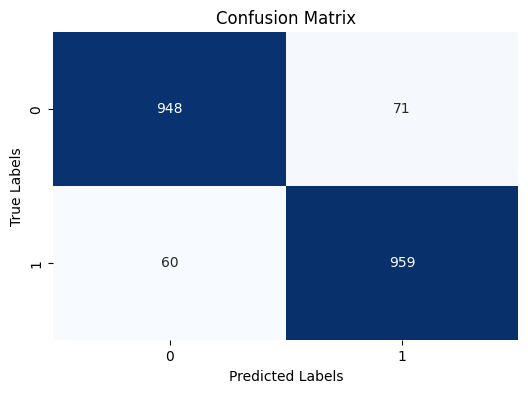

[[948  71]
 [ 60 959]]

ROC Curve:
Number of unique thresholds: 184


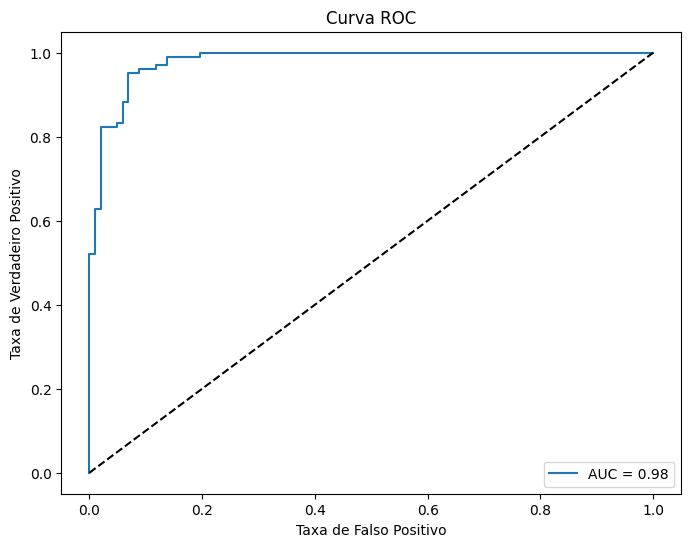


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.7941176470588235
F Score for this fold: 0.8028169014084507
Misclassification Rate for this fold: 0.20588235294117652
Precision Rate for this fold: 0.7702702702702703

Calculating metrics for fold: 2
Accuracy for this fold: 0.7867647058823529
F Score for this fold: 0.7923627684964202
Misclassification Rate for this fold: 0.21323529411764708
Precision Rate for this fold: 0.772093023255814

Calculating metrics for fold: 3
Accuracy for this fold: 0.8161764705882353
F Score for this fold: 0.8192771084337349
Misclassification Rate for this fold: 0.18382352941176472
Precision Rate for this fold: 0.8056872037914692

Calculating metrics for fold: 4
Accuracy for this fold: 0.8329238329238329
F Score for this fold: 0.832512315270936
Misclassification Rate for this fold: 0.16707616707616713
Precision Rate for this fold: 0.8366336633663366

Calculating metrics for fold: 5
Accuracy for this f

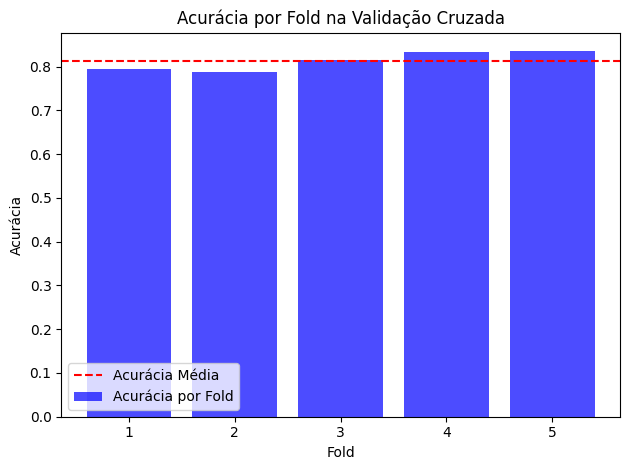

Average Accuracy: 0.813072698366816
Average AUC Score: 0.8885035927826166
Average Confusion Matrix: 
[[161.8  42. ]
 [ 34.2 169.6]]
Average F Score: 0.8167904123958742
Average Misclassification Rate: 0.186927301633184
Average Precision Rate: 0.8023214475213933

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAENG S

In [ ]:
persona_classifier_mb_results = persona_classifier_mb.evaluate_model(df_test.copy())

# Comparing Models: RANDOM_FOREST

In [ ]:
persona_classifier_rf = train_persona_classifier(ModelType.RANDOM_FOREST)

Training with: ModelType.RANDOM_FOREST
Preprocessing posts...
Determining X and y
Starting RandomForestClassifier(min_samples_leaf=2, min_samples_split=10,
                       n_estimators=200)()
Time taken: 2.94 seconds


Initializing model diagnostics...
ModelType.RANDOM_FOREST
F1 Score for the whole model: 0.8287841191066998
Precision Score for the whole model: 0.8391959798994975
Misclassification Rate for the whole model: 0.16911764705882348

Confusion Matrix:


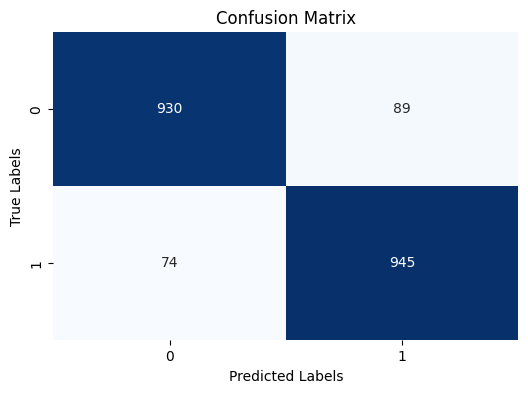

[[930  89]
 [ 74 945]]

ROC Curve:
Number of unique thresholds: 204


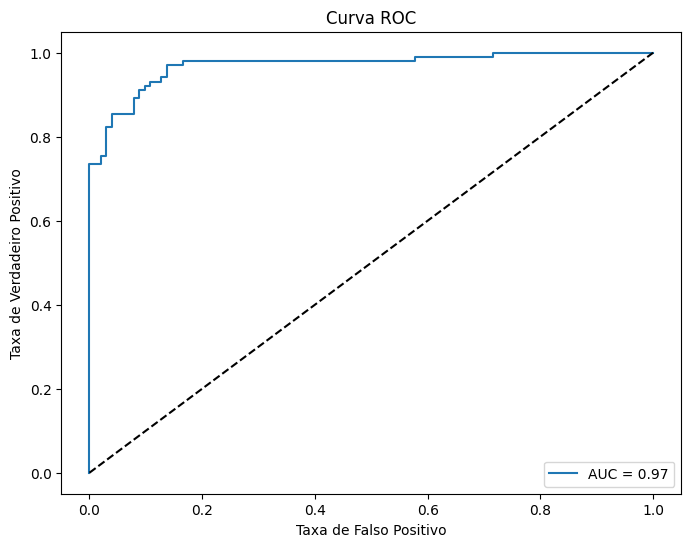


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.7916666666666666
F Score for this fold: 0.7931873479318734
Misclassification Rate for this fold: 0.20833333333333337
Precision Rate for this fold: 0.7874396135265701

Calculating metrics for fold: 2
Accuracy for this fold: 0.7720588235294118
F Score for this fold: 0.7822014051522249
Misclassification Rate for this fold: 0.2279411764705882
Precision Rate for this fold: 0.7488789237668162

Calculating metrics for fold: 3
Accuracy for this fold: 0.8308823529411765
F Score for this fold: 0.827930174563591
Misclassification Rate for this fold: 0.16911764705882348
Precision Rate for this fold: 0.8426395939086294

Calculating metrics for fold: 4
Accuracy for this fold: 0.8255528255528255
F Score for this fold: 0.8229426433915212
Misclassification Rate for this fold: 0.1744471744471745
Precision Rate for this fold: 0.8375634517766497

Calculating metrics for fold: 5
Accuracy for this fo

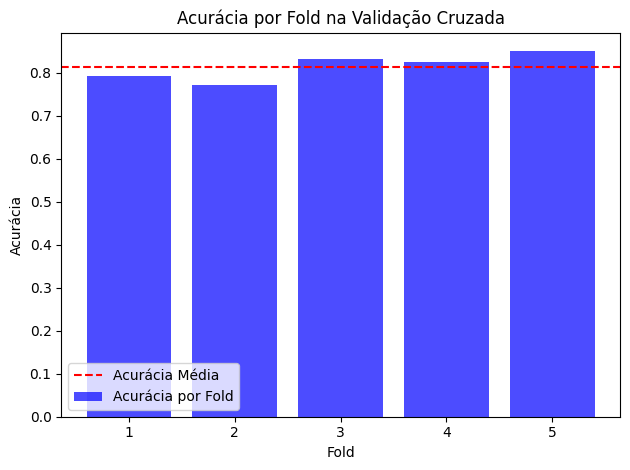

Average Accuracy: 0.8140567037625861
Average AUC Score: 0.895775970969862
Average Confusion Matrix: 
[[166.6  37.2]
 [ 38.6 165.2]]
Average F Score: 0.8140502681720365
Average Misclassification Rate: 0.18594329623741387
Average Precision Rate: 0.8188362314893501

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAENG

In [ ]:
persona_classifier_rf_results = persona_classifier_rf.evaluate_model(df_test.copy())

# Comparing Models: LOGISTIC_REGRESSION


In [ ]:
persona_classifier_lr = train_persona_classifier(ModelType.LOGISTIC_REGRESSION)

Training with: ModelType.LOGISTIC_REGRESSION
Preprocessing posts...
Determining X and y
Starting LogisticRegression(C=1.8634158535653313, solver='liblinear')()
Time taken: 0.36 seconds


Initializing model diagnostics...
ModelType.LOGISTIC_REGRESSION
F1 Score for the whole model: 0.7474226804123711
Precision Score for the whole model: 0.7880434782608695
Misclassification Rate for the whole model: 0.24019607843137258

Confusion Matrix:


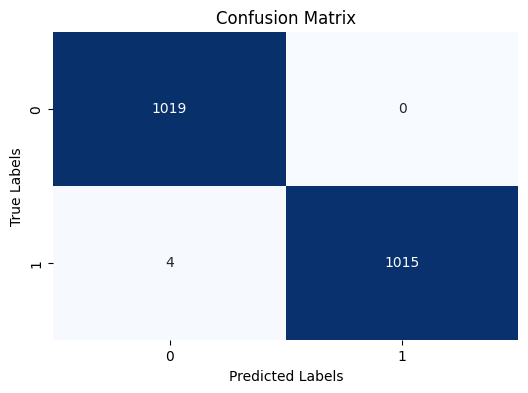

[[1019    0]
 [   4 1015]]

ROC Curve:
Number of unique thresholds: 204


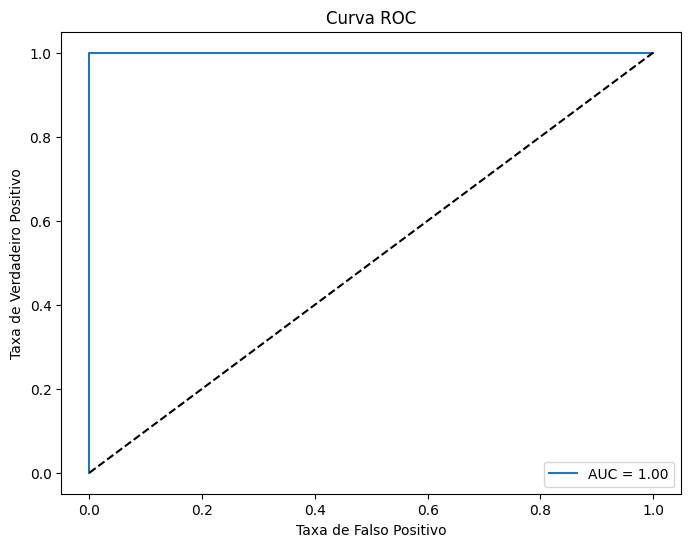


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.8014705882352942
F Score for this fold: 0.7938931297709922
Misclassification Rate for this fold: 0.19852941176470584
Precision Rate for this fold: 0.8253968253968254

Calculating metrics for fold: 2
Accuracy for this fold: 0.7769607843137255
F Score for this fold: 0.7807228915662651
Misclassification Rate for this fold: 0.2230392156862745
Precision Rate for this fold: 0.7677725118483413

Calculating metrics for fold: 3
Accuracy for this fold: 0.8235294117647058
F Score for this fold: 0.8172588832487309
Misclassification Rate for this fold: 0.17647058823529416
Precision Rate for this fold: 0.8473684210526315

Calculating metrics for fold: 4
Accuracy for this fold: 0.8329238329238329
F Score for this fold: 0.8274111675126904
Misclassification Rate for this fold: 0.16707616707616713
Precision Rate for this fold: 0.8578947368421053

Calculating metrics for fold: 5
Accuracy for this 

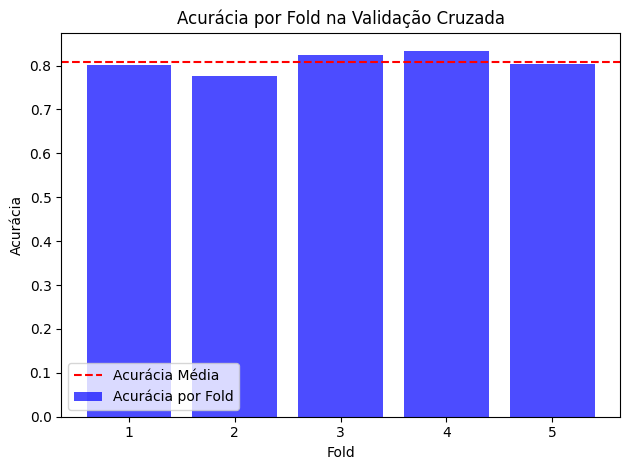

Average Accuracy: 0.8076648841354725
Average AUC Score: 0.8796988369384267
Average Confusion Matrix: 
[[169.8  34. ]
 [ 44.4 159.4]]
Average F Score: 0.8028315733940946
Average Misclassification Rate: 0.19233511586452762
Average Precision Rate: 0.8254619000974994

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAEN

In [ ]:
persona_classifier_lr_results = persona_classifier_lr.evaluate_model(df_test.copy())

# Comparing Models: DECISION_TREE


In [ ]:
persona_classifier_dt = train_persona_classifier(ModelType.DECISION_TREE)

Training with: ModelType.DECISION_TREE
Preprocessing posts...
Determining X and y
Starting DecisionTreeClassifier()()
Time taken: 0.48 seconds


Initializing model diagnostics...
ModelType.DECISION_TREE
F1 Score for the whole model: 0.7474226804123711
Precision Score for the whole model: 0.7880434782608695
Misclassification Rate for the whole model: 0.24019607843137258

Confusion Matrix:


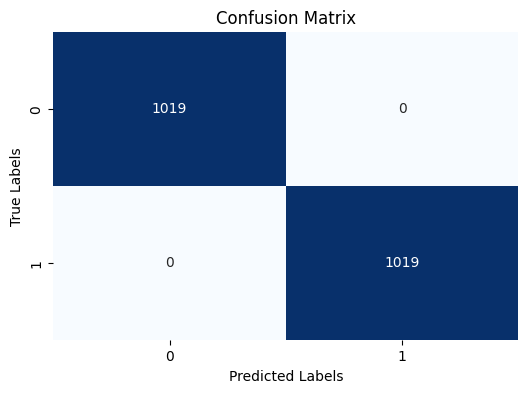

[[1019    0]
 [   0 1019]]

ROC Curve:
Number of unique thresholds: 2


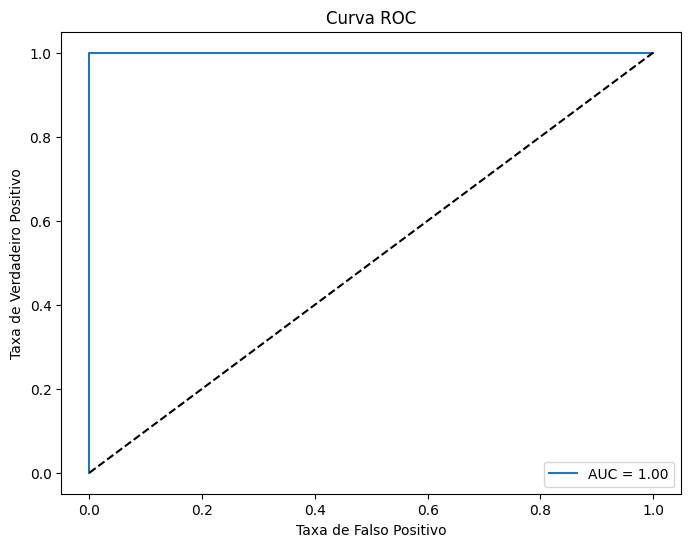


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.7230392156862745
F Score for this fold: 0.7290167865707433
Misclassification Rate for this fold: 0.2769607843137255
Precision Rate for this fold: 0.7136150234741784

Calculating metrics for fold: 2
Accuracy for this fold: 0.7058823529411765
F Score for this fold: 0.7222222222222222
Misclassification Rate for this fold: 0.2941176470588235
Precision Rate for this fold: 0.6842105263157895

Calculating metrics for fold: 3
Accuracy for this fold: 0.7254901960784313
F Score for this fold: 0.7185929648241207
Misclassification Rate for this fold: 0.27450980392156865
Precision Rate for this fold: 0.7371134020618557

Calculating metrics for fold: 4
Accuracy for this fold: 0.7444717444717445
F Score for this fold: 0.731958762886598
Misclassification Rate for this fold: 0.25552825552825553
Precision Rate for this fold: 0.7717391304347826

Calculating metrics for fold: 5
Accuracy for this fo

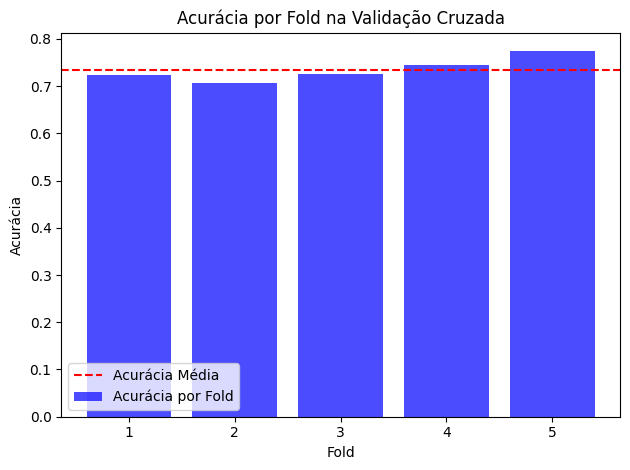

Average Accuracy: 0.7345678566266802
Average AUC Score: 0.7345696899449435
Average Confusion Matrix: 
[[151.2  52.6]
 [ 55.6 148.2]]
Average F Score: 0.7329354668883657
Average Misclassification Rate: 0.26543214337331983
Average Precision Rate: 0.7413356164573213

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAEN

In [ ]:
persona_classifier_dt_results = persona_classifier_dt.evaluate_model(df_test.copy())

# Comparing Models: SVC



In [ ]:
persona_classifier_sv = train_persona_classifier(ModelType.SVC)

Training with: ModelType.SVC
Preprocessing posts...
Determining X and y
Starting SVC(C=4.170803025021038, gamma=0.7206041689487159, kernel='linear',
    probability=True)()
Time taken: 5.82 seconds


Initializing model diagnostics...
ModelType.SVC
F1 Score for the whole model: 0.7830423940149626
Precision Score for the whole model: 0.7969543147208121
Misclassification Rate for the whole model: 0.21323529411764708

Confusion Matrix:


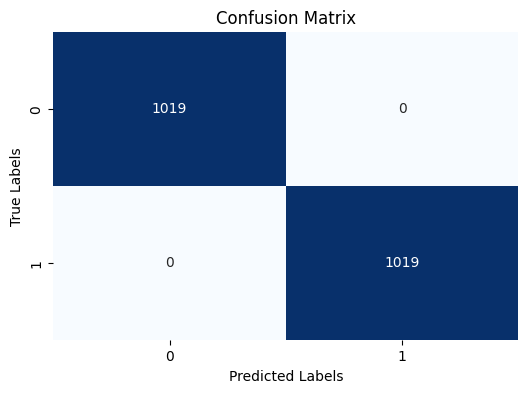

[[1019    0]
 [   0 1019]]

ROC Curve:
Number of unique thresholds: 203


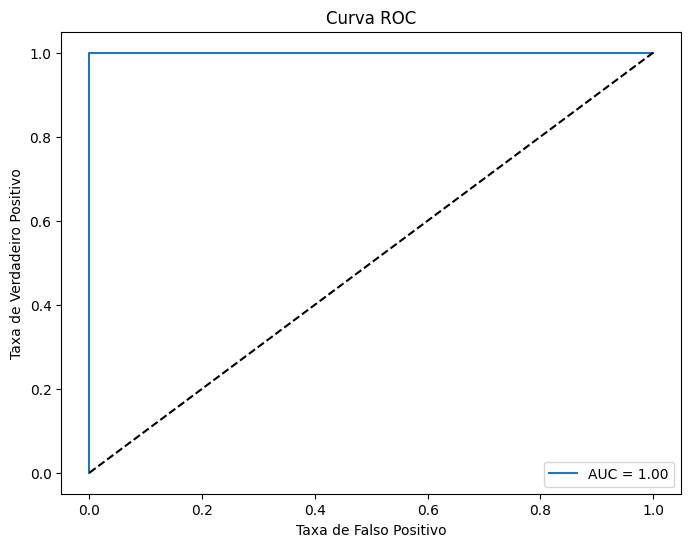


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.7745098039215687
F Score for this fold: 0.7653061224489796
Misclassification Rate for this fold: 0.22549019607843135
Precision Rate for this fold: 0.7978723404255319

Calculating metrics for fold: 2
Accuracy for this fold: 0.7622549019607843
F Score for this fold: 0.7616707616707618
Misclassification Rate for this fold: 0.23774509803921573
Precision Rate for this fold: 0.7635467980295566

Calculating metrics for fold: 3
Accuracy for this fold: 0.7818627450980392
F Score for this fold: 0.7802469135802469
Misclassification Rate for this fold: 0.2181372549019608
Precision Rate for this fold: 0.7860696517412935

Calculating metrics for fold: 4
Accuracy for this fold: 0.8206388206388207
F Score for this fold: 0.8123393316195374
Misclassification Rate for this fold: 0.17936117936117935
Precision Rate for this fold: 0.8540540540540541

Calculating metrics for fold: 5
Accuracy for this 

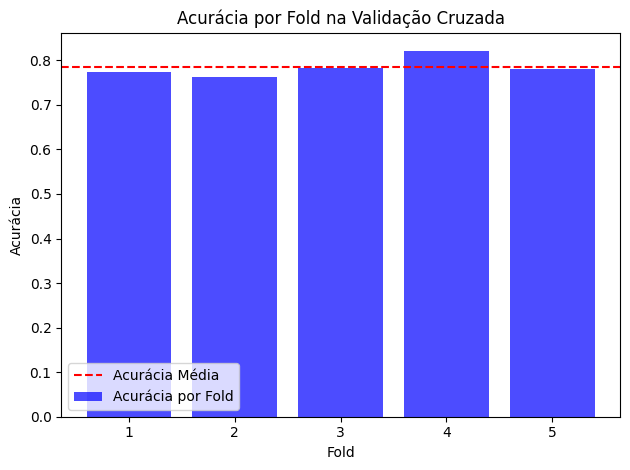

Average Accuracy: 0.7841186105891989
Average AUC Score: 0.8614700816093848
Average Confusion Matrix: 
[[165.4  38.4]
 [ 49.6 154.2]]
Average F Score: 0.7781542711081211
Average Misclassification Rate: 0.2158813894108012
Average Precision Rate: 0.8015988914307325

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAENG

In [ ]:
persona_classifier_sv_results = persona_classifier_sv.evaluate_model(df_test.copy())

# Comparing Models: KNN



In [ ]:
persona_classifier_knn = train_persona_classifier(ModelType.KNN)

Training with: ModelType.KNN
Preprocessing posts...
Determining X and y
Starting KNeighborsClassifier()()
Time taken: 0.14 seconds


Initializing model diagnostics...
ModelType.KNN
F1 Score for the whole model: 0.21367521367521367
Precision Score for the whole model: 0.8333333333333334
Misclassification Rate for the whole model: 0.4509803921568627

Confusion Matrix:


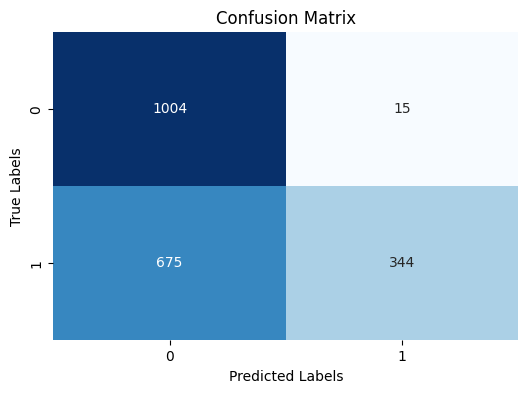

[[1004   15]
 [ 675  344]]

ROC Curve:
Number of unique thresholds: 6


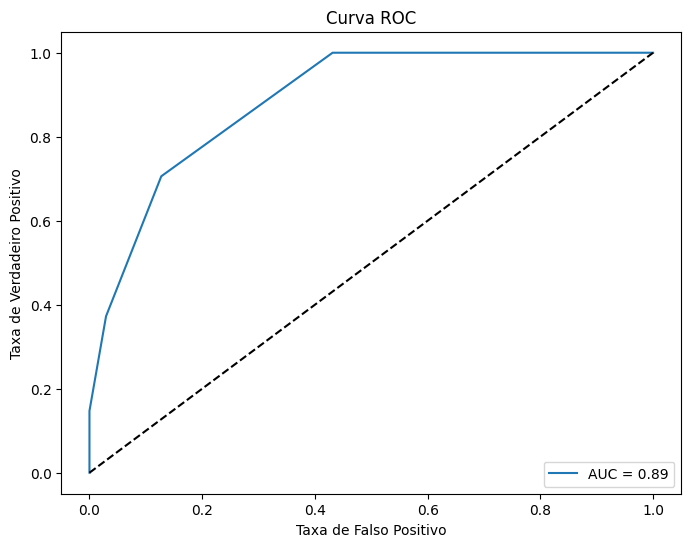


Splitting the model in 5 using Stratified K-Fold

Calculating metrics for fold: 1
Accuracy for this fold: 0.5588235294117647
F Score for this fold: 0.2622950819672131
Misclassification Rate for this fold: 0.4411764705882353
Precision Rate for this fold: 0.8

Calculating metrics for fold: 2
Accuracy for this fold: 0.5588235294117647
F Score for this fold: 0.256198347107438
Misclassification Rate for this fold: 0.4411764705882353
Precision Rate for this fold: 0.8157894736842105

Calculating metrics for fold: 3
Accuracy for this fold: 0.5563725490196079
F Score for this fold: 0.2426778242677824
Misclassification Rate for this fold: 0.44362745098039214
Precision Rate for this fold: 0.8285714285714286

Calculating metrics for fold: 4
Accuracy for this fold: 0.5823095823095823
F Score for this fold: 0.314516129032258
Misclassification Rate for this fold: 0.4176904176904177
Precision Rate for this fold: 0.8863636363636364

Calculating metrics for fold: 5
Accuracy for this fold: 0.55528255528

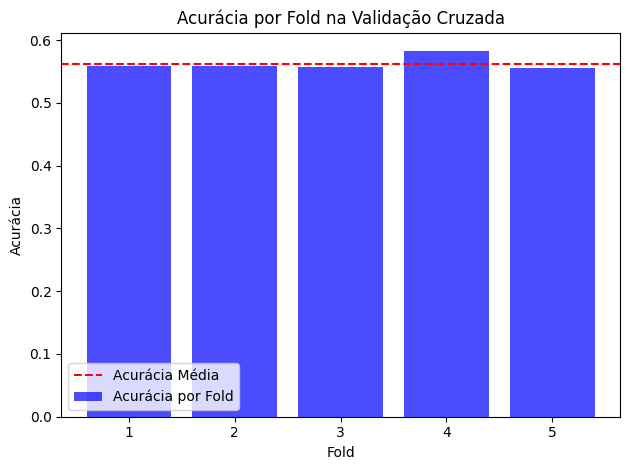

Average Accuracy: 0.5623223490870549
Average AUC Score: 0.686185329439416
Average Confusion Matrix: 
[[197.8   6. ]
 [172.4  31.4]]
Average F Score: 0.2597726696079855
Average Misclassification Rate: 0.437677650912945
Average Precision Rate: 0.8394782410571885

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAENG S

In [ ]:
persona_classifier_knn_results = persona_classifier_knn.evaluate_model(df_test.copy())

# Comparing Models: XGBOOST



In [ ]:
persona_classifier_xb = train_persona_classifier(ModelType.XGBOOST)

Training with: ModelType.XGBOOST
Preprocessing posts...
Determining X and y
Starting XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None, ...)()


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Time taken: 3.61 seconds


Initializing model diagnostics...
ModelType.XGBOOST
F1 Score for the whole model: 0.7826086956521738
Precision Score for the whole model: 0.8181818181818182
Misclassification Rate for the whole model: 0.20833333333333337

Confusion Matrix:


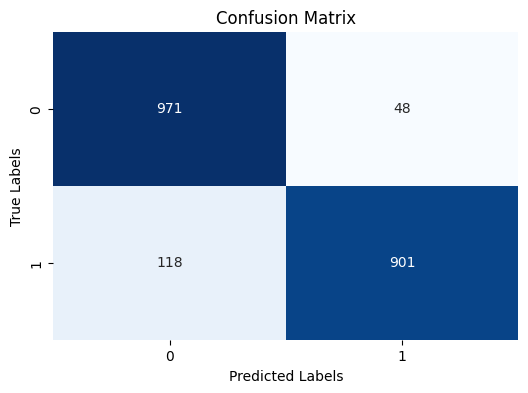

[[971  48]
 [118 901]]

ROC Curve:
Number of unique thresholds: 203


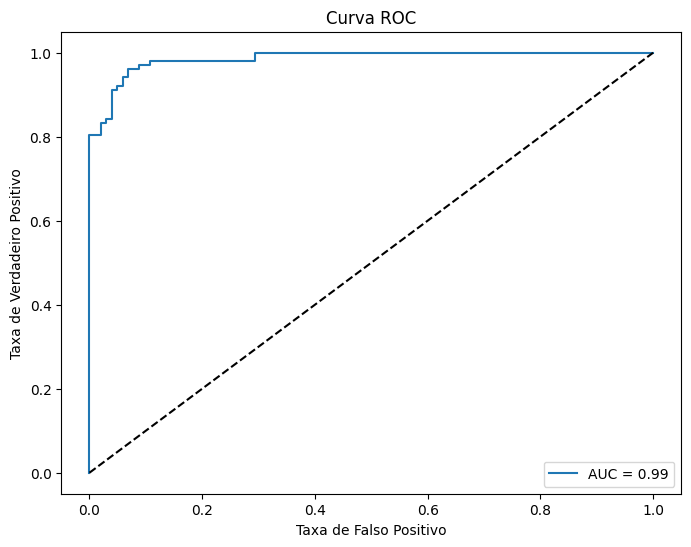


Splitting the model in 5 using Stratified K-Fold


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Calculating metrics for fold: 1
Accuracy for this fold: 0.7990196078431373
F Score for this fold: 0.7908163265306122
Misclassification Rate for this fold: 0.2009803921568627
Precision Rate for this fold: 0.824468085106383


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Calculating metrics for fold: 2
Accuracy for this fold: 0.7818627450980392
F Score for this fold: 0.784503631961259
Misclassification Rate for this fold: 0.2181372549019608
Precision Rate for this fold: 0.7751196172248804


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Calculating metrics for fold: 3
Accuracy for this fold: 0.8259803921568627
F Score for this fold: 0.8184143222506394
Misclassification Rate for this fold: 0.1740196078431373
Precision Rate for this fold: 0.8556149732620321


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Calculating metrics for fold: 4
Accuracy for this fold: 0.8083538083538083
F Score for this fold: 0.7979274611398963
Misclassification Rate for this fold: 0.19164619164619168
Precision Rate for this fold: 0.8461538461538461


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Calculating metrics for fold: 5
Accuracy for this fold: 0.8181818181818182
F Score for this fold: 0.8082901554404144
Misclassification Rate for this fold: 0.18181818181818177
Precision Rate for this fold: 0.8524590163934426


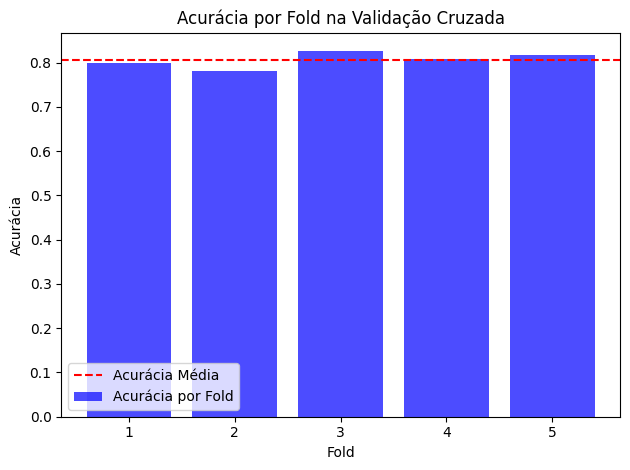

Average Accuracy: 0.8066796743267333
Average AUC Score: 0.8854752245725876
Average Confusion Matrix: 
[[171.4  32.4]
 [ 46.4 157.4]]
Average F Score: 0.7999903794645642
Average Misclassification Rate: 0.19332032567326685
Average Precision Rate: 0.8307631076281169

Classifying Unseen posts:
Post: cabos na altura do pescoço em frente ao 159. Senhor de idade acaba de dar uma cabeçada
Predicted Label: helper
Sentiment Score: {'status': 'ok', 'score': 0.04700999999999996, 'model': 'RandomForest'}
--------------------------------------------------
Post: Boa tarde!  Foi aberta uma solicitação de conserto do projetor multimídia (FP 194409) através do Protocolo Colab 362687. Conforme o relato do servidor da Proadi que faz manutenção em projetores multimídia (servidor Mário) disse que o aparelho não há mais conserto. Portanto, solicitamos a substituição por um novo projetor multimídia.  Local: Sala de Aula 2006 (Faeng, Bloco 4, Setor 1)  --------------------  Câmpus de Campo Grande Unidade: FAEN

In [ ]:
persona_classifier_xb_results = persona_classifier_xb.evaluate_model(df_test.copy())

# Weighted Voting Ensamble

In [ ]:
print(persona_classifier_mb_results)
#print(persona_classifier_rf_results)
#print(persona_classifier_lr_results)
print(persona_classifier_xb_results)
#print(persona_classifier_sv_results)

{'accuracy': 0.813072698366816, 'auc': 0.8885035927826166}
{'accuracy': 0.8066796743267333, 'auc': 0.8854752245725876}


In [ ]:
metrics = {
    'MULTINOMIAL_NB': persona_classifier_mb_results,
    'XGBOOST': persona_classifier_xb_results,
}
print(metrics)

{'MULTINOMIAL_NB': {'accuracy': 0.813072698366816, 'auc': 0.8885035927826166}, 'XGBOOST': {'accuracy': 0.8066796743267333, 'auc': 0.8854752245725876}}


In [ ]:
# Define the average accuracy and AUC for each classifier
#metrics = {
#    'MULTINOMIAL_NB': {'accuracy': 0.8177496520528879, 'auc': 0.9790465190609019},
#    'RANDOM_FOREST': {'accuracy': 0.8206784968684759, 'auc': 0.99},
#    'XGBOOST': {'accuracy': 0.8027435629784273, 'auc': 0.9911720711297072},
#    'LOGISTIC_REGRESSION': {'accuracy': 0.8077461725817676, 'auc': 0.9998888307763831},
#}

# Normalize the metrics
total_accuracy = sum(classifier['accuracy'] for classifier in metrics.values())
total_auc = sum(classifier['auc'] for classifier in metrics.values())

normalized_metrics = {
    classifier: {'accuracy': metrics[classifier]['accuracy'] / total_accuracy, 'auc': metrics[classifier]['auc'] / total_auc}
    for classifier in metrics
}

# Calculate the combined score and assign weights
weights = {
    classifier: (normalized_metrics[classifier]['accuracy'] + normalized_metrics[classifier]['auc']) / 2
    for classifier in normalized_metrics
}

weights

{'MULTINOMIAL_NB': 0.5014135048759467, 'XGBOOST': 0.4985864951240533}

In [ ]:
# Define the weights for each classifier
#weights = [0.24946317299104892, 0.24946317299104892, 0.24946317299104892, 0.25055519718666563]  # Adjust the weights based on the reliability of each classifier
weights = list(weights.values())
classifiers = [persona_classifier_mb, persona_classifier_xb]


# Instantiate the ensemble classifier
ensemble_classifier = WeightedVotingEnsemble(classifiers=classifiers, weights=weights)

# Classificação simples

In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[0])

Message: Mais um dia Esse bar dos infernos  , atrapalhando nosso descanso com esse bando de drogados e
cachaceiros dos infernos  ,,, prefeitura nada faz nos trabalhadores e pais de família  temos  que se
segurar para não explodir💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣💣 essa merda de bar , fora tem uma vadia 🐄🐄🐄🐄🐄🐄🐄que
grita igual uma filha puta acordando nossos filhos que recém nascido  ,,, estou tão estressada  que
minha vontade  de arrancar língua dela na faca 😤😤😤😤🤬🤬🤬🗣🗣🗣🗣🗣🐄🐄🐄🐄🐄🐍🐍🐍🐍🐍🐍,,,, prefeitura pelo amor Deus
verifica se esse lixo💩💩💩💩💩💩 tem alvará  de funcionamento  pois qualquer hora essa vai dar merda
☠☠☠☠☠☠☠☠,,,, lugar música alta, gritos , brigas, jogos uma verdadeira merda estou odiando morar
aquiii digo logo vai dar merda ,,,, bar ñ deveria existir bairro como este meus filhos ñ descansa
barulho infernos  ,,,, 💣💣💣🕳🕳🕳🕳👹👹👹☠☠☠☠
Classifier: ModelType.MULTINOMIAL_NB. Result: complainer
Classifier: ModelType.RANDOM_FOREST. Result: complainer
Classifier: ModelType.XGBOOST. Result: complainer
Label: 

In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[1])

Message: A Ótica Diniz permanece em funcionamento na Avenida Sete de Setembro 201, Icaraí, expondo de forma
irresponsável e desnecessária os seus funcionários.  Este tipo de estabelecimento não era para estar
com as suas lojas fechadas? Há três outras óticas nas proximidades, todas fechadas desde sexta-
feira.
Classifier: ModelType.MULTINOMIAL_NB. Result: complainer
Classifier: ModelType.RANDOM_FOREST. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Result: helper


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[2])

Message: Esta cratera foi aberta depois da ultima chuva na rua pau Brasil no engenho do mato q sofre com
alagamentos devido as chuvas e nenhuma providência é tomada pela prefeitura de Niteroi..Os carros
tem mta dificuldades em passar fazendo c q os moradores da Rua Pau Brasil não consigam chegar em
suas próprias casas...
Classifier: ModelType.MULTINOMIAL_NB. Result: complainer
Classifier: ModelType.RANDOM_FOREST. Result: complainer
Classifier: ModelType.XGBOOST. Result: complainer
Label: complainer
Result: complainer


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[3])

Message: Eu venho pela centésima vez pedir pra que tomem alguma providência sobre o pub jardim. Estamos há
exatos 8 meses sem solução. Eu comento no protocolo já existente mas não obtenho resposta. A
fiscalização prometida nunca bateu lá com o bar funcionando com música. O bar vara a madrugada com
música, fim de semana é música o dia todo, a gente não tem um descanso. Tá bem difícil. Sei que
vocês do colab encaminham a solicitação sempre. Mas eu gostaria de alguma direção já que reclamar
aqui não está adiantando. (são 8 meses desse inferno). então por favor, me direcionem pra algum
canal onde eu possa ter mais resultado. Polícia não adianta, Cisp não adianta. por favor me dêem um
caminho pq daqui a pouco vou ficar maluca aqui sem sanidade nenhuma.
Classifier: ModelType.MULTINOMIAL_NB. Result: complainer
Classifier: ModelType.RANDOM_FOREST. Result: complainer
Classifier: ModelType.XGBOOST. Result: complainer
Label: complainer
Result: complainer


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[4])

Message: Estabelecimento próximo deste número.  Essa igreja/ centro de culto é recorrente o barulho alto além
do horário das 22h, as quartas, sextas e domingos no seu horário de culto. Algo que se houve há 50m
de distância. Berram aos montes no microfone ou sei lá o que usam lá dentro. Infelizmente não acho
que não consigo colocar vídeo do barulho que fazem. Estou colocando isso numa quarta (11/03/2020) as
22:26 e ainda estão em culto gritando. Senão bastasse o barulho as pessoas que ali frequentam
estacionam nas vias ao redor em cima da calçada, e ao término do culto saem berrando ainda na rua
como se não houvessem moradores ao redor. Precisam notificar essa igreja sobre a lei do silêncio e
fazerem mesmo em horário normal não gritarem tanto lá dentro.
Classifier: ModelType.MULTINOMIAL_NB. Result: complainer
Classifier: ModelType.RANDOM_FOREST. Result: complainer
Classifier: ModelType.XGBOOST. Result: helper
Label: complainer
Result: complainer


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[5])

Message: agradeço pela poda das árvores, mas peso urgência por favor, as árvores destruíram a calçada em
frente ao prédio, as raízes estão muito altas e não temos como concertar desse jeito que está, o que
fazer, as pessoas estão tropeçando e caindo. aguardo resposta.
Classifier: ModelType.MULTINOMIAL_NB. Result: helper
Classifier: ModelType.RANDOM_FOREST. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Result: helper


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[6])

Message: Bom dia! postes com lâmpadas apagadas, em frente a casa 84, e em frente a casa 100.
Classifier: ModelType.MULTINOMIAL_NB. Result: helper
Classifier: ModelType.RANDOM_FOREST. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Result: helper


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[7])

Message: São duas lampadas quimadas um poste proximo ao outro, ficando muito escuro durante a noite, e tem
varias famílias que precisam  dessas lampadas iluminando a frente de suas casas, incluindo eu. Já
fizemos 5 pedidos e já fazem 4 meses com essas lampadas queimadas. Já nós informaram a troca, só que
não é verdadeiro essa informação , eu moro de frente a um desses postes com lampada queimada.  Peço
que por favor nos atendam. Obrigado
Classifier: ModelType.MULTINOMIAL_NB. Result: helper
Classifier: ModelType.RANDOM_FOREST. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Result: helper


In [ ]:
log_post_and_predict(ensemble_classifier, TESTING_POSTS[8])

Message: precisamos desobstruir bueiro de água fluvial pós o mesmo está intupido já foram feitos vários
pedidos este bueiro e super importante para o bairro pedimos os órgãos competente pós ele evita
enchetes
Classifier: ModelType.MULTINOMIAL_NB. Result: helper
Classifier: ModelType.RANDOM_FOREST. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Result: helper


# Postagens de Niterói, Santo André e Mesquita

In [ ]:
url_nodes = "https://drive.google.com/uc?id=1C04iiMkjoWStAbL19RcIAAE2uOnITejr&export=download"
url_edges = "https://drive.google.com/uc?id=1skMWv0IDbMZ-Gl3f2BzCVScmK6cZPakd&export=download" # gephi
url_events = "https://drive.google.com/uc?id=1HOPXwUQazUeIesEoe6UNZ2I_5iJgL2lp&export=download" # 3 cidades
nodes = pd.read_csv(url_nodes, sep=',', decimal='.', header=0)
edges = pd.read_csv(url_edges, sep=',', decimal='.', header=0)
events = pd.read_csv(url_events, sep=',', decimal='.', header=0, low_memory=False)

In [ ]:
events['processed_post'] = events['description'].apply(message_sanitizer.sanitize)
events

Erro ao anonimizar: [E1041] Expected a string, Doc, or bytes as input, but got: <class 'float'>


,Unnamed: 0,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,lat,lon,city,deleted_at,city_id,processed_post
0,0,41,86,Árvore bloqueando a calçada,FECHADO,2013-03-17 16:55,7574,Poda de árvore,-8.037968,-34.876409,NaN,NaN,NaN,|_nome_| bloqueando calçada
1,1,54,2,Barraca no meio da calçada na Marquês de Olind...,RECUSADO,2013-03-21 14:11,7558,Ocupação irregular de área pública,-8.063467,-34.872855,NaN,NaN,NaN,barraca meio calçada |_nome_| recife antigo au...
2,2,58,86,Utilização da calçada para estacionamento. Pad...,RECUSADO,2013-03-23 18:59,7558,Ocupação irregular de área pública,-8.105268,-34.887529,NaN,NaN,NaN,utilização calçada estacionamento |_nome_|
3,3,582,86,"Árvore batendo na fiação, que já está toda bag...",FECHADO,2013-04-22 19:13,3942,Poda de árvore,-23.601828,-46.658975,NaN,NaN,NaN,|_nome_| batendo fiação toda bagunçada
4,4,918,86,Entulho na calçada e o pedestre tem que passar...,FECHADO,2013-05-07 22:50,3938,Entulho na calçada/via pública,-23.604105,-46.669592,NaN,NaN,NaN,|_org_| calçada pedestre passar meio
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132841,132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,NOVO,2021-01-02T15:59:14-0300,9,Entulho na calçada/via pública,-23.629147,-46.493427,Santo André,2021-01-02T16:41:43-0300,5317.0,|_nome_| fez reforma casa simplesmente dispens...
132842,132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",ABERTO,2021-03-13T02:42:58-0300,56,Ponto de exploração sexual de menores,-23.647119,-46.561029,Santo André,2021-07-18T01:58:17-0300,5317.0,porque coloca |_nome_| base nessa praça toda...
132843,132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",NOVO,2021-05-02T23:34:19-0300,54,Infestação animais perigosos,-22.780779,-43.428578,Mesquita,2021-05-02T23:34:49-0300,3633.0,|_nome_| telhado imóvel localizado avenida gov...
132844,132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",NOVO,2021-05-01T15:37:59-0300,46,Mato alto,-28.986578,-49.415328,Balneário Arroio do Silva,NaN,4438.0,boa tarde sambaqui balneario arroio silva sc e...


In [ ]:
# Obter os IDs únicos de 'source' e 'target' no DataFrame 'edges'
unique_ids_from_edges = pd.concat([edges['source'], edges['target']]).unique()

# Filtrar o DataFrame 'nodes' com base nos IDs obtidos
nodes = nodes[nodes['colab_user_id'].isin(unique_ids_from_edges)]

In [ ]:
sentiment_classifier = TrainedColabSentimentClassifier(ModelType.RANDOM_FOREST,
                                                       'sentiment_model.joblib',
                                                       None,
                                                       sentiment_train_file_path,
                                                       message_sanitizer)
sentiment_classifier.events_data = events[['colab_user_id', 'description']]
sentiment_classifier.identity_column = 'colab_user_id'
sentiment_classifier.process(ModelType.RANDOM_FOREST)

Processing 6242 out of 132846 (4.70%)


KeyboardInterrupt: ignored

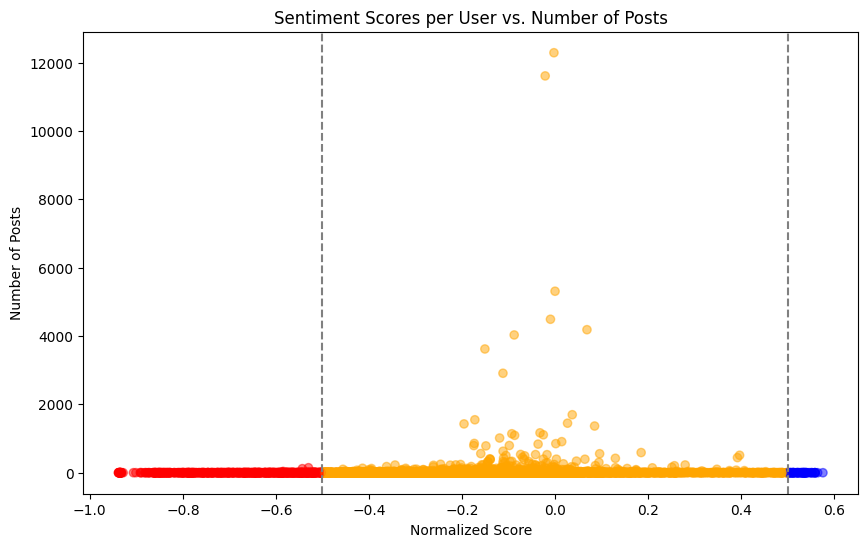

In [ ]:
sentiment_classifier.plot_user_scores()

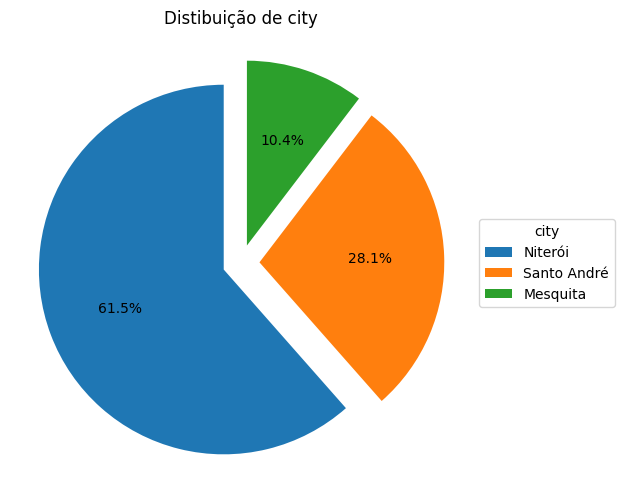

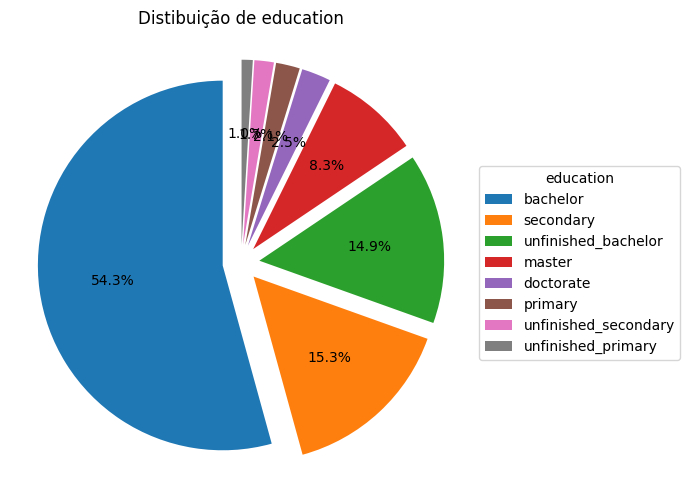

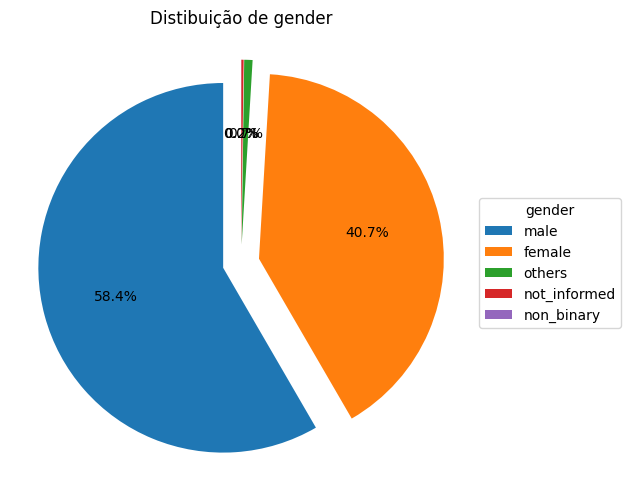

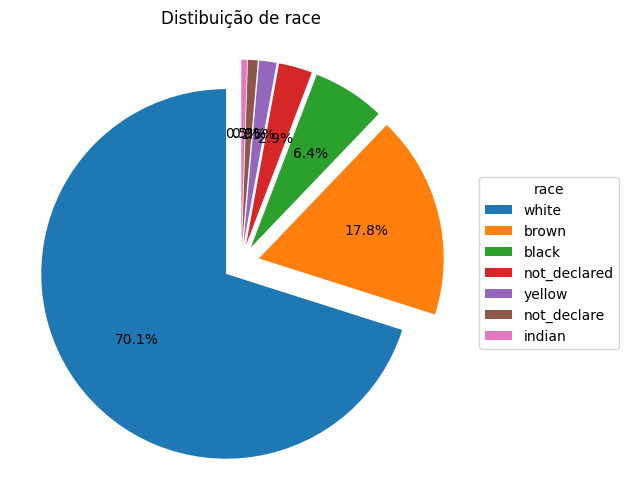

In [ ]:
# Lista de colunas para as quais queremos criar gráficos de pizza
columns_to_plot = ['city', 'education', 'gender', 'race']

# Criar gráfico de pizza para cada coluna
for column in columns_to_plot:
    plot_pie_chart(nodes, column, f"Distibuição de {column}")

In [ ]:
nodes

,colab_user_id,birth_date,city,education,gender,idade,race
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN
3,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white
9,43311,1975-06-18,Niterói,bachelor,male,48.0,white
26,236585,1959-02-07,Niterói,primary,female,64.0,white
...,...,...,...,...,...,...,...
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN
57023,467302,1997-01-30,Niterói,unfinished_bachelor,female,26.0,NaN
57251,213426,NaN,Niterói,NaN,NaN,NaN,NaN
57337,251594,NaN,Niterói,NaN,NaN,NaN,NaN


# Classificando persona por evento

In [ ]:
persona_classifier = ensemble_classifier

In [ ]:
def classify_persona_for_events(events_df, classifier):
    # Lista para armazenar os resultados
    results = []

    # Total de eventos para calcular a porcentagem
    total_events = len(events_df)

    # Counter for successfully classified records
    success_count = 0

    # Percorrer cada linha do DataFrame com enumerate para obter o índice
    for idx, (_, row) in enumerate(events_df.iterrows()):
        # Obter a descrição
        clear_output(wait=True)
        # Logar o progresso
        print(
            f"Processando {idx + 1} de {total_events} ({(idx + 1) / total_events * 100:.2f}%)")
        #
        if 'processed_post' in row:
            description = row['processed_post']
            pp = True
        else:
            description = row['description']
            pp = False
        #
        # Verificar se description é uma string válida e não está vazia
        if not isinstance(description, str) or not description.strip():
            print(
                f"Descrição inválida no evento {row['event_id']}. Adicionando 'error' à coluna persona...")
            results.append([row['event_id'], row['colab_user_id'], 'error'])
            continue

        # Classificar a descrição
        result = classifier.predict(description, pp)

        # Check if the classification was successful
        if result is not None:
            success_count += 1
            persona = result
            results.append([row['event_id'], row['colab_user_id'], persona])
        else:
            print(
                f"Erro ao classificar o evento {row['event_id']}. Adicionando 'error' à coluna persona...")
            results.append([row['event_id'], row['colab_user_id'], 'error'])

        # Print the classification success rate
        print(
            f"Classified {success_count} out of {idx + 1} records ({success_count / (idx + 1) * 100:.2f}%)")
        #time.sleep(0.5)

    # Criar um novo DataFrame com os resultados
    persona_df = pd.DataFrame(
        results, columns=['event_id', 'colab_user_id', 'persona'])

    return persona_df
#
persona_df = classify_persona_for_events(events, persona_classifier)

Processando 132846 de 132846 (100.00%)
Message: boa tarde |_nome_| realizado poda dessa árvore poi galhos empurrando fios energia internet
possivelmente irá afetar qualquer chuva forte próprio crescimento árvore   itaporanga frente casa
bairro paraiso- santo andre sp
Classifier: ModelType.MULTINOMIAL_NB. Result: helper
Classifier: ModelType.XGBOOST. Result: helper
Label: helper
Classified 132348 out of 132846 records (99.63%)


In [ ]:
print(persona_df.head())

   event_id  colab_user_id     persona  persona_value
0        41             86      helper            0.0
1        54              2  complainer            1.0
2        58             86      helper            0.0
3       582             86      helper            0.0
4       918             86      helper            0.0


# Classificando usuários por personas

In [ ]:
@calculate_time_taken
def aggregate_persona_by_user(persona_df):
    # Mapear 'helper' para 0 e 'complainer' para 1
    persona_df['persona_value'] = persona_df['persona'].map({'helper': 0, 'complainer': 1})
    # Calcular a média por usuário
    user_persona_avg = persona_df.groupby('colab_user_id')['persona_value'].mean()
    # Classificar a média como 'helper' ou 'complainer'
    user_persona_avg = user_persona_avg.apply(lambda x: 'helper' if x < 0.5 else 'complainer')
    return user_persona_avg

user_persona = aggregate_persona_by_user(persona_df)

Time taken: 0.04 seconds


In [ ]:
user_persona

colab_user_id
2         complainer
86            helper
5384          helper
6734          helper
7259          helper
             ...    
948054    complainer
958191        helper
968676        helper
970536        helper
977062        helper
Name: persona_value, Length: 4569, dtype: object

# Data Science

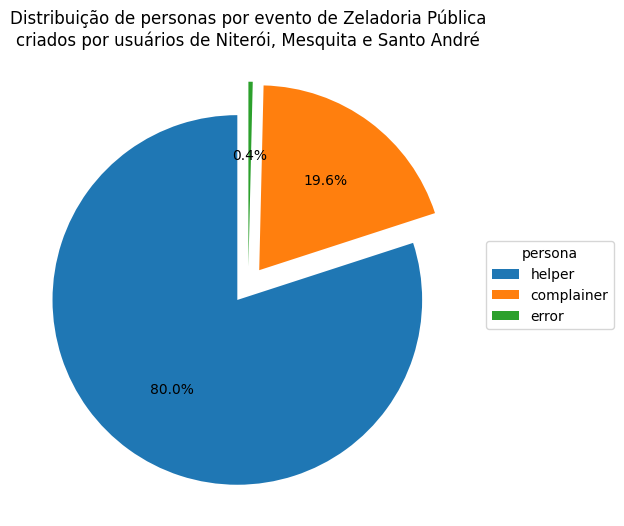

In [ ]:
plot_pie_chart(persona_df, 'persona', "Distribuição de personas por evento de Zeladoria Pública\ncriados por usuários de Niterói, Mesquita e Santo André")

In [ ]:
# Transformando user_persona em DataFrame
user_persona_df = pd.DataFrame(user_persona.items(), columns=['colab_user_id', 'persona'])

# Agora, vamos juntar o dataframe nodes com user_persona_df
merged_df = pd.merge(nodes, user_persona_df, on='colab_user_id')
# Mapeando a coluna 'persona' para valores numéricos
merged_df['persona_value'] = merged_df['persona'].map({'helper': 0, 'complainer': 1})

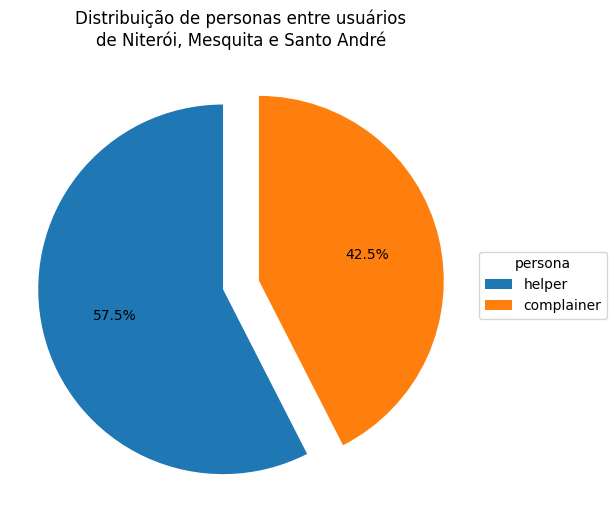

In [ ]:
plot_pie_chart(user_persona_df, 'persona', "Distribuição de personas entre usuários\nde Niterói, Mesquita e Santo André")

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
import pandas as pd

# Merge persona_df with events to get the created_at column
histo_df = pd.merge(persona_df, events[['event_id', 'created_at']], on='event_id', how='left')


# Convert the 'created_at' column to datetime
histo_df['created_at'] = pd.to_datetime(histo_df['created_at'])

# Create a color column based on the 'persona' column
color_map = {'helper': 'blue', 'complainer': 'orange'}
histo_df['color'] = histo_df['persona'].map(color_map)

In [ ]:
# Create a ColumnDataSource from the DataFrame
source = ColumnDataSource(histo_df)

# Create a Bokeh figure
p = figure(width=800, height=400, x_axis_type='datetime', title='Events Scatter Plot')

# Add a circle glyph for each point in the scatter plot
p.circle(x='created_at', y='event_id', source=source, color='color', size=10, alpha=0.6)

# Add hover tool to display event_id, persona, and created_at
hover = HoverTool(tooltips=[('Event ID', '@event_id'), ('Persona', '@persona'), ('Created At', '@created_at{%F %T}')], formatters={'@created_at': 'datetime'})
p.add_tools(hover)

# Display the plot inline in the notebook
output_notebook()
show(p)

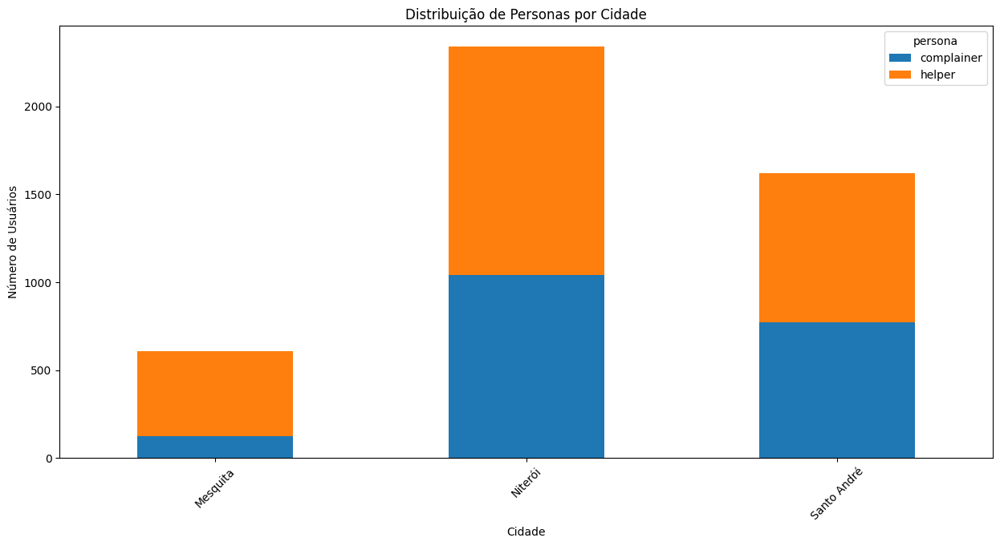

In [ ]:
# 2. Distribuição de Personas por Cidade
city_persona_counts = merged_df.groupby('city')['persona'].value_counts().unstack().fillna(0)
city_persona_counts.plot(kind='bar', stacked=True, figsize=(15, 7))
plt.title('Distribuição de Personas por Cidade')
plt.ylabel('Número de Usuários')
plt.xlabel('Cidade')
plt.xticks(rotation=45)
plt.show()

In [ ]:
city_persona_counts.to_csv('distribuicao_personas_por_cidade.csv')

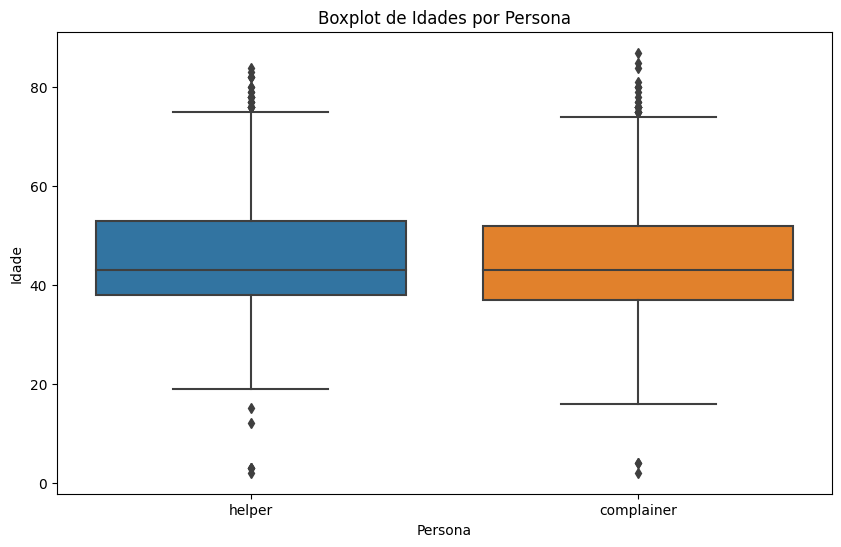

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df, x='persona', y='idade')
plt.title('Boxplot de Idades por Persona')
plt.xlabel('Persona')
plt.ylabel('Idade')
plt.show()


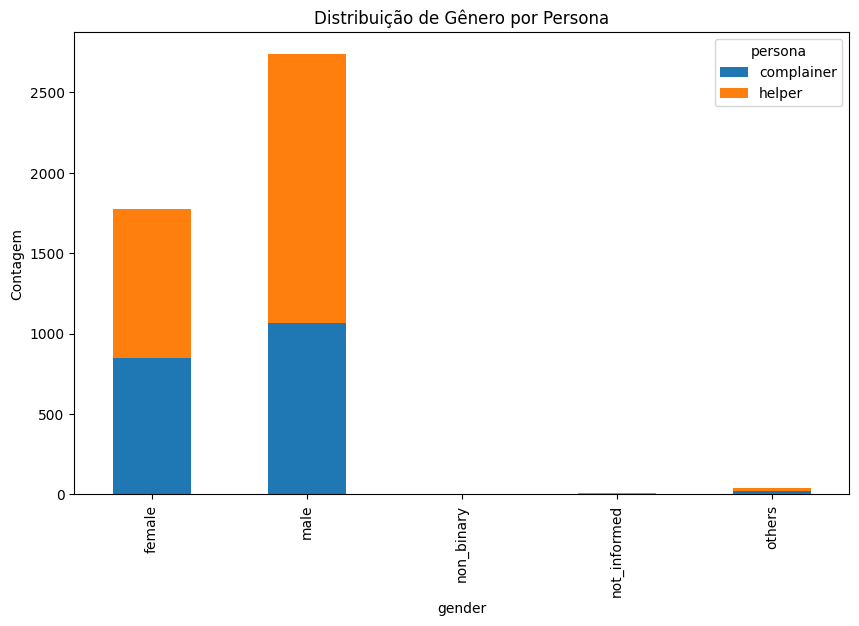

In [ ]:
gender_persona_counts = merged_df.groupby('gender')['persona'].value_counts().unstack().fillna(0)
gender_persona_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição de Gênero por Persona')
plt.ylabel('Contagem')
plt.show()
gender_persona_counts.to_csv("gender_persona_counts.csv")

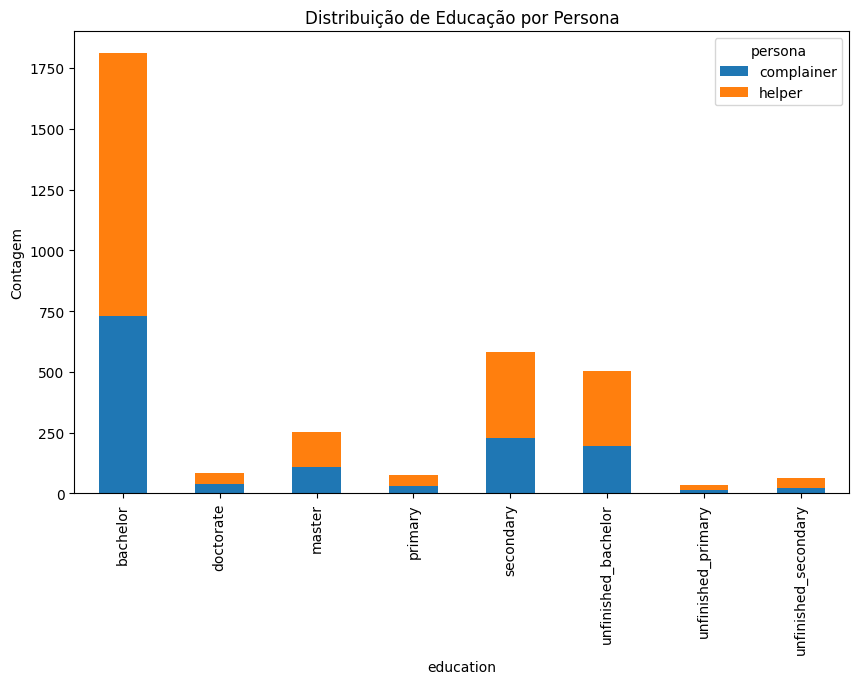

In [ ]:
education_persona_counts = merged_df.groupby('education')['persona'].value_counts().unstack().fillna(0)
education_persona_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição de Educação por Persona')
plt.ylabel('Contagem')
plt.show()
education_persona_counts.to_csv("education_persona_counts.csv")

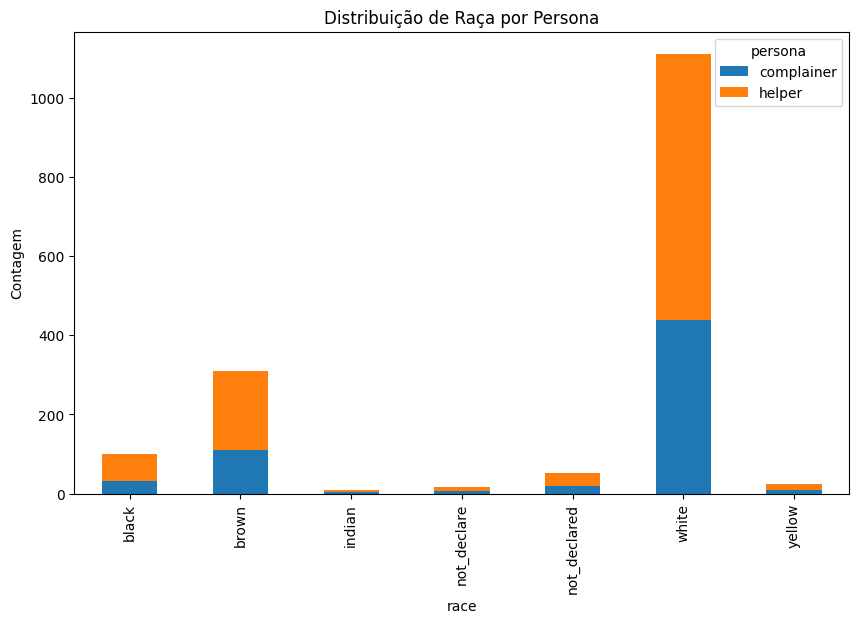

In [ ]:
race_persona_counts = merged_df.groupby('race')['persona'].value_counts().unstack().fillna(0)
race_persona_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição de Raça por Persona')
plt.ylabel('Contagem')
plt.show()
race_persona_counts.to_csv("race_persona_counts.csv")

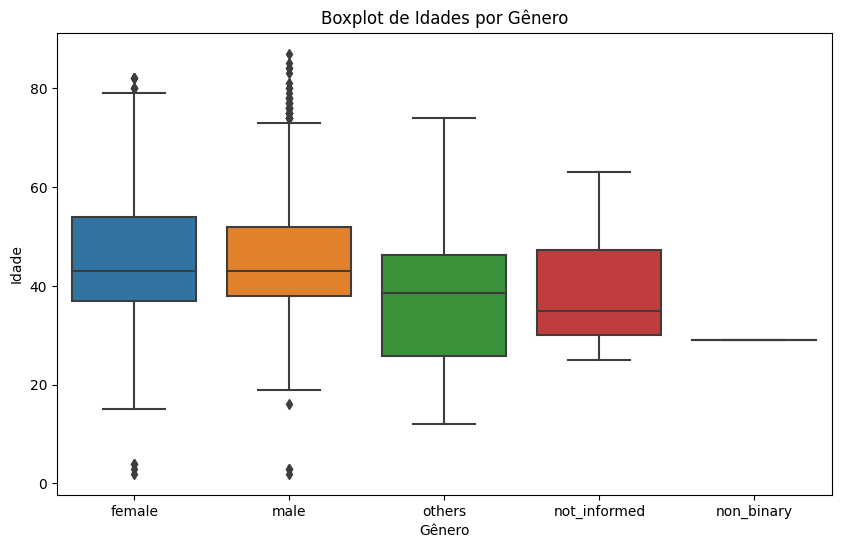

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df, x='gender', y='idade')
plt.title('Boxplot de Idades por Gênero')
plt.xlabel('Gênero')
plt.ylabel('Idade')
plt.show()


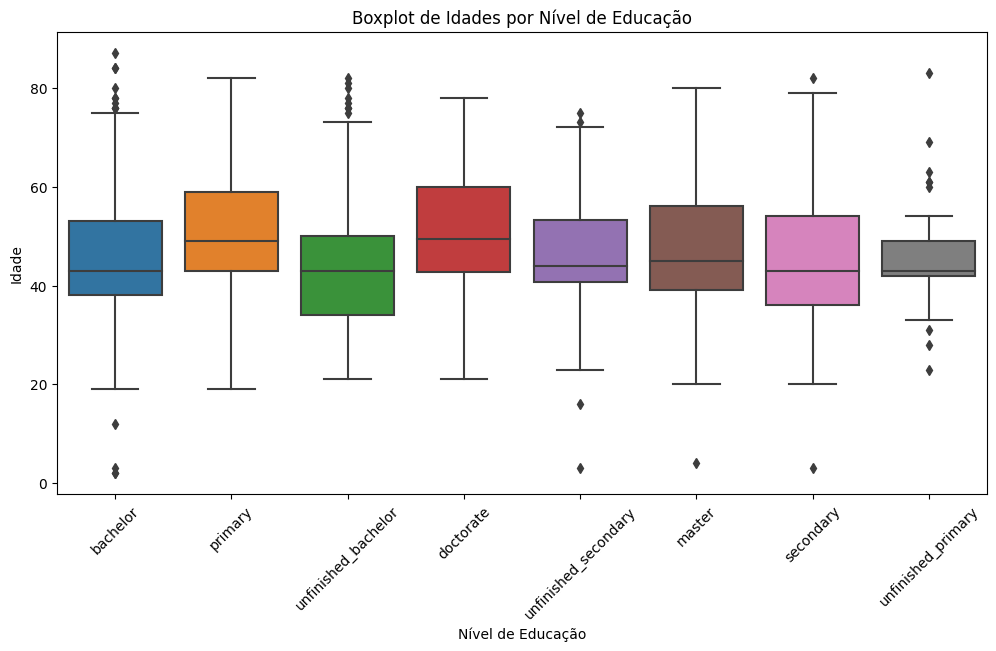

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=merged_df, x='education', y='idade')
plt.title('Boxplot de Idades por Nível de Educação')
plt.xlabel('Nível de Educação')
plt.ylabel('Idade')
plt.xticks(rotation=45)
plt.show()


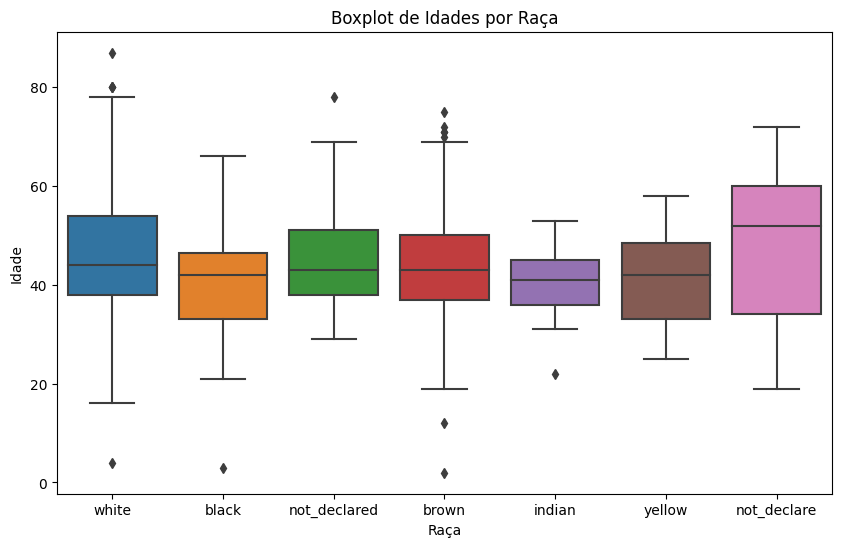

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df, x='race', y='idade')
plt.title('Boxplot de Idades por Raça')
plt.xlabel('Raça')
plt.ylabel('Idade')
plt.show()


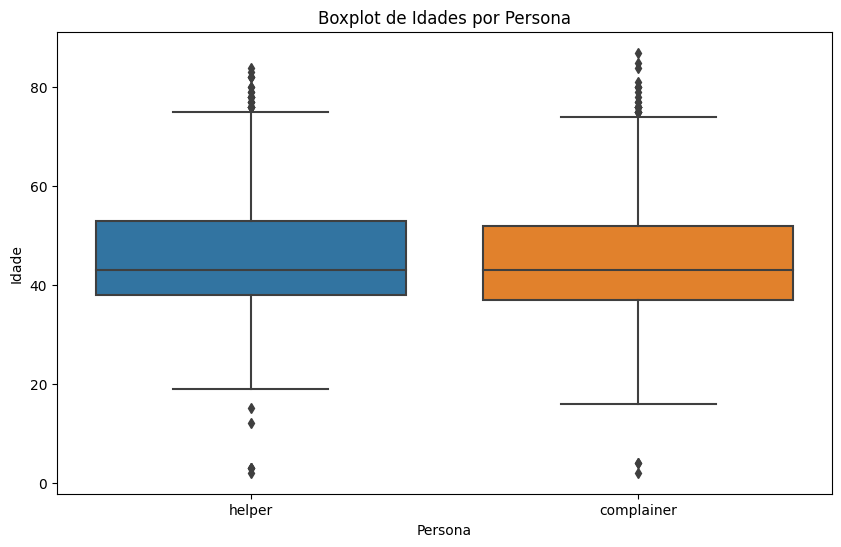

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df, x='persona', y='idade')
plt.title('Boxplot de Idades por Persona')
plt.xlabel('Persona')
plt.ylabel('Idade')
plt.show()


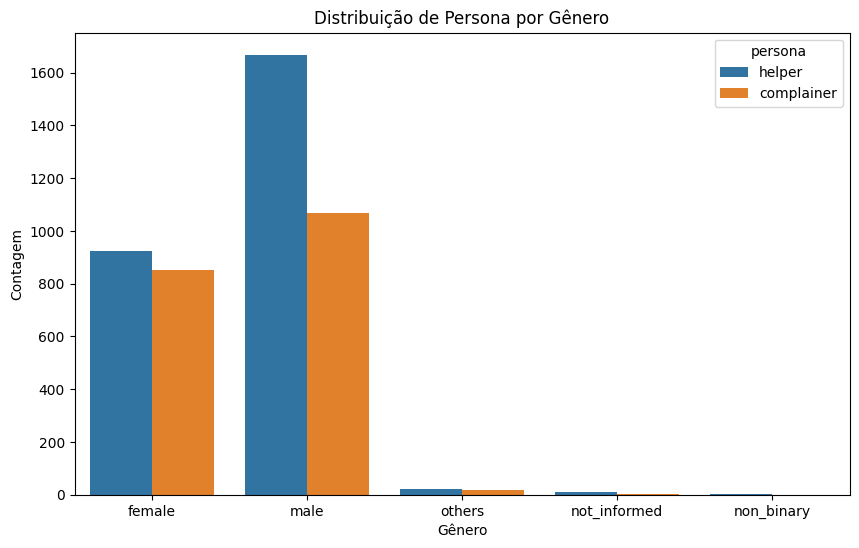

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=merged_df, x='gender', hue='persona')
plt.title('Distribuição de Persona por Gênero')
plt.xlabel('Gênero')
plt.ylabel('Contagem')
plt.show()


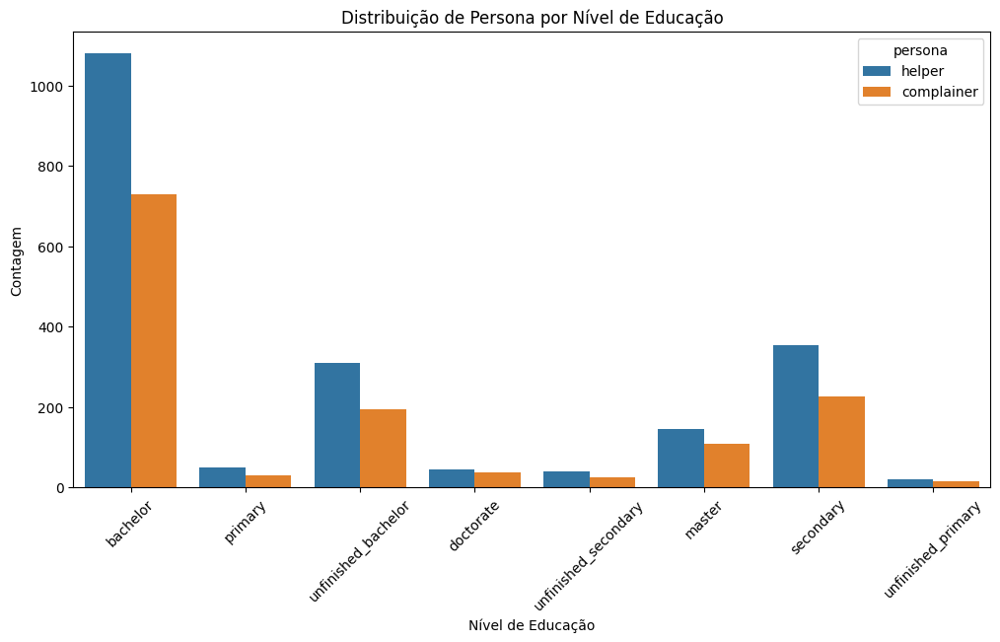

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=merged_df, x='education', hue='persona')
plt.title('Distribuição de Persona por Nível de Educação')
plt.xlabel('Nível de Educação')
plt.ylabel('Contagem')
plt.xticks(rotation=45)
plt.show()


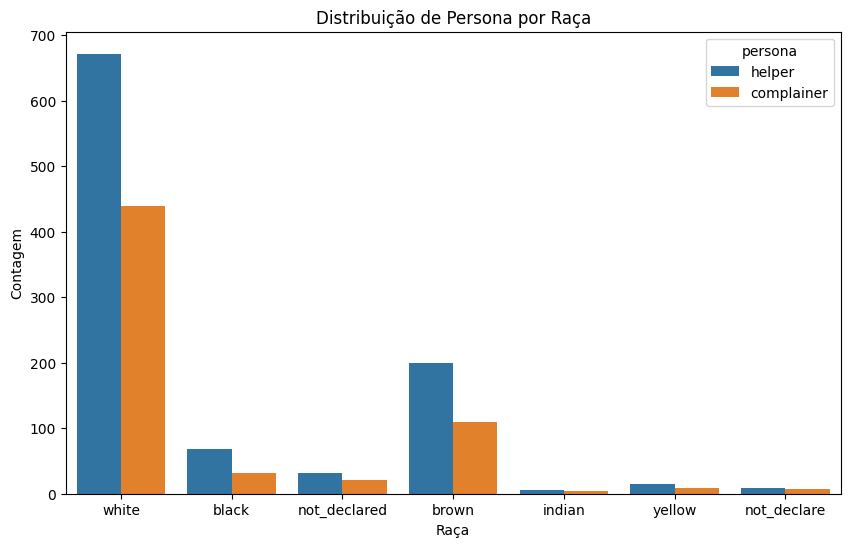

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=merged_df, x='race', hue='persona')
plt.title('Distribuição de Persona por Raça')
plt.xlabel('Raça')
plt.ylabel('Contagem')
plt.show()


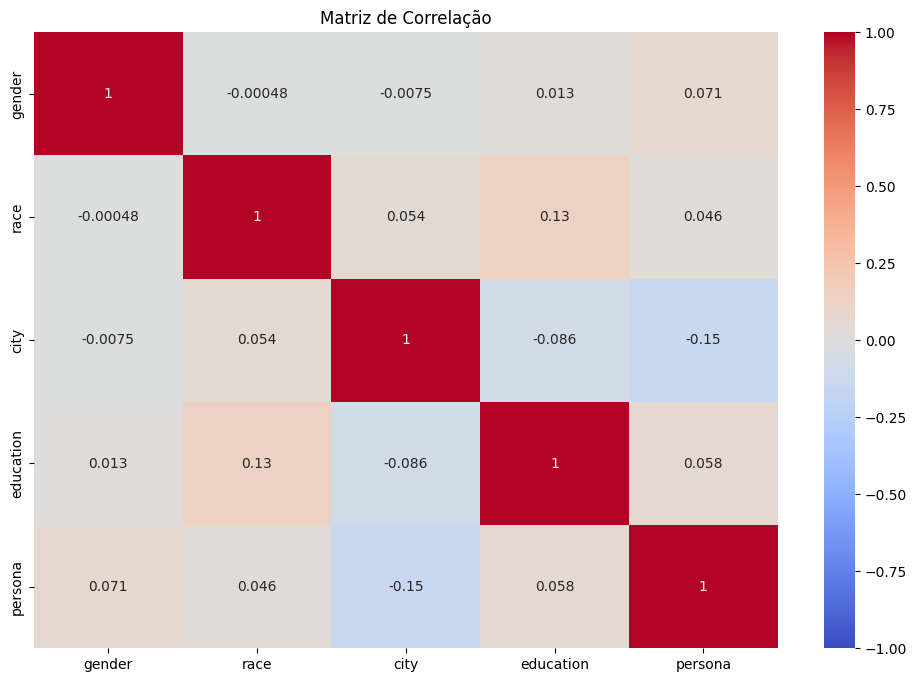

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Criar um cópia do dataframe para não alterar o original
correlation_df = merged_df.copy()

# Lista de colunas para codificar
cols_to_encode = ['gender', 'race', 'city', 'education', 'persona']

# Codificar cada coluna
for col in cols_to_encode:
    le = LabelEncoder()
    # Preencher NaNs com uma string 'Unknown' para que possam ser codificados
    correlation_df[col] = correlation_df[col].fillna('Unknown')
    correlation_df[col] = le.fit_transform(correlation_df[col])
correlation_matrix = correlation_df[['gender', 'race', 'city', 'education', 'persona']].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlação')
plt.show()


In [ ]:
correlation_df = pd.DataFrame(correlation_matrix)

# Imprimindo o DataFrame
print(correlation_df)

             gender      race      city  education   persona
gender     1.000000 -0.000484 -0.007541   0.013439  0.070558
race      -0.000484  1.000000  0.053919   0.134261  0.046453
city      -0.007541  0.053919  1.000000  -0.085868 -0.146209
education  0.013439  0.134261 -0.085868   1.000000  0.057773
persona    0.070558  0.046453 -0.146209   0.057773  1.000000


In [ ]:
merged_df['is_female'] = merged_df['gender'].apply(lambda x: 1 if x == 'female' else 0)
grouped_df = merged_df.groupby('colab_user_id').agg({'is_female': 'mean', 'persona_value': 'mean'})
correlation = grouped_df['is_female'].corr(grouped_df['persona_value'])
correlation

0.08755305507357374

In [ ]:
merged_df

,Unnamed: 0,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value
0,0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,helper,0
1,1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,helper,0
2,2,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white,helper,0
3,3,43311,1975-06-18,Niterói,bachelor,male,48.0,white,complainer,1
4,4,236585,1959-02-07,Niterói,primary,female,64.0,white,helper,0
...,...,...,...,...,...,...,...,...,...,...
4564,4564,200294,1987-08-26,Mesquita,unfinished_bachelor,female,36.0,NaN,helper,0
4565,4565,333672,1970-01-10,Santo André,NaN,others,53.0,NaN,complainer,1
4566,4566,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,helper,0
4567,4567,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,helper,0


In [ ]:
persona_df

,Unnamed: 0,event_id,colab_user_id,persona,persona_value,description
0,0,41,86,helper,0.0,Árvore bloqueando a calçada
1,1,54,2,complainer,1.0,Barraca no meio da calçada na Marquês de Olind...
2,2,58,86,helper,0.0,Utilização da calçada para estacionamento. Pad...
3,3,582,86,helper,0.0,"Árvore batendo na fiação, que já está toda bag..."
4,4,918,86,helper,0.0,Entulho na calçada e o pedestre tem que passar...
...,...,...,...,...,...,...
132845,132845,258206,293209,complainer,1.0,Vizinho fez uma reforma na casa e simplesmente...
132846,132846,274342,319241,complainer,1.0,"Porque não coloca GCM, uma Base nessa praça? ..."
132847,132847,285040,197268,helper,0.0,"Olá, no telhado do imóvel localizado na avenid..."
132848,132848,284833,95084,helper,0.0,"Boa tarde, no sambaqui de Balneario arroio do ..."


In [ ]:
@calculate_time_taken
def set_personas_scores(df):
    scores = []
    total_rows = len(df)
    for i, row in df.iterrows():
        clear_output(wait=True)
        print(f"Processando {i + 1} de {total_rows} ({(i + 1) / total_rows * 100:.2f}%)")
        description = row['description']
        result = sentiment_classifier.predict(description, ModelType.RANDOM_FOREST)
        if result.get('status') == 'ok':
            score = result.get('score')
        else:
            score = None
        # Adicione o score à lista de scores
        scores.append(score)
    # Adicione a lista de scores como uma nova coluna no DataFrame
    df['score'] = scores
#
set_personas_scores(persona_df)
persona_df

Processando 132850 de 132850 (100.00%)
Time taken: 5129.21 seconds


,Unnamed: 0,event_id,colab_user_id,persona,persona_value,description,score
0,0,41,86,helper,0.0,Árvore bloqueando a calçada,-0.03574
1,1,54,2,complainer,1.0,Barraca no meio da calçada na Marquês de Olind...,-0.03217
2,2,58,86,helper,0.0,Utilização da calçada para estacionamento. Pad...,-0.04684
3,3,582,86,helper,0.0,"Árvore batendo na fiação, que já está toda bag...",-0.13990
4,4,918,86,helper,0.0,Entulho na calçada e o pedestre tem que passar...,-0.19282
...,...,...,...,...,...,...,...
132845,132845,258206,293209,complainer,1.0,Vizinho fez uma reforma na casa e simplesmente...,-0.63388
132846,132846,274342,319241,complainer,1.0,"Porque não coloca GCM, uma Base nessa praça? ...",-0.08944
132847,132847,285040,197268,helper,0.0,"Olá, no telhado do imóvel localizado na avenid...",-0.12818
132848,132848,284833,95084,helper,0.0,"Boa tarde, no sambaqui de Balneario arroio do ...",0.40797


In [ ]:
print(persona_df.columns)

Index(['Unnamed: 0', 'event_id', 'colab_user_id', 'persona', 'persona_value',
       'description', 'score'],
      dtype='object')


In [ ]:
print(events.columns)

Index(['Unnamed: 0', 'event_id', 'colab_user_id', 'description', 'status',
       'created_at', 'event_type_id', 'event_type_name', 'lat', 'lon', 'city',
       'deleted_at', 'city_id', 'processed_post'],
      dtype='object')


In [ ]:
spider_df = persona_df.merge(events[['event_id', 'event_type_id', 'event_type_name']], on='event_id', how='left').drop(columns=['Unnamed: 0'])
spider_df

,event_id,colab_user_id,persona,persona_value,description,score,event_type_id,event_type_name
0,41,86,helper,0.0,Árvore bloqueando a calçada,-0.03574,7574,Poda de árvore
1,54,2,complainer,1.0,Barraca no meio da calçada na Marquês de Olind...,-0.03217,7558,Ocupação irregular de área pública
2,58,86,helper,0.0,Utilização da calçada para estacionamento. Pad...,-0.04684,7558,Ocupação irregular de área pública
3,582,86,helper,0.0,"Árvore batendo na fiação, que já está toda bag...",-0.13990,3942,Poda de árvore
4,918,86,helper,0.0,Entulho na calçada e o pedestre tem que passar...,-0.19282,3938,Entulho na calçada/via pública
...,...,...,...,...,...,...,...,...
132853,258206,293209,complainer,1.0,Vizinho fez uma reforma na casa e simplesmente...,-0.63388,9,Entulho na calçada/via pública
132854,274342,319241,complainer,1.0,"Porque não coloca GCM, uma Base nessa praça? ...",-0.08944,56,Ponto de exploração sexual de menores
132855,285040,197268,helper,0.0,"Olá, no telhado do imóvel localizado na avenid...",-0.12818,54,Infestação animais perigosos
132856,284833,95084,helper,0.0,"Boa tarde, no sambaqui de Balneario arroio do ...",0.40797,46,Mato alto


In [ ]:
spider_df.to_csv("spider_df.csv")

In [ ]:
def find_event_types_by_keywords(dataframe, keywords):
    # Inicialize uma lista vazia para armazenar os tipos de eventos correspondentes
    matching_event_types = []

    # Percorra as palavras-chave
    for keyword in keywords:
        # Use uma expressão regular para procurar correspondências na coluna de descrição
        matching_rows = dataframe[dataframe['description'].str.contains(keyword, case=False, na=False)]

        # Obtenha os tipos de eventos correspondentes das linhas encontradas
        event_types = matching_rows['event_type_name'].unique()

        # Adicione os tipos de eventos correspondentes à lista (remova duplicatas)
        matching_event_types.extend(event_types)

    # Remova duplicatas da lista final de tipos de eventos correspondentes
    matching_event_types = list(set(matching_event_types))

    return matching_event_types
##
keywords = ['desvalorização', 'desvalorizar', 'desvaloriza', 'desvalorizando', 'favelização', 'favela']
event_types = find_event_types_by_keywords(spider_df, keywords)
event_types

In [ ]:
event_counts = spider_df.groupby('event_type_name')['event_id'].count().sort_values(ascending=False)
# Iterar sobre os resultados e imprimir os nomes dos tipos de evento e as contagens
for event_name, count in event_counts.items():
    print(f"{event_name}: {count}")

Entulho na calçada/via pública: 48471
Lâmpada apagada à noite: 13157
Buraco nas vias: 12459
Mato alto: 4859
Bueiro entupido: 4676
Poda de árvore: 4449
Calçada irregular: 3636
Fiação irregular: 3276
Descarte irregular de lixo: 3215
Bueiro sem tampa: 2737
Ponto de infração de trânsito recorrente: 2704
Equipamento público danificado: 1842
Retirada de árvore: 1835
Vazamento de água: 1742
Veículo abandonado: 1687
Ponto recorrente de poluição sonora: 1479
Ocupação irregular de área pública: 1335
Vazamento de esgoto: 1326
Lâmpada acesa de dia: 1158
Ponto de alagamento: 1099
Esgoto a céu aberto: 1091
Iluminação pública irregular: 1007
Bloqueio na via: 930
Placa de sinalização quebrada/inexistente: 684
Ponto de assalto/roubo: 678
Aglomeração de pessoas: 660
Imóvel ou terreno abandonado: 586
Publicidade irregular em via pública: 566
Comércio aberto irregularmente: 544
Faixa de pedestre apagada: 508
Foco de mosquito da dengue/zika: 475
Infestação animais perigosos: 463
Manutenção de semáforo: 428

In [ ]:
# Group the data by 'event_type_id' and 'event_type_name',
# and calculate the count of rows, average 'score', and average 'persona_value' for each group
grouped_data = spider_df.groupby(['event_type_id', 'event_type_name']).agg({'score': ['count', 'mean'], 'persona_value': 'mean'}).reset_index()

# Flatten the MultiIndex columns
grouped_data.columns = ['_'.join(col).strip('_') for col in grouped_data.columns.values]

# Filter the grouped_data to include only the top 10 event_type_ids with the most rows (posts)
grouped_data = grouped_data.nlargest(30, 'score_count')

# Define the labels (categories) for the spider chart
labels = grouped_data['event_type_id'].astype(str).tolist()

# Define the data points for the spider chart
score_data = grouped_data['score_mean'].tolist()
persona_data = grouped_data['persona_value_mean'].tolist()

# Define a list of colors for each event type
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create the spider chart
fig = go.Figure()

# Update legend to show event_type_name
fig.update_layout(legend_title_text='Event Type Name', legend=dict(itemsizing='constant'))

# Add custom legend annotations to the layout
#fig.update_layout(annotations=annotations)

# Update layout for height and title
fig.update_layout(
    height=800,
    title_text='Distribuição de personas por tipo de evento'
)

# Add trace for 'persona_value'
fig.add_trace(go.Scatterpolar(r=persona_data, theta=labels, fill='toself', name='Persona Value'))

# Add trace for 'score'
fig.add_trace(go.Scatterpolar(r=score_data, theta=labels, fill='toself', name='Score'))

# Update layout for better readability
fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[min(min(score_data), min(persona_data)), max(max(score_data), max(persona_data))])),
    showlegend=True
)

# Update legend to show event_type_name instead of event_type_id
fig.update_layout(legend_title_text='Event Type Name', legend=dict(itemsizing='constant'))

# Create a mapping of event_type_id to event_type_name
id_to_name_mapping = dict(zip(grouped_data['event_type_id'].astype(str), grouped_data['event_type_name']))

# Update trace names using the mapping
for trace in fig.data:
    trace.name = id_to_name_mapping.get(trace.name, trace.name)

# Create a mapping of event_type_id to event_type_name
id_to_name_mapping = dict(zip(grouped_data['event_type_id'].astype(str), grouped_data['event_type_name']))

# Update trace names using the mapping
for trace in fig.data:
    trace.name = id_to_name_mapping.get(trace.name, trace.name)

# Loop through each event type and add a separate trace with a specific color
for i, (label, score, persona) in enumerate(zip(labels, score_data, persona_data)):
    fig.add_trace(go.Scatterpolar(
        r=[persona, score],
        theta=[label, label],
        fill='toself',
        name=id_to_name_mapping[label],
        line_color=colors[i % len(colors)]  # Cycle through the color list
    ))

# Update layout for better readability
fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[min(min(score_data), min(persona_data)), max(max(score_data), max(persona_data))])),
    showlegend=True
)

# Create custom legend annotations
annotations = []
for i, (event_id, event_name) in enumerate(id_to_name_mapping.items()):
    annotations.append(
        dict(
            x=0,
            y=1 - i * 0.05,  # Adjust the spacing between legend entries by modifying 0.1
            xref="paper",
            yref="paper",
            text=f"{event_id}: {event_name}",
            showarrow=False,
            font=dict(size=10)
        )
    )

# Add custom legend annotations to the layout
fig.update_layout(annotations=annotations)

fig.update_layout(
    height=800,
    title_text='Distribuição de personas por tipo de evento'
)

# Show the plot
fig.show()


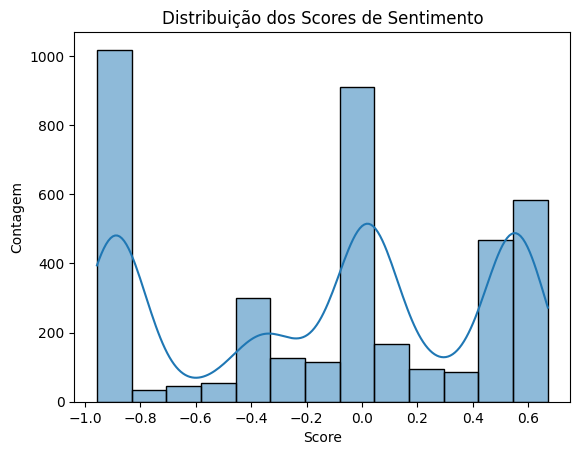

In [ ]:
sns.histplot(events_with_scores_and_personas['score'], kde=True)
plt.title('Distribuição dos Scores de Sentimento')
plt.xlabel('Score')
plt.ylabel('Contagem')
plt.show()


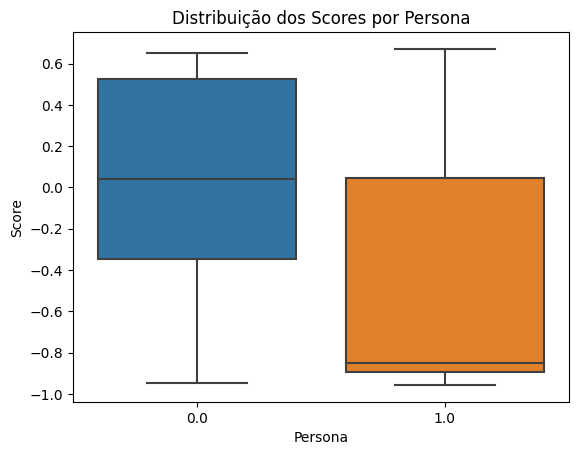

In [ ]:
sns.boxplot(x='persona_value', y='score', data=events_with_scores_and_personas)
plt.title('Distribuição dos Scores por Persona')
plt.xlabel('Persona')
plt.ylabel('Score')
plt.show()


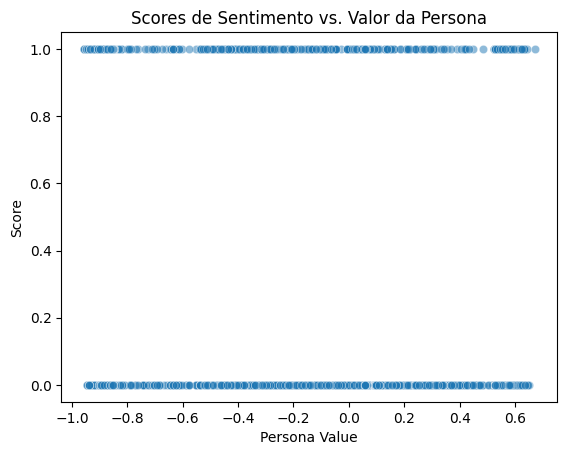

In [ ]:
sns.scatterplot(x='score', y='persona_value', data=events_with_scores_and_personas, alpha=0.5)
plt.title('Scores de Sentimento vs. Valor da Persona')
plt.xlabel('Persona Value')
plt.ylabel('Score')
plt.show()


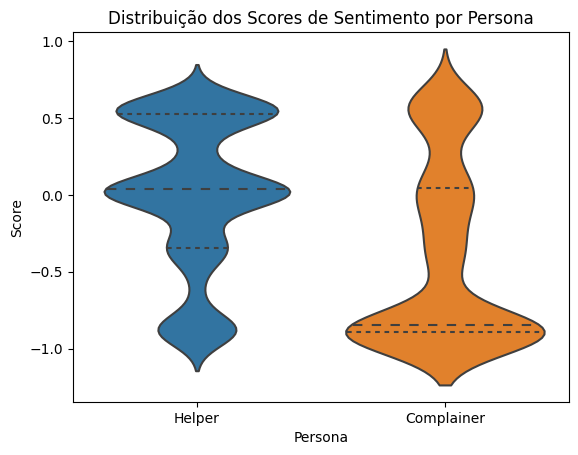

In [ ]:
sns.violinplot(x='persona_value', y='score', data=events_with_scores_and_personas, inner='quartile')
plt.title('Distribuição dos Scores de Sentimento por Persona')
plt.xlabel('Persona')
plt.ylabel('Score')
plt.xticks([0, 1], ['Helper', 'Complainer'])
plt.show()

In [ ]:
print(events_with_scores_and_personas.columns)

Index(['event_id', 'colab_user_id', 'score', 'persona_value'], dtype='object')


# Download dos resultados

In [ ]:
sentiment_classifier.save_model('sentiment_model.joblib')

In [ ]:
persona_classifier_mb.save_model('persona_classifier_mb.joblib')
persona_classifier_xb.save_model('persona_classifier_xb.joblib')

In [ ]:
merged_df.to_csv("colab_users_personas.csv")

In [ ]:
# Merge dos DataFrames com base na coluna 'event_id'
combined_df = pd.merge(persona_df, events[['event_id', 'description']], on='event_id', how='left')
combined_df.to_csv("colab_posts_classified_personas.csv")

In [ ]:
combined_df

,event_id,colab_user_id,persona,persona_value,description
0,41,86,helper,0.0,Árvore bloqueando a calçada
1,54,2,complainer,1.0,Barraca no meio da calçada na Marquês de Olind...
2,58,86,helper,0.0,Utilização da calçada para estacionamento. Pad...
3,582,86,helper,0.0,"Árvore batendo na fiação, que já está toda bag..."
4,918,86,helper,0.0,Entulho na calçada e o pedestre tem que passar...
...,...,...,...,...,...
132845,258206,293209,complainer,1.0,Vizinho fez uma reforma na casa e simplesmente...
132846,274342,319241,complainer,1.0,"Porque não coloca GCM, uma Base nessa praça? ..."
132847,285040,197268,helper,0.0,"Olá, no telhado do imóvel localizado na avenid..."
132848,284833,95084,helper,0.0,"Boa tarde, no sambaqui de Balneario arroio do ..."


# Load Classified data (for testing)

In [ ]:
#colab_posts_classified_personas = "https://drive.google.com/uc?id=1niapSLOGkXfyAQRYQzjHoUzIbPkXgd59&export=download"
colab_posts_classified_personas = "colab_posts_classified_personas.csv"
persona_df = pd.read_csv(colab_posts_classified_personas, sep=',', decimal='.', header=0)
persona_df

,Unnamed: 0,event_id,colab_user_id,persona,persona_value,description
0,0,41,86,helper,0.0,Árvore bloqueando a calçada
1,1,54,2,complainer,1.0,Barraca no meio da calçada na Marquês de Olind...
2,2,58,86,helper,0.0,Utilização da calçada para estacionamento. Pad...
3,3,582,86,helper,0.0,"Árvore batendo na fiação, que já está toda bag..."
4,4,918,86,helper,0.0,Entulho na calçada e o pedestre tem que passar...
...,...,...,...,...,...,...
132845,132845,258206,293209,complainer,1.0,Vizinho fez uma reforma na casa e simplesmente...
132846,132846,274342,319241,complainer,1.0,"Porque não coloca GCM, uma Base nessa praça? ..."
132847,132847,285040,197268,helper,0.0,"Olá, no telhado do imóvel localizado na avenid..."
132848,132848,284833,95084,helper,0.0,"Boa tarde, no sambaqui de Balneario arroio do ..."


In [ ]:
#colab_users_personas = "https://drive.google.com/uc?id=1iH33cIg0f5i-vak-x3A3cC9tvnXxuOIp&export=download"
colab_users_personas = "colab_users_personas.csv"
@calculate_time_taken
def load_merged_df():
  merged_df = pd.read_csv(colab_users_personas, sep=',', decimal='.', header=0)
  merged_df['colab_user_id'] = merged_df['colab_user_id'].astype(str)
  return merged_df
##
merged_df = load_merged_df()

Time taken: 0.02 seconds


In [ ]:
# Filtrar as linhas onde 'persona' e 'persona_value' são vazias ou nulas
empty_persona_rows = merged_df[(merged_df['persona'].isna() | merged_df['persona'] == '') &
                               (merged_df['persona_value'].isna() | merged_df['persona_value'] == '')]

# Obter a quantidade de linhas
num_empty_persona_rows = len(empty_persona_rows)

# Obter os colab_user_id dessas linhas
empty_persona_user_ids = empty_persona_rows['colab_user_id'].tolist()

print(f"Existem {num_empty_persona_rows} linhas onde 'persona' e 'persona_value' são vazias.")
print(f"Os colab_user_id dessas linhas são: {empty_persona_user_ids}")

Existem 0 linhas onde 'persona' e 'persona_value' são vazias.
Os colab_user_id dessas linhas são: []


# Network Plotter

In [ ]:
import plotly.offline as pyo

In [ ]:
class NetworkPlotter3D:
    def __init__(self, G, palette, communities, layout_function, pos=None, highlight="communities"):
        self.G = G
        self.palette = palette
        self.communities = communities
        self.layout_function = layout_function
        self.pos = pos
        self.highlight = highlight
        # print(self.palette)
        self.edge_x = []
        self.edge_y = []
        self.edge_z = []
        self.node_x = []
        self.node_y = []
        self.node_z = []
        self.node_colors = []
        self.node_sizes = []
        self.hover_texts = []
        self._prepare_data()

    def _prepare_data(self):
        # Convert node names in the G to integers if they aren't
        # if not all(isinstance(node, int) for node in self.G.nodes()):
        #    mapping = {node: int(node) for node in self.G.nodes()}
        #    self.G = nx.relabel_nodes(self.G, mapping)

        # Compute persona colors
        if (self.highlight == 'communities'):
            self._compute_modularity_colors()
        elif (self.highlight == 'personas'):
            self.palette = {
                "helper": "blue",
                "complainer": "red",
                "Unclassified": "orange"
            }
            self._compute_persona_colors()
        else:
            raise ValueError("highlight should be 'communities' or 'persona'")

        # Compute node metrics
        self._compute_node_metrics()

        # Compute node sizes based on eigenvector centrality
        self.node_sizes = self._compute_node_sizes()

        # Compute 3D positions
        if self.pos is None:
            self.pos = self.layout_function(
                self.G, dim=3, communities=self.communities)

        # Extract edge positions
        self._extract_edge_positions()

        # Extract node positions and hover texts
        self._extract_node_positions_and_hover_texts()

    def _compute_persona_colors(self):
        persona_color = nx.get_node_attributes(self.G, 'persona')
        # print(persona_color)
        default_color = 'orange'  # Cor padrão para nós sem persona
        for node in self.G.nodes():
            if node in persona_color:
                self.G.nodes[node]['color'] = self.palette[persona_color[node]]
            else:
                self.G.nodes[node]['color'] = default_color
        self.node_colors = [self.G.nodes[node]['color']
                            for node in self.G.nodes()]
        # print(self.node_colors)

    def _compute_modularity_colors(self):
        modularity_color = {}
        for community_number, community in enumerate(self.communities):
            for nodeid_str in community:
                # Convert the node identifier to the appropriate type
                # Convert to int if the nodes in the graph are integers
                nodeid = str(nodeid_str)
                modularity_color[nodeid] = self.palette[community_number]
        # Ensure all nodes have a color
        default_color = "black"  # Default color for nodes not in any community
        for node in self.G.nodes():
            if node not in modularity_color:
                modularity_color[node] = default_color
        nx.set_node_attributes(self.G, modularity_color, 'color')
        self.node_colors = [modularity_color[node] for node in self.G.nodes()]
        # print(self.node_colors)

    def _compute_node_metrics(self):
        # Compute degree for each node
        degrees = dict(self.G.degree())
        nx.set_node_attributes(self.G, degrees, 'degree')

        # Compute eigenvector centrality for each node
        eigenvector_centrality = nx.eigenvector_centrality(self.G)
        nx.set_node_attributes(
            self.G, eigenvector_centrality, 'eigenvector_centrality')

        # Compute followers (in-degree) and following (out-degree) for each node
        followers = dict(self.G.in_degree())
        following = dict(self.G.out_degree())
        nx.set_node_attributes(self.G, followers, 'followers')
        nx.set_node_attributes(self.G, following, 'following')

    def _compute_node_sizes(self):
        centrality_values = [
            self.G.nodes[node]['eigenvector_centrality'] for node in self.G.nodes()]
        max_centrality = max(centrality_values)
        min_centrality = min(centrality_values)
        size_bounds = {'desired': {'lower': 5, 'upper': 50}, 'actual': {
            'lower': min_centrality, 'upper': max_centrality}}
        sizes = [size_bounds['desired']['lower'] + (x - size_bounds['actual']['lower']) * (size_bounds['desired']['upper'] - size_bounds['desired']['lower']) / (
            size_bounds['actual']['upper'] - size_bounds['actual']['lower']) for x in centrality_values]
        return sizes

    def _extract_edge_positions(self):
        for edge in self.G.edges():
            x0, y0, z0 = self.pos[edge[0]]
            x1, y1, z1 = self.pos[edge[1]]
            self.edge_x.extend([x0, x1, None])
            self.edge_y.extend([y0, y1, None])
            self.edge_z.extend([z0, z1, None])

    def _extract_node_positions_and_hover_texts(self):
        for node in self.G.nodes():
            self.node_x.append(self.pos[node][0])
            self.node_y.append(self.pos[node][1])
            self.node_z.append(self.pos[node][2])

            node_id_text = f"Node ID: {node}"
            community_text = f"Community: {self.G.nodes[node].get('modularity_class', 'N/A')}"
            persona_text = f"Persona: {self.G.nodes[node].get('persona', 'N/A')}"
            degree_text = f"Degree: {self.G.nodes[node].get('degree', 'N/A')}"
            # Rounded to 4 decimal places
            eigenvector_text = f"Eigenvector Centrality: {self.G.nodes[node].get('eigenvector_centrality', 'N/A'):.4f}"
            followers_text = f"Followers: {self.G.nodes[node].get('followers', 'N/A')}"
            following_text = f"Following: {self.G.nodes[node].get('following', 'N/A')}"

            hover_info = f"{node_id_text}<br>{persona_text}<br>{community_text}<br>{degree_text}<br>{eigenvector_text}<br>{followers_text}<br>{following_text}"
            self.hover_texts.append(hover_info)

    def plot(self, title="Network Plot", filename=None):
        # print(self.node_colors)
        # 0.5 is the opacity, adjust as needed
        edge_color_with_opacity = 'rgba(128, 128, 128, 0.8)'
        edge_trace = go.Scatter3d(
            x=self.edge_x,
            y=self.edge_y,
            z=self.edge_z,
            mode='lines',
            line=dict(width=0.5, color=edge_color_with_opacity),
            showlegend=False,
            hoverinfo='none'
        )
        node_trace = go.Scatter3d(x=self.node_x, y=self.node_y, z=self.node_z, mode='markers', marker=dict(
            size=self.node_sizes, color=self.node_colors, opacity=0.8), showlegend=False, text=self.hover_texts, hoverinfo='text')
        fig = go.Figure(data=[edge_trace, node_trace])
        # print(self.communities)
        if (self.highlight == 'communities'):
            for community_number, members in enumerate(self.communities):
                print(community_number)
                fig.add_trace(go.Scatter3d(x=[None], y=[None], z=[None], mode='markers', marker=dict(
                    size=10, color=self.palette[community_number]), name=f"Community {community_number}"))
        else:
            for persona, color in self.palette.items():
                fig.add_trace(go.Scatter3d(x=[None], y=[None], z=[None], mode='markers', marker=dict(
                    size=10, color=color), name=persona.capitalize()))
        fig.update_layout(title={
            'text': title,
            'y': 0.9,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {
                'size': 20,
                'color': 'black'
            }
        },
            scene=dict(aspectmode='data',
                       xaxis=dict(nticks=10, showspikes=False, showbackground=False,
                                  showline=False, zeroline=False, showgrid=False, showticklabels=False),
                       yaxis=dict(nticks=10, showspikes=False, showbackground=False,
                                  showline=False, zeroline=False, showgrid=False, showticklabels=False),
                       zaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False)),
            margin=dict(t=20, b=20, r=20, l=20),
            height=800)
        if filename:
            # Save the figure as an HTML file
            pyo.plot(fig, filename=filename, auto_open=False)
        fig.show()

# Network Analysis Utilities

In [ ]:
def kamada_kawai_layout_strategy(G, **kwargs):
    dim = kwargs.get('dim', 3)
    return nx.kamada_kawai_layout(G, dim=dim)
#######
def custom_3d_layout(G, **kwargs):
    communities = kwargs.get('communities', [])
    pos_initial = nx.kamada_kawai_layout(G, dim=3)

    # Calculate eigenvector centrality
    centrality = nx.eigenvector_centrality_numpy(G)

    new_positions = {}

    # Position community nodes
    for community in communities:
        # Identify the most influential user in the community
        influential_user = max(community, key=lambda x: centrality[x])
        new_positions[influential_user] = pos_initial[influential_user]

        # Position other community members around the influential user
        for member in community:
            if member != influential_user:
                # Calculate vector from influential user to member
                vector = np.array(pos_initial[member]) - np.array(pos_initial[influential_user])
                # Scale the vector to bring the member closer to the influential user
                vector *= 0.5
                new_positions[member] = tuple(np.array(pos_initial[influential_user]) + vector)

    # Position non-community nodes
    for node in G.nodes():
        if node not in new_positions:
            neighbors = list(G.neighbors(node))
            if neighbors:
                avg_position = np.mean([np.array(pos_initial[neighbor]) for neighbor in neighbors], axis=0)
                new_positions[node] = tuple(avg_position)
            else:
                # If the node has no neighbors, keep its initial position
                new_positions[node] = pos_initial[node]

    return new_positions

In [ ]:
@calculate_time_taken
def calculate_graph_positions(G, **kwargs):
  dim = kwargs.get('dim', 3)
  layout = kwargs.get('layout', kamada_kawai_layout_strategy)
  communities = kwargs.get('communities', [])
  return layout(G, dim=dim, communities=communities)
##

In [ ]:
@calculate_time_taken
def plot_network(G, palette, network_communities, layout, pos, title, filename, highlight) :
  plotter = NetworkPlotter3D(G, palette, network_communities, layout, pos=pos, highlight=highlight)
  plotter.plot(title=title, filename=filename)
##

In [ ]:
def graph_to_dataframe(G):
    # Extract nodes and their attributes into a list of dictionaries
    data = []
    for node, attrs in G.nodes(data=True):
        attrs['node'] = node  # Add the node itself as an attribute
        data.append(attrs)

    # Convert the list of dictionaries into a DataFrame
    df = pd.DataFrame(data)

    # Set the 'node' column as the index
    df.set_index('node', inplace=True)

    return df

In [ ]:
def update_node_attributes(G, df):
    """
    Update the node attributes in the graph G with the corresponding data from df.

    :param G: networkx.Graph
        The graph whose node attributes need to be updated.
    :param df: pandas.DataFrame
        The DataFrame containing the node data.
    """
    # Ensure the 'colab_user_id' column in df is of the same type as the node labels in G
    df['colab_user_id'] = df['colab_user_id'].astype(str)

    # Iterate through the nodes of the graph 'G' and update node information
    for colab_user_id in G.nodes():
        # Check if the 'colab_user_id' exists in the 'df' DataFrame
        if colab_user_id in df['colab_user_id'].values:
            # Get the node data from 'df'
            node_data = df[df['colab_user_id'] == colab_user_id].iloc[0]
            # Update the node attributes in 'G' with the data from 'df'
            G.nodes[colab_user_id].update(node_data.to_dict())

In [ ]:
def infomap_communities(G):
    im = infomap.Infomap()

    # Add nodes and links (edges) to the Infomap instance
    for node in G.nodes():
        im.add_node(node)
    for u, v in G.edges():
        im.add_link(u, v)

    # Run the Infomap algorithm
    im.run()

    # Extract the communities
    network_communities = {}
    for node in im.tree:
        if node.is_leaf:
            network_communities.setdefault(node.module_id, []).append(node.node_id)

    # Convert the dictionary values to a list of lists
    communities_list = list(network_communities.values())
    return communities_list

# Example usage:
G = nx.karate_club_graph()
result = infomap_communities(G)
print(result)

[[33, 32, 31, 23, 8, 30, 29, 27, 25, 28, 24, 26, 22, 20, 18, 15, 14], [0, 2, 1, 3, 13, 7, 19, 9, 12, 17, 21, 11], [5, 6, 4, 10, 16]]


In [ ]:
def leiden_communities(G, algo=leidenalg.RBERVertexPartition, resolution=1.0, num_iterations=10):
  g = ig.Graph.from_networkx(G)

  # Set the 'name' attribute for each vertex in the igraph graph
  g.vs["name"] = list(G.nodes())

  # Find the communities using the Leiden algorithm with the specified resolution parameter
  if(algo != leidenalg.ModularityVertexPartition):
    partition = leidenalg.find_partition(g, algo, n_iterations=num_iterations, resolution_parameter=resolution)
  else:
    partition = leidenalg.find_partition(g, algo)

  # Extract the communities
  network_communities = [list(partition.subgraph(i).vs["name"]) for i in range(len(partition))]
  return network_communities
##
G = nx.karate_club_graph()
result = leiden_communities(G)
result

[[8, 14, 15, 18, 20, 22, 23, 26, 29, 30, 32, 33],
 [0, 1, 2, 3, 7, 12, 13, 17, 19, 21],
 [4, 5, 6, 10, 16],
 [24, 25, 27, 28, 31],
 [9],
 [11]]

In [ ]:
def form_valid_partition(communities, G):
    valid_partition = []
    covered_nodes = set()
    for community in communities:
        new_community = community - covered_nodes
        if new_community:
            valid_partition.append(new_community)
            covered_nodes.update(new_community)
    remaining_nodes = set(G.nodes) - covered_nodes
    if remaining_nodes:
        valid_partition.append(remaining_nodes)
    return valid_partition
##

In [ ]:
@calculate_time_taken
def analyze_communities(G, algorithm='greedy', **kwargs):
    # Define a dictionary mapping algorithm names to functions
    algorithms = {
        'greedy': nx.community.greedy_modularity_communities,
        'naive': nx.community.naive_greedy_modularity_communities,
        'label_propagation': nx.community.label_propagation_communities,
        'louvain': nx.community.louvain_communities,
        'community_louvain': community_louvain.best_partition,
        'leiden': leiden_communities,
        'girvan_newman': nx.community.girvan_newman,
        'asyn_lpa': nx.community.asyn_lpa_communities,
        'k_clique': nx.community.k_clique_communities,
        'infomap': infomap_communities
    }

    # Get the selected algorithm function from the dictionary
    algo_func = algorithms.get(algorithm)
    if algo_func is None:
        raise ValueError(f"Invalid algorithm name: {algorithm}")

    # Convert the graph to undirected if necessary
    if algorithm in {'girvan_newman', 'k_clique', 'community_louvain', 'naive', 'label_propagation'}:
        G = G.to_undirected()

    # Find communities using the selected algorithm
    if algorithm == 'girvan_newman':
        best_modularity = -1
        best_communities = None
        for communities in algo_func(G, **kwargs):
            modularity = nx.community.modularity(G, communities)
            if modularity > best_modularity:
                best_modularity = modularity
                best_communities = communities
        network_communities = list(best_communities)
    elif algorithm == 'k_clique':
        network_communities = list(algo_func(G, **kwargs))
        network_communities = form_valid_partition(network_communities, G)
    elif algorithm == 'community_louvain':
        partition = community_louvain.best_partition(G)
        modularity_score = community_louvain.modularity(partition, G)
        communities = {}
        for node, community_id in partition.items():
            communities.setdefault(community_id, []).append(node)
        network_communities = list(communities.values())
    else:
        network_communities = list(algo_func(G, **kwargs))
    #print(network_communities)
    if (algorithm != 'community_louvain'):
        network_communities = [list(community)
                               for community in network_communities]
        modularity_score = nx.community.modularity(G, network_communities)

    min_size = 3
    max_size = 50
    network_communities = [community for community in network_communities if (len(community) >= min_size) & (len(community) <= max_size)]
    print(f"Number of communities: {len(network_communities)}")

    largest_community = max(network_communities, key=len)
    smallest_community = min(network_communities, key=len)
    avg_size = sum(len(community)
                   for community in network_communities) / len(network_communities)

    return {
        "communities": network_communities,
        "number_of_communities": len(network_communities),
        "largest_community_size": len(largest_community),
        "smallest_community_size": len(smallest_community),
        "average_community_size": avg_size,
        "modularity_score": modularity_score
    }

In [ ]:
def set_node_modularity_class(G, communities, verbose=False):
    # Initialize all nodes with a default community value
    nx.set_node_attributes(G, '-1', 'modularity_class')

    for i, community in enumerate(communities):
        if(verbose):
            print(f"Assigning nodes {community} to community {i}")
        for node in community:
            G.nodes[str(node)]['modularity_class'] = str(i)

    # Check the community property of each node
    if(verbose):
        for node, data in G.nodes(data=True):
            print(f"Node {node} has community {data['modularity_class']}")

In [ ]:
!pip install python-louvain
import community.community_louvain as community_louvain

# Network Analysis

In [ ]:
merged_df_source = merged_df.copy()
merged_df_source

,Unnamed: 0,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value,in_degree,out_degree,eigenvector_centrality
0,0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,helper,0,7,7,6.222080e-03
1,1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,helper,0,9,6,6.968046e-03
2,2,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white,helper,0,0,1,3.078415e-66
3,3,43311,1975-06-18,Niterói,bachelor,male,48.0,white,complainer,1,8,4,7.759843e-04
4,4,236585,1959-02-07,Niterói,primary,female,64.0,white,helper,0,108,90,2.428647e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4564,4564,200294,1987-08-26,Mesquita,unfinished_bachelor,female,36.0,NaN,helper,0,5,0,2.566575e-02
4565,4565,333672,1970-01-10,Santo André,NaN,others,53.0,NaN,complainer,1,3,0,5.479918e-03
4566,4566,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,helper,0,2,0,1.326401e-02
4567,4567,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,helper,0,1,0,2.693736e-05


In [ ]:
# Criar o grafo a partir do DataFrame edges
G = nx.from_pandas_edgelist(edges, source='source', target='target', create_using=nx.DiGraph())
mapping = {node: str(node) for node in G.nodes()}
G = nx.relabel_nodes(G, mapping)
print(G)

DiGraph with 6904 nodes and 25785 edges


In [ ]:
# Step 1: Extract the set of unique colab_user_id from the events DataFrame
unique_colab_user_ids = set(events['colab_user_id'].unique())

# Step 2: Extract the set of nodes from the graph G
graph_nodes = set(G.nodes)

# Step 3: Find the difference between the set of nodes and the set of colab_user_id
nodes_without_rows = graph_nodes - unique_colab_user_ids

# Print the nodes in G that don't have corresponding rows in the events DataFrame
print("Nodes in G without corresponding rows in events DataFrame:", nodes_without_rows)


Nodes in G without corresponding rows in events DataFrame: {'63787', '204179', '345484', '269557', '190684', '59027', '95084', '214001', '118624', '64091', '75064', '98690', '243139', '234361', '345778', '156967', '251504', '291337', '94706', '248552', '136617', '217448', '224989', '291699', '59774', '181072', '44677', '186916', '43322', '266277', '119917', '60164', '161261', '163377', '197858', '184511', '113956', '85664', '248051', '113301', '149261', '163979', '187572', '161978', '203072', '113230', '230939', '248341', '334441', '163823', '131813', '178664', '132110', '132790', '85742', '209620', '58979', '262523', '58746', '78469', '429866', '109796', '150797', '317894', '169000', '325522', '149593', '58898', '244053', '239390', '175144', '58803', '43510', '363058', '229476', '59883', '187416', '326237', '214514', '174896', '60011', '122305', '43343', '63920', '234630', '275686', '209452', '214840', '137685', '204883', '317635', '203416', '344088', '280028', '264373', '275866', '11

In [ ]:
#merged_df = load_merged_df()
merged_df = filter_dataframe_by_nodes(merged_df_source, G.nodes())
print_persona_statistics(merged_df, len(G.nodes()))

Numero de nós: 6904
Numero de usuários classificados: 4569 (66.18%)
Helper: 2628 (57.52%)
Complainer: 1941 (42.48%)


In [ ]:
# Calcular métricas de rede
in_degrees = G.in_degree()
out_degrees = G.out_degree()
eigenvector_centralities = nx.eigenvector_centrality(G)

# Convertendo InDegreeView e OutDegreeView para dicionários
in_degree_dict = dict(in_degrees)
out_degree_dict = dict(out_degrees)

# Adicionar métricas ao merged_df
merged_df['in_degree'] = merged_df['colab_user_id'].map(lambda user: in_degree_dict.get(user, 0))
merged_df['out_degree'] = merged_df['colab_user_id'].map(lambda user: out_degree_dict.get(user, 0))
merged_df['eigenvector_centrality'] = merged_df['colab_user_id'].map(lambda user: eigenvector_centralities.get(user, 0))

In [ ]:
cols_to_correlate = ['in_degree', 'out_degree', 'eigenvector_centrality', 'persona_value']
correlation_matrix = merged_df[cols_to_correlate].corr()
print_dataframe(correlation_matrix)

                        in_degree  out_degree  eigenvector_centrality  persona_value
in_degree                1.000000    0.616043                0.542132      -0.095270
out_degree               0.616043    1.000000                0.309085      -0.055753
eigenvector_centrality   0.542132    0.309085                1.000000      -0.158597
persona_value           -0.095270   -0.055753               -0.158597       1.000000


In [ ]:
# Agrupar por 'persona' e calcular a média das métricas
average_metrics = merged_df.groupby('persona')[['in_degree', 'out_degree', 'eigenvector_centrality']].mean()

print(average_metrics)

            in_degree  out_degree  eigenvector_centrality
persona                                                  
complainer   2.921690    3.594539                0.002280
helper       4.383562    5.492770                0.006478


# Community Detection Algorithms

In [ ]:
#best community detection algo for Directed Graphs. the other ones might be bugged
communities_summary = analyze_communities(G, algorithm="leiden", resolution=1.3453, algo=leidenalg.RBConfigurationVertexPartition)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]
set_node_modularity_class(G,network_communities,False)

Number of communities: 32
Time taken: 3.54 seconds
error playing sound lmao
Number of communities: 32
Largest community has 27 nodes.
Smallest community has 3 nodes.
Average community size: 6.06
Modularity score: 0.6311


In [ ]:
# Detect Network Communities
communities_summary = analyze_communities(G, algorithm="greedy")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]
#network_communities

Time taken: 83.49 seconds


Number of communities: 110
Largest community has 1674 nodes.
Smallest community has 2 nodes.
Average community size: 62.76
Modularity score: 0.6333


In [ ]:
communities_summary = analyze_communities(G, algorithm="naive")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

In [ ]:
communities_summary = analyze_communities(G, algorithm="label_propagation")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 0.67 seconds


Number of communities: 345
Largest community has 3725 nodes.
Smallest community has 2 nodes.
Average community size: 20.01
Modularity score: 0.5023


In [ ]:
communities_summary = analyze_communities(G, algorithm="louvain")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 0.97 seconds


Number of communities: 1176
Largest community has 917 nodes.
Smallest community has 2 nodes.
Average community size: 5.87
Modularity score: 0.4788


In [ ]:
communities_summary = analyze_communities(G, algorithm="community_louvain")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 2.07 seconds


Number of communities: 39
Largest community has 1787 nodes.
Smallest community has 2 nodes.
Average community size: 177.03
Modularity score: 0.6165


In [ ]:
communities_summary = analyze_communities(G, algorithm="girvan_newman")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

In [ ]:
communities_summary = analyze_communities(G, algorithm="asyn_lpa")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 0.43 seconds


Number of communities: 2924
Largest community has 1147 nodes.
Smallest community has 1 nodes.
Average community size: 2.36
Modularity score: 0.3279


In [ ]:
communities_summary = analyze_communities(G, algorithm="k_clique", k=3)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 5.03 seconds


Number of communities: 371
Largest community has 3002 nodes.
Smallest community has 1 nodes.
Average community size: 18.61
Modularity score: 0.1333


In [ ]:
communities_summary = analyze_communities(G, algorithm="infomap")
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

In [ ]:
min_size = 4  # or whatever minimum size you deem appropriate
max_size = 30
network_communities = [community for community in network_communities if (len(community) >= min_size) & (len(community) <= max_size)]
print(f"Number of communities: {len(network_communities)}")

Number of communities: 95


# Set Node properties

In [ ]:
update_node_attributes(G, merged_df)

In [ ]:
node_props = graph_to_dataframe(G)
node_props

,modularity_class,color,degree,eigenvector_centrality,followers,following,Unnamed: 0,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value,in_degree,out_degree
node,,,,,,,,,,,,,,,,,,
113450,-1,orange,504,4.644779e-02,136,368,967.0,113450,1974-02-20,Niterói,master,male,49.0,white,helper,0.0,136.0,368.0
162519,-1,orange,26,1.561611e-02,5,21,174.0,162519,1990-07-13,Niterói,bachelor,male,33.0,white,complainer,1.0,5.0,21.0
118923,-1,orange,17,5.931975e-03,17,0,3718.0,118923,1967-08-14,Niterói,NaN,male,56.0,NaN,helper,0.0,17.0,0.0
40367,-1,orange,64,1.155642e-02,31,33,605.0,40367,1956-06-14,Niterói,bachelor,male,67.0,NaN,helper,0.0,31.0,33.0
123242,-1,orange,3,2.713653e-03,3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243738,-1,orange,2,3.078415e-66,0,2,4276.0,243738,1981-09-20,Niterói,bachelor,female,42.0,white,helper,0.0,0.0,2.0
247164,-1,orange,1,3.078415e-66,0,1,4285.0,247164,1983-03-09,Santo André,bachelor,male,40.0,NaN,complainer,1.0,0.0,1.0
248233,19,orange,3,3.078415e-66,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Calculate the assortativity of 'G' with respect to the 'persona' attribute
persona_assortativity = nx.attribute_assortativity_coefficient(G, 'persona')
print(f"Assortativity with respect to 'persona': {round(persona_assortativity,3)}")

Assortativity with respect to 'persona': 0.127


# Subsample Graph (for testing)

In [ ]:
import random
mapping = {node: str(node) for node in G.nodes()}
G = nx.relabel_nodes(G, mapping)

N = 200  # or any other desired number

# Extract unique colab_user_id values from merged_df
unique_ids = set(merged_df['colab_user_id'].unique())

# Intersect with G's nodes to ensure they exist in the graph
valid_nodes = list(unique_ids.intersection(set(G.nodes())))

# Randomly select N nodes from valid_nodes
selected_nodes = random.sample(valid_nodes, min(N, len(valid_nodes)))

# Get neighbors for each selected node in G
neighbors = set()
for node in selected_nodes:
    neighbors.update(G.neighbors(node))

# Combine selected_nodes and neighbors
nodes_to_include = set(selected_nodes).union(neighbors)

# Create a subgraph of G containing only nodes_to_include
subgraph_G = G.subgraph(nodes_to_include)
mapping = {node: str(node) for node in subgraph_G.nodes()}
subgraph_G = nx.relabel_nodes(subgraph_G, mapping)

In [ ]:
#best community detection algo for Directed Graphs. the other ones might be bugged
communities_summary = analyze_communities(subgraph_G, algorithm="leiden", resolution=5, algo=leidenalg.RBConfigurationVertexPartition)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]
set_node_modularity_class(subgraph_G,network_communities,False)

Number of communities: 58
Time taken: 0.57 seconds


Number of communities: 58
Largest community has 45 nodes.
Smallest community has 3 nodes.
Average community size: 15.05
Modularity score: 0.4348


In [ ]:
pos = calculate_graph_positions(subgraph_G, dim=3, layout=kamada_kawai_layout_strategy)

Time taken: 40.84 seconds
error playing sound lmao


In [ ]:
pp = sns.color_palette(cc.glasbey, n_colors=len(network_communities))
pp_hex = ['#%02x%02x%02x' % (int(r*255), int(g*255), int(b*255)) for r, g, b in pp]


In [ ]:
plot_network(subgraph_G, pp_hex, network_communities, kamada_kawai_layout_strategy, pos=pos, title="Subsample - Rede 3 cidades", filename=None, highlight="communities")

# Full Graph

In [ ]:
#best community detection algo for Directed Graphs. the other ones might be bugged
communities_summary = analyze_communities(G, algorithm="leiden", resolution=4.14, algo=leidenalg.ModularityVertexPartition)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]
set_node_modularity_class(G,network_communities,False)

Number of communities: 46
Time taken: 0.85 seconds
error playing sound lmao
Number of communities: 46
Largest community has 29 nodes.
Smallest community has 3 nodes.
Average community size: 5.48
Modularity score: 0.6412


In [ ]:
pp = sns.color_palette(cc.glasbey, n_colors=len(network_communities))
pp_hex = ['#%02x%02x%02x' % (int(r*255), int(g*255), int(b*255)) for r, g, b in pp]

In [ ]:
pos = calculate_graph_positions(G, dim=3, layout=custom_3d_layout, communities=network_communities)

Time taken: 2510.65 seconds


In [ ]:
plot_network(G, pp_hex, network_communities, kamada_kawai_layout_strategy, pos=pos, title="Distribuição de Personas - Rede 3 cidades", filename="my_network_plot.html", highlight="personas")

Time taken: 4.10 seconds


# Niterói

In [ ]:
filename = "graph-niteroi.gexf"
#ilename = "3-cidades-small.gexf"
# Load the .gexf file
G = nx.read_gexf(filename)

# Print basic information about the graph
mapping = {node: str(node) for node in G.nodes()}
G = nx.relabel_nodes(G, mapping)
print(G)

DiGraph with 1070 nodes and 4177 edges


In [ ]:
#merged_df = load_merged_df()
merged_df = filter_dataframe_by_nodes(merged_df_source, G.nodes())
print_persona_statistics(merged_df, len(G.nodes()))

Numero de nós: 1070
Numero de usuários classificados: 518 (48.41%)
Helper: 274 (52.90%)
Complainer: 244 (47.10%)


In [ ]:
# Calcular métricas de rede
in_degrees = G.in_degree()
out_degrees = G.out_degree()
eigenvector_centralities = nx.eigenvector_centrality(G)

# Convertendo InDegreeView e OutDegreeView para dicionários
in_degree_dict = dict(in_degrees)
out_degree_dict = dict(out_degrees)

# Adicionar métricas ao merged_df
merged_df['in_degree'] = merged_df['colab_user_id'].map(lambda user: in_degree_dict.get(user, 0))
merged_df['out_degree'] = merged_df['colab_user_id'].map(lambda user: out_degree_dict.get(user, 0))
merged_df['eigenvector_centrality'] = merged_df['colab_user_id'].map(lambda user: eigenvector_centralities.get(user, 0))
##
merged_df['colab_user_id'] = merged_df['colab_user_id'].astype(str)
update_node_attributes(G, merged_df)

<ipython-input-295-b3b1007d8cf1>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-295-b3b1007d8cf1>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-295-b3b1007d8cf1>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-295-

In [ ]:
cols_to_correlate = ['in_degree', 'out_degree', 'eigenvector_centrality', 'persona_value']
correlation_matrix = merged_df[cols_to_correlate].corr()
# Print the formatted string
print_dataframe(correlation_matrix, line_width=200)

                        in_degree  out_degree  eigenvector_centrality  persona_value
in_degree                1.000000    0.599697                0.878886      -0.067151
out_degree               0.599697    1.000000                0.483790      -0.108392
eigenvector_centrality   0.878886    0.483790                1.000000      -0.080542
persona_value           -0.067151   -0.108392               -0.080542       1.000000


In [ ]:
# Agrupar por 'persona' e calcular a média das métricas
average_metrics = merged_df.groupby('persona')[['in_degree', 'out_degree', 'eigenvector_centrality']].mean()

print(average_metrics)

            in_degree  out_degree  eigenvector_centrality
persona                                                  
complainer   3.045082    4.684426                0.007657
helper       3.963504    6.624088                0.012010


In [ ]:
# Usage
communities_summary = analyze_communities(G)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 1.62 seconds


Number of communities: 17
Largest community has 237 nodes.
Smallest community has 2 nodes.
Average community size: 62.94
Modularity score: 0.4795


In [ ]:
# Print node attributes
node_props = graph_to_dataframe(G)
node_props

,label,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value,is_female,in_degree,out_degree,eigenvector_centrality
node,,,,,,,,,,,,,,
149101,None,149101,1970-12-21,Niterói,master,female,53.0,not_declared,helper,0.0,1.0,6.0,17.0,2.272881e-03
933798,None,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,helper,0.0,0.0,1.0,2.0,1.901778e-12
235587,None,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,complainer,1.0,1.0,1.0,1.0,1.901778e-12
113374,None,113374,1991-06-10,Niterói,bachelor,male,32.0,black,helper,0.0,0.0,1.0,12.0,1.741129e-15
132925,None,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,complainer,1.0,0.0,4.0,1.0,5.404843e-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137630,None,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,helper,0.0,0.0,1.0,0.0,1.474204e-05
185203,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184496,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Calculate the assortativity of 'G' with respect to the 'persona' attribute
persona_assortativity = nx.attribute_assortativity_coefficient(G, 'persona')
print(f"Assortativity with respect to 'persona': {round(persona_assortativity,3)}")

Assortativity with respect to 'persona': 0.009


In [ ]:
pos = calculate_graph_positions(G, dim=3, layout=custom_3d_layout, communities=network_communities)

Time taken: 33.09 seconds


In [ ]:
plot_network(G, palette, network_communities, kamada_kawai_layout_strategy, pos=pos, title="Distribuição de Personas - Niterói", filename="niteroi_network_plot.html")

Time taken: 1.19 seconds


# Santo André

In [ ]:
filename = "graph-santo-andre.gexf"
#ilename = "3-cidades-small.gexf"
# Load the .gexf file
G = nx.read_gexf(filename)

# Print basic information about the graph
mapping = {node: str(node) for node in G.nodes()}
G = nx.relabel_nodes(G, mapping)
print(G)

DiGraph with 1212 nodes and 4511 edges


In [ ]:
#merged_df = load_merged_df()
merged_df = filter_dataframe_by_nodes(merged_df_source, G.nodes())
print_persona_statistics(merged_df, len(G.nodes()))

Numero de nós: 1212
Numero de usuários classificados: 1025 (84.57%)
Helper: 549 (53.56%)
Complainer: 476 (46.44%)


In [ ]:
# Calcular métricas de rede
in_degrees = G.in_degree()
out_degrees = G.out_degree()
eigenvector_centralities = nx.eigenvector_centrality(G)

# Convertendo InDegreeView e OutDegreeView para dicionários
in_degree_dict = dict(in_degrees)
out_degree_dict = dict(out_degrees)

# Adicionar métricas ao merged_df
merged_df['in_degree'] = merged_df['colab_user_id'].map(lambda user: in_degree_dict.get(user, 0))
merged_df['out_degree'] = merged_df['colab_user_id'].map(lambda user: out_degree_dict.get(user, 0))
merged_df['eigenvector_centrality'] = merged_df['colab_user_id'].map(lambda user: eigenvector_centralities.get(user, 0))
##
merged_df['colab_user_id'] = merged_df['colab_user_id'].astype(str)
update_node_attributes(G, merged_df)

<ipython-input-305-b3b1007d8cf1>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-305-b3b1007d8cf1>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-305-b3b1007d8cf1>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-305-

In [ ]:
cols_to_correlate = ['in_degree', 'out_degree', 'eigenvector_centrality', 'persona_value']
correlation_matrix = merged_df[cols_to_correlate].corr()
print_dataframe(correlation_matrix)

                        in_degree  out_degree  eigenvector_centrality  persona_value
in_degree                1.000000    0.598404                0.877862      -0.098081
out_degree               0.598404    1.000000                0.493086      -0.056370
eigenvector_centrality   0.877862    0.493086                1.000000      -0.120088
persona_value           -0.098081   -0.056370               -0.120088       1.000000


In [ ]:
# Agrupar por 'persona' e calcular a média das métricas
average_metrics = merged_df.groupby('persona')[['in_degree', 'out_degree', 'eigenvector_centrality']].mean()

print(average_metrics)

            in_degree  out_degree  eigenvector_centrality
persona                                                  
complainer   3.254202    2.764706                0.018246
helper       4.397086    5.298725                0.023391


In [ ]:
# Calculate the assortativity of 'G' with respect to the 'persona' attribute
persona_assortativity = nx.attribute_assortativity_coefficient(G, 'persona')
print(f"Assortativity with respect to 'persona': {round(persona_assortativity,3)}")

Assortativity with respect to 'persona': 0.081


In [ ]:
# Usage
communities_summary = analyze_communities(G)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 1.85 seconds


Number of communities: 36
Largest community has 202 nodes.
Smallest community has 1 nodes.
Average community size: 33.67
Modularity score: 0.5056


In [ ]:
# Print node attributes
node_props = graph_to_dataframe(G)
node_props

,label,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value,is_female,in_degree,out_degree,eigenvector_centrality
node,,,,,,,,,,,,,,
323968,None,323968,1969-08-11,Santo André,bachelor,female,54.0,white,helper,0.0,1.0,6.0,7.0,4.757375e-02
222051,None,222051,1961-02-12,Santo André,primary,male,62.0,NaN,helper,0.0,0.0,5.0,6.0,3.726603e-02
262645,None,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,complainer,1.0,0.0,2.0,5.0,9.933837e-12
290968,None,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,complainer,1.0,1.0,4.0,0.0,4.365650e-04
332967,None,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,helper,0.0,0.0,9.0,15.0,5.545779e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207412,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
211768,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
240177,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pos = calculate_graph_positions(G, dim=3, layout=custom_3d_layout, communities=network_communities)

Time taken: 58.75 seconds


In [ ]:
plot_network(G, palette, network_communities, kamada_kawai_layout_strategy, pos=pos, title="Distribuição de Personas - Santo André", filename="sandre_network_plot.html")

Time taken: 0.67 seconds


# Mesquita

In [ ]:
filename = "graph-mesquita.gexf"
# Load the .gexf file
G = nx.read_gexf(filename)
# Print basic information about the graph
mapping = {node: str(node) for node in G.nodes()}
G = nx.relabel_nodes(G, mapping)
print(G)

DiGraph with 718 nodes and 3208 edges


In [ ]:
#merged_df = load_merged_df()
merged_df = filter_dataframe_by_nodes(merged_df_source, G.nodes())
print_persona_statistics(merged_df, len(G.nodes()))

Numero de nós: 718
Numero de usuários classificados: 610 (84.96%)
Helper: 484 (79.34%)
Complainer: 126 (20.66%)


In [ ]:
# Calcular métricas de rede
in_degrees = G.in_degree()
out_degrees = G.out_degree()
eigenvector_centralities = nx.eigenvector_centrality(G)

# Convertendo InDegreeView e OutDegreeView para dicionários
in_degree_dict = dict(in_degrees)
out_degree_dict = dict(out_degrees)

# Adicionar métricas ao merged_df
merged_df['in_degree'] = merged_df['colab_user_id'].map(lambda user: in_degree_dict.get(user, 0))
merged_df['out_degree'] = merged_df['colab_user_id'].map(lambda user: out_degree_dict.get(user, 0))
merged_df['eigenvector_centrality'] = merged_df['colab_user_id'].map(lambda user: eigenvector_centralities.get(user, 0))
##
merged_df['colab_user_id'] = merged_df['colab_user_id'].astype(str)
update_node_attributes(G, merged_df)

<ipython-input-317-b3b1007d8cf1>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-317-b3b1007d8cf1>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-317-b3b1007d8cf1>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-317-

In [ ]:
cols_to_correlate = ['in_degree', 'out_degree', 'eigenvector_centrality', 'persona_value']
correlation_matrix = merged_df[cols_to_correlate].corr()
print_dataframe(correlation_matrix)

                        in_degree  out_degree  eigenvector_centrality  persona_value
in_degree                1.000000    0.751604                0.901352      -0.140330
out_degree               0.751604    1.000000                0.574621      -0.082501
eigenvector_centrality   0.901352    0.574621                1.000000      -0.168115
persona_value           -0.140330   -0.082501               -0.168115       1.000000


In [ ]:
# Agrupar por 'persona' e calcular a média das métricas
average_metrics = merged_df.groupby('persona')[['in_degree', 'out_degree', 'eigenvector_centrality']].mean()

print(average_metrics)

            in_degree  out_degree  eigenvector_centrality
persona                                                  
complainer   2.103175    1.706349                0.014308
helper       5.295455    5.632231                0.026507


In [ ]:
# Calculate the assortativity of 'G' with respect to the 'persona' attribute
persona_assortativity = nx.attribute_assortativity_coefficient(G, 'persona')
print(f"Assortativity with respect to 'persona': {round(persona_assortativity,3)}")

Assortativity with respect to 'persona': 0.053


In [ ]:
# Usage
communities_summary = analyze_communities(G)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 1.16 seconds


Number of communities: 40
Largest community has 333 nodes.
Smallest community has 1 nodes.
Average community size: 17.95
Modularity score: 0.4297


In [ ]:
# Print node attributes
node_props = graph_to_dataframe(G)
node_props

,label,colab_user_id,birth_date,city,education,gender,idade,race,persona,persona_value,is_female,in_degree,out_degree,eigenvector_centrality
node,,,,,,,,,,,,,,
186310,None,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,helper,0.0,0.0,131.0,392.0,0.263769
333167,None,333167,1980-09-29,Mesquita,master,male,43.0,NaN,complainer,1.0,0.0,1.0,3.0,0.000091
345433,None,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,complainer,1.0,0.0,2.0,1.0,0.021976
347006,None,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,helper,0.0,0.0,43.0,173.0,0.108376
405585,None,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,helper,0.0,0.0,2.0,1.0,0.021976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202015,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215738,None,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,helper,0.0,0.0,2.0,0.0,0.014196
205486,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pos = calculate_graph_positions(G, dim=3, layout=custom_3d_layout)

Time taken: 22.49 seconds


In [ ]:
plot_network(G, palette, network_communities, kamada_kawai_layout_strategy, pos=pos, title="Distribuição de Personas - Mesquita", filename="mesquita_network_plot.html")

Time taken: 0.47 seconds
